In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv('case2_data.csv')

In [3]:
df

,time,src_ip,requests
0,2021-03-31 13:53:30,25831,2
1,2021-03-31 13:53:30,93262,8
2,2021-03-31 10:55:00,618,5
3,2021-03-31 10:55:00,716,15
4,2021-03-31 10:55:00,1724,2
...,...,...,...
1264807,2021-03-31 09:41:30,105247,38
1264808,2021-03-31 09:41:30,106205,6
1264809,2021-03-31 09:41:30,106230,5
1264810,2021-03-31 09:41:30,106414,14


In [4]:
df.describe()

,src_ip,requests
count,1.264812e+06,1.264812e+06
mean,5.396724e+04,1.094667e+01
std,2.954370e+04,1.348500e+01
min,0.000000e+00,1.000000e+00
25%,2.990300e+04,2.000000e+00
50%,5.663900e+04,7.000000e+00
75%,7.932100e+04,1.400000e+01
max,1.067450e+05,2.165000e+03


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1264812 entries, 0 to 1264811
Data columns (total 3 columns):
 #   Column    Non-Null Count    Dtype 
---  ------    --------------    ----- 
 0   time      1264812 non-null  object
 1   src_ip    1264812 non-null  int64 
 2   requests  1264812 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 28.9+ MB


In [6]:
df.head(5)

,time,src_ip,requests
0,2021-03-31 13:53:30,25831,2
1,2021-03-31 13:53:30,93262,8
2,2021-03-31 10:55:00,618,5
3,2021-03-31 10:55:00,716,15
4,2021-03-31 10:55:00,1724,2


In [7]:
df1 = df[:10]

In [8]:
feature_names = df.columns.tolist() 


In [9]:
feature_names

['time', 'src_ip', 'requests']

In [10]:
for column in feature_names: 
    print (column) 
    print (df[column].value_counts(dropna=False))

time
2021-03-31 18:12:00    1066
2021-03-31 10:45:00     859
2021-03-31 17:40:00     854
2021-03-31 10:52:00     847
2021-03-31 10:42:30     838
                       ... 
2021-03-31 04:33:00      42
2021-03-31 03:43:30      42
2021-03-31 04:59:30      41
2021-03-31 04:17:30      40
2021-03-31 04:14:30      31
Name: time, Length: 2880, dtype: int64
src_ip
48085    3072
21612    2969
12859    2711
94592    2662
21142    2497
         ... 
72891       1
95414       1
24222       1
10614       1
87246       1
Name: src_ip, Length: 106746, dtype: int64
requests
1      251444
2       93062
4       70071
6       65850
5       55464
        ...  
175         1
172         1
161         1
169         1
914         1
Name: requests, Length: 195, dtype: int64


In [11]:
df_new = df.groupby(['src_ip']).siz

AttributeError: 'DataFrameGroupBy' object has no attribute 'siz'

In [12]:
df_new = df.groupby('src_ip', as_index=False).first()

In [13]:
df_new

,src_ip,time,requests
0,0,2021-03-31 11:52:30,13
1,1,2021-03-31 14:49:00,10
2,2,2021-03-30 22:34:00,1
3,3,2021-03-31 14:43:30,1
4,4,2021-03-30 21:46:30,1
...,...,...,...
106741,106741,2021-03-31 17:13:00,30
106742,106742,2021-03-31 09:04:00,9
106743,106743,2021-03-31 12:14:00,2
106744,106744,2021-03-31 12:15:30,1


In [14]:
df_new = df.groupby(['time','src_ip']).agg({'requests':sum})

In [15]:
df_new = df_new.reset_index()

In [16]:
feature_names = df_new.columns.tolist() 


In [17]:
for column in feature_names: 
    print (column) 
    print (df_new[column].value_counts(dropna=False))

time
2021-03-31 10:45:00    536
2021-03-31 10:52:00    527
2021-03-31 10:52:30    527
2021-03-31 10:49:30    523
2021-03-31 10:46:00    521
                      ... 
2021-03-31 04:10:00     30
2021-03-31 04:26:30     30
2021-03-31 04:33:00     28
2021-03-31 04:17:30     28
2021-03-31 04:14:30     21
Name: time, Length: 2880, dtype: int64
src_ip
12859    2710
94592    2662
48085    2498
79321    2221
21142    2144
         ... 
90376       1
39815       1
46798       1
72788       1
74637       1
Name: src_ip, Length: 106746, dtype: int64
requests
1      115772
2       39655
6       33163
4       31451
5       26028
        ...  
235         1
237         1
238         1
240         1
464         1
Name: requests, Length: 265, dtype: int64


In [18]:
df_new_1 = df.groupby('time').agg({'requests':sum})

In [19]:
a = list()
for i in range(len(df_new)):
    if df['time'][i] == '2021-03-30 18:13:00':
        a.append(df['src_ip'][i])
        print(df['time'][i],df['src_ip'][i])

2021-03-30 18:13:00 262
2021-03-30 18:13:00 687
2021-03-30 18:13:00 1903
2021-03-30 18:13:00 2514
2021-03-30 18:13:00 2645
2021-03-30 18:13:00 2744
2021-03-30 18:13:00 2776
2021-03-30 18:13:00 2786
2021-03-30 18:13:00 2957
2021-03-30 18:13:00 3069
2021-03-30 18:13:00 3877
2021-03-30 18:13:00 6543
2021-03-30 18:13:00 6561
2021-03-30 18:13:00 7217
2021-03-30 18:13:00 7403
2021-03-30 18:13:00 8292
2021-03-30 18:13:00 8461
2021-03-30 18:13:00 8889
2021-03-30 18:13:00 8975
2021-03-30 18:13:00 9560
2021-03-30 18:13:00 9870
2021-03-30 18:13:00 10617
2021-03-30 18:13:00 10629
2021-03-30 18:13:00 11768
2021-03-30 18:13:00 13252
2021-03-30 18:13:00 13417
2021-03-30 18:13:00 13559
2021-03-30 18:13:00 13571
2021-03-30 18:13:00 13594
2021-03-30 18:13:00 13615
2021-03-30 18:13:00 13661
2021-03-30 18:13:00 13834
2021-03-30 18:13:00 14214
2021-03-30 18:13:00 15321
2021-03-30 18:13:00 15354
2021-03-30 18:13:00 15585
2021-03-30 18:13:00 17141
2021-03-30 18:13:00 17221
2021-03-30 18:13:00 17382
2021-03-3

2021-03-30 18:13:00 77418
2021-03-30 18:13:00 86609
2021-03-30 18:13:00 90994
2021-03-30 18:13:00 92005
2021-03-30 18:13:00 92834
2021-03-30 18:13:00 94592
2021-03-30 18:13:00 98205
2021-03-30 18:13:00 262
2021-03-30 18:13:00 1903
2021-03-30 18:13:00 2514
2021-03-30 18:13:00 2776
2021-03-30 18:13:00 2786
2021-03-30 18:13:00 2957
2021-03-30 18:13:00 3069
2021-03-30 18:13:00 6543
2021-03-30 18:13:00 6561
2021-03-30 18:13:00 7403
2021-03-30 18:13:00 8889
2021-03-30 18:13:00 8975
2021-03-30 18:13:00 9560
2021-03-30 18:13:00 9870
2021-03-30 18:13:00 11768
2021-03-30 18:13:00 13248
2021-03-30 18:13:00 13834
2021-03-30 18:13:00 15585
2021-03-30 18:13:00 17141
2021-03-30 18:13:00 17221
2021-03-30 18:13:00 17382
2021-03-30 18:13:00 17811
2021-03-30 18:13:00 17876
2021-03-30 18:13:00 18574
2021-03-30 18:13:00 18576
2021-03-30 18:13:00 20303
2021-03-30 18:13:00 20304
2021-03-30 18:13:00 20305
2021-03-30 18:13:00 20309
2021-03-30 18:13:00 20310
2021-03-30 18:13:00 20311
2021-03-30 18:13:00 20406
2

In [21]:
len(a)

624

In [22]:
a = set(a)

In [23]:
len(a)

397

In [24]:
df

,time,src_ip,requests
0,2021-03-31 13:53:30,25831,2
1,2021-03-31 13:53:30,93262,8
2,2021-03-31 10:55:00,618,5
3,2021-03-31 10:55:00,716,15
4,2021-03-31 10:55:00,1724,2
...,...,...,...
1264807,2021-03-31 09:41:30,105247,38
1264808,2021-03-31 09:41:30,106205,6
1264809,2021-03-31 09:41:30,106230,5
1264810,2021-03-31 09:41:30,106414,14


In [25]:
df_n = df.groupby(['src_ip','time']).agg({'requests':['sum']})

In [26]:
df_n = df_n.reset_index()

In [27]:
df_n

,src_ip,time,requests
,,,sum
0,0,2021-03-31 11:52:30,26
1,0,2021-03-31 11:53:00,6
2,0,2021-03-31 11:57:30,15
3,0,2021-03-31 11:58:30,11
4,0,2021-03-31 11:59:00,3
...,...,...,...
800395,106743,2021-03-31 14:19:30,31
800396,106743,2021-03-31 14:20:00,41
800397,106744,2021-03-31 12:15:30,1


In [28]:
df_n.iloc[0]

src_ip                             0
time             2021-03-31 11:52:30
requests  sum                     26
Name: 0, dtype: object

In [29]:
df_n[df_n['src_ip']==12859]

,src_ip,time,requests
,,,sum
72340,12859,2021-03-30 18:13:00,1
72341,12859,2021-03-30 18:13:30,1
72342,12859,2021-03-30 18:14:00,1
72343,12859,2021-03-30 18:14:30,1
72344,12859,2021-03-30 18:15:00,1
...,...,...,...
75045,12859,2021-03-31 18:10:00,1
75046,12859,2021-03-31 18:10:30,1
75047,12859,2021-03-31 18:11:00,2


In [30]:
df_n

,src_ip,time,requests
,,,sum
0,0,2021-03-31 11:52:30,26
1,0,2021-03-31 11:53:00,6
2,0,2021-03-31 11:57:30,15
3,0,2021-03-31 11:58:30,11
4,0,2021-03-31 11:59:00,3
...,...,...,...
800395,106743,2021-03-31 14:19:30,31
800396,106743,2021-03-31 14:20:00,41
800397,106744,2021-03-31 12:15:30,1


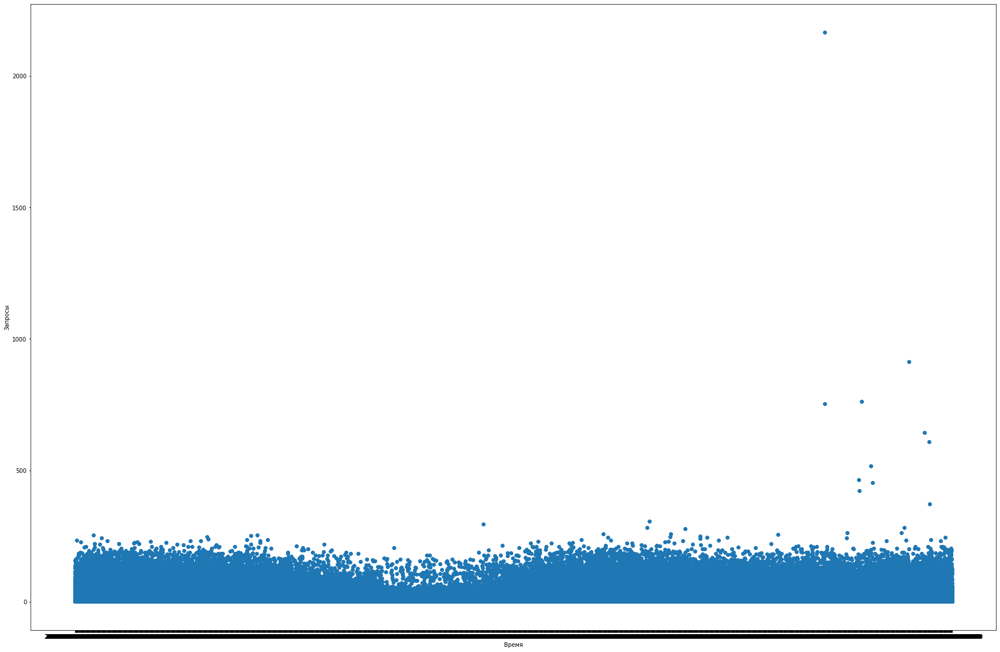

In [29]:
#отрисовываем получившиеся данные 
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(30,20))
plt.scatter(df_n.sort_values('time')['time'],df_n.sort_values('time')['requests'])
plt.xlabel('Время')
plt.ylabel('Запросы')


plt.show()

здесь точечная аномалия, количество некоторых запросов слишком велико

И здесь вопрос, какое кол-во запросов является аномалией.И нужно ли учитывать время суток или нет, по данным разница есть значит будем учитывать

Есть предложение ввести некую классификацию. 
1) Явный выброс (больше 200) - 2
2) Нормальный значение (меньше quantil.075+std*2) - 0
3) Значение больше чем quantil.075+std*2 - 1
Также нужно учитывать время

In [31]:
df_m = df.groupby(['time']).agg({'requests':['describe']})

In [32]:
df_m['porog'] = 0

In [33]:
df_m['requests']

describe                                                  
                       count       mean        std  min  25%  50%   75%    max
time                                                                          
2021-03-30 18:13:00    624.0  11.044872  11.938496  1.0  3.0  8.0  14.0  121.0
2021-03-30 18:13:30    591.0  10.727580  11.006095  1.0  3.0  8.0  14.0   83.0
2021-03-30 18:14:00    563.0  11.390764  12.959562  1.0  2.5  8.0  15.0  110.0
2021-03-30 18:14:30    535.0  11.179439  13.549104  1.0  2.0  8.0  14.0  129.0
2021-03-30 18:15:00    569.0  11.047452  11.969865  1.0  2.0  8.0  15.0   91.0
...                      ...        ...        ...  ...  ...  ...   ...    ...
2021-03-31 18:10:30    659.0  11.321700  14.615009  1.0  3.0  7.0  14.0  126.0
2021-03-31 18:11:00    560.0  11.742857  13.878786  1.0  3.0  9.0  15.0  121.0
2021-03-31 18:11:30    586.0  10.841297  13.489866  1.0  3.0  7.0  14.0  106.0
2021-03-31 18:12:00   1066.0   5.133208   6.773678  1.0  1.0  2.0   7.0   56.0
2021-03-31 18:12:30    551.0   1.010889   0.120111  1.0  1.0  1.0   1.0    3.0

[2880 rows x 8 columns]

In [34]:
df_m = df_m.reset_index()

In [35]:
df_m['requests']['describe']['75%']

0       14.0
1       14.0
2       15.0
3       14.0
4       15.0
        ... 
2875    14.0
2876    15.0
2877    14.0
2878     7.0
2879     1.0
Name: 75%, Length: 2880, dtype: float64

In [36]:
df_m['porog_norm'] = df_m['requests']['describe']['75%'] + df_m['requests']['describe']['std']*2

In [37]:
del df_m['porog']

In [38]:
df_m

time requests                                             \
                          describe                                              
                             count       mean        std  min  25%  50%   75%   
0     2021-03-30 18:13:00    624.0  11.044872  11.938496  1.0  3.0  8.0  14.0   
1     2021-03-30 18:13:30    591.0  10.727580  11.006095  1.0  3.0  8.0  14.0   
2     2021-03-30 18:14:00    563.0  11.390764  12.959562  1.0  2.5  8.0  15.0   
3     2021-03-30 18:14:30    535.0  11.179439  13.549104  1.0  2.0  8.0  14.0   
4     2021-03-30 18:15:00    569.0  11.047452  11.969865  1.0  2.0  8.0  15.0   
...                   ...      ...        ...        ...  ...  ...  ...   ...   
2875  2021-03-31 18:10:30    659.0  11.321700  14.615009  1.0  3.0  7.0  14.0   
2876  2021-03-31 18:11:00    560.0  11.742857  13.878786  1.0  3.0  9.0  15.0   
2877  2021-03-31 18:11:30    586.0  10.841297  13.489866  1.0  3.0  7.0  14.0   
2878  2021-03-31 18:12:00   1066.0   5.133208   6.773678  1.0  1.0  2.0   7.0   
2879  2021-03-31 18:12:30    551.0   1.010889   0.120111  1.0  1.0  1.0   1.0   

            porog_norm  
                        
        max             
0     121.0  37.876991  
1      83.0  36.012191  
2     110.0  40.919123  
3     129.0  41.098209  
4      91.0  38.939730  
...     ...        ...  
2875  126.0  43.230017  
2876  121.0  42.757572  
2877  106.0  40.979732  
2878   56.0  20.547355  
2879    3.0   1.240222  

[2880 rows x 10 columns]

In [39]:
data = pd.DataFrame({'time':df_m['time'],'porog_norm':df_m['porog_norm']})

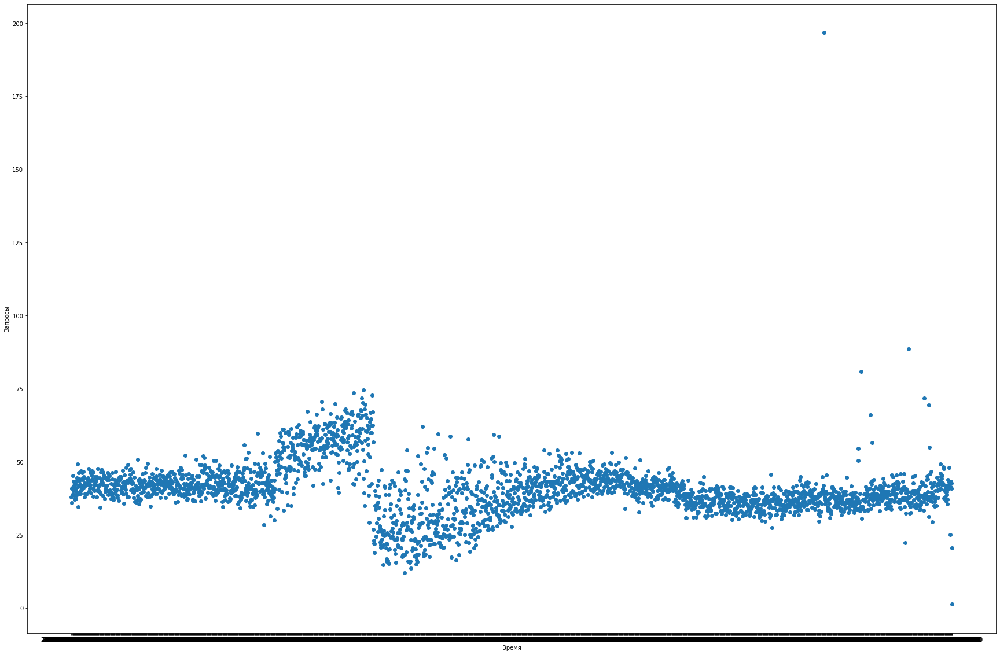

In [39]:

plt.figure(figsize=(30,20))
plt.scatter(data['time'],data['porog_norm'])
plt.xlabel('Время')
plt.ylabel('Запросы')


plt.show()

In [40]:
df_n['sum_'] = df_n['requests']['sum']

In [41]:
df_v = df_n.groupby(['time']).agg({'sum_':['describe']})

In [42]:
df_v['porog_norm'] = df_v['sum_']['describe']['75%'] + df_v['sum_']['describe']['std']*2

In [43]:
df_v = df_v.reset_index()

In [44]:
df_v

time     sum_                                        \
                          describe                                         
                             count       mean        std  min  25%   50%   
0     2021-03-30 18:13:00    397.0  17.360202  18.639827  1.0  6.0  13.0   
1     2021-03-30 18:13:30    375.0  16.906667  16.636386  1.0  5.0  13.0   
2     2021-03-30 18:14:00    356.0  18.014045  20.698978  1.0  4.0  13.0   
3     2021-03-30 18:14:30    345.0  17.336232  20.107053  1.0  4.0  12.0   
4     2021-03-30 18:15:00    362.0  17.364641  19.477515  1.0  4.0  12.0   
...                   ...      ...        ...        ...  ...  ...   ...   
2875  2021-03-31 18:10:30    417.0  17.892086  23.176795  1.0  6.0  12.0   
2876  2021-03-31 18:11:00    353.0  18.628895  22.091647  1.0  5.0  14.0   
2877  2021-03-31 18:11:30    365.0  17.405479  21.150299  1.0  5.0  12.0   
2878  2021-03-31 18:12:00    358.0  15.284916  15.794987  1.0  4.0  11.0   
2879  2021-03-31 18:12:30    127.0   4.385827   4.690496  1.0  2.0   3.0   

                  porog_norm  
                              
       75%    max             
0     23.0  157.0  60.279654  
1     23.0  116.0  56.272772  
2     24.0  154.0  65.397956  
3     23.0  162.0  63.214107  
4     24.0  132.0  62.955030  
...    ...    ...        ...  
2875  23.0  204.0  69.353589  
2876  24.0  196.0  68.183294  
2877  23.0  164.0  65.300597  
2878  22.0  124.0  53.589974  
2879   5.0   33.0  14.380991  

[2880 rows x 10 columns]

In [45]:
data = pd.DataFrame({'time':df_v['time'],'porog_norm':df_v['porog_norm']})

In [46]:
data

,time,porog_norm
0,2021-03-30 18:13:00,60.279654
1,2021-03-30 18:13:30,56.272772
2,2021-03-30 18:14:00,65.397956
3,2021-03-30 18:14:30,63.214107
4,2021-03-30 18:15:00,62.955030
...,...,...
2875,2021-03-31 18:10:30,69.353589
2876,2021-03-31 18:11:00,68.183294
2877,2021-03-31 18:11:30,65.300597
2878,2021-03-31 18:12:00,53.589974


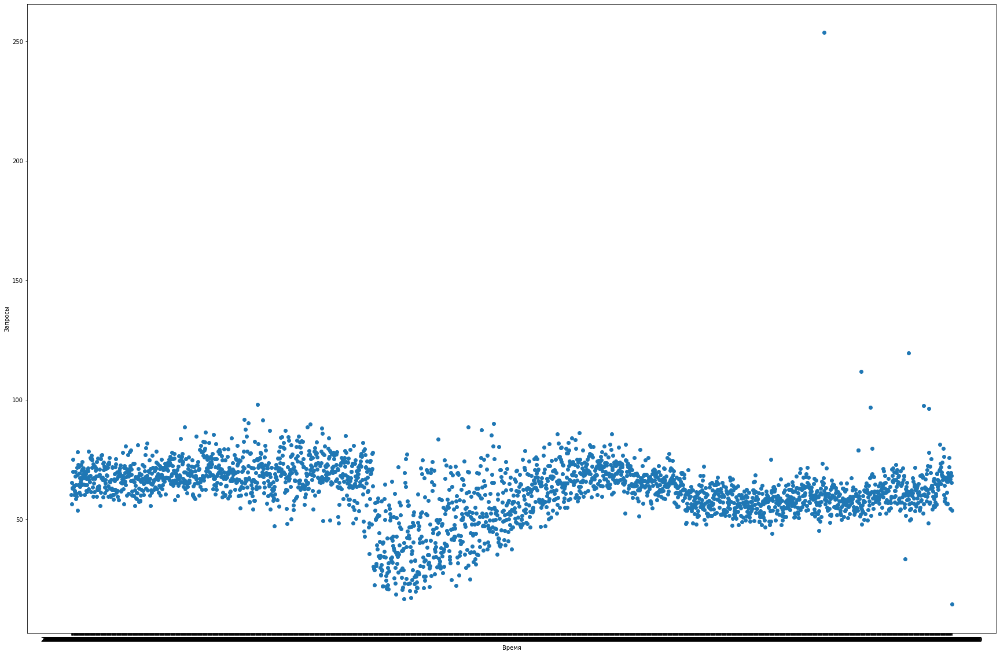

In [47]:
plt.figure(figsize=(30,20))
plt.scatter(data['time'],data['porog_norm'])
plt.xlabel('Время')
plt.ylabel('Запросы')


plt.show()

In [47]:
df_n['class'] = np.where(df_n['sum_']>200,2,0)

In [48]:
df_n

,src_ip,time,requests,sum_,class
,,,sum,,
0,0,2021-03-31 11:52:30,26,26,0
1,0,2021-03-31 11:53:00,6,6,0
2,0,2021-03-31 11:57:30,15,15,0
3,0,2021-03-31 11:58:30,11,11,0
4,0,2021-03-31 11:59:00,3,3,0
...,...,...,...,...,...
800395,106743,2021-03-31 14:19:30,31,31,0
800396,106743,2021-03-31 14:20:00,41,41,0
800397,106744,2021-03-31 12:15:30,1,1,0


In [49]:
data['time']

0       2021-03-30 18:13:00
1       2021-03-30 18:13:30
2       2021-03-30 18:14:00
3       2021-03-30 18:14:30
4       2021-03-30 18:15:00
               ...         
2875    2021-03-31 18:10:30
2876    2021-03-31 18:11:00
2877    2021-03-31 18:11:30
2878    2021-03-31 18:12:00
2879    2021-03-31 18:12:30
Name: time, Length: 2880, dtype: object

In [50]:
df_n.sort_values('time')

,src_ip,time,requests,sum_,class
,,,sum,,
135838,20423,2021-03-30 18:13:00,1,1,0
795831,106419,2021-03-30 18:13:00,6,6,0
333093,44973,2021-03-30 18:13:00,6,6,0
380194,52842,2021-03-30 18:13:00,12,12,0
228274,30904,2021-03-30 18:13:00,2,2,0
...,...,...,...,...,...
766686,100860,2021-03-31 18:12:30,1,1,0
505665,65176,2021-03-31 18:12:30,12,12,0
155282,22180,2021-03-31 18:12:30,10,10,0


In [51]:
df_n['porog_norm'] = 0

In [52]:
res = df_n.merge(data, on='time')
   

/home/leotiv/anaconda3/lib/python3.7/site-packages/pandas/core/reshape/merge.py:618: UserWarning: merging between different levels can give an unintended result (2 levels on the left, 1 on the right)
  warnings.warn(msg, UserWarning)


In [53]:
res.sort_values('time')

,time,"(src_ip, )","(time, )","(requests, sum)","(sum_, )","(class, )","(porog_norm, )",porog_norm
268483,2021-03-30 18:13:00,57421,2021-03-30 18:13:00,21,21,0,0,60.279654
268541,2021-03-30 18:13:00,71045,2021-03-30 18:13:00,62,62,0,0,60.279654
268540,2021-03-30 18:13:00,70800,2021-03-30 18:13:00,17,17,0,0,60.279654
268539,2021-03-30 18:13:00,70577,2021-03-30 18:13:00,6,6,0,0,60.279654
268538,2021-03-30 18:13:00,70440,2021-03-30 18:13:00,30,30,0,0,60.279654
...,...,...,...,...,...,...,...,...
441958,2021-03-31 18:12:30,32312,2021-03-31 18:12:30,9,9,0,0,14.380991
441957,2021-03-31 18:12:30,31107,2021-03-31 18:12:30,5,5,0,0,14.380991
441956,2021-03-31 18:12:30,30872,2021-03-31 18:12:30,6,6,0,0,14.380991
441969,2021-03-31 18:12:30,40706,2021-03-31 18:12:30,4,4,0,0,14.380991


In [54]:
feature_names = res.columns.tolist() 


In [55]:
feature_names

['time',
 ('src_ip', ''),
 ('time', ''),
 ('requests', 'sum'),
 ('sum_', ''),
 ('class', ''),
 ('porog_norm', ''),
 'porog_norm']

In [56]:
res[['time',('src_ip', ''),('sum_', ''),('class', ''),'porog_norm']]

,time,"(src_ip, )","(sum_, )","(class, )",porog_norm
0,2021-03-31 11:52:30,0,26,0,59.678423
1,2021-03-31 11:52:30,168,2,0,59.678423
2,2021-03-31 11:52:30,377,7,0,59.678423
3,2021-03-31 11:52:30,601,9,0,59.678423
4,2021-03-31 11:52:30,1739,18,0,59.678423
...,...,...,...,...,...
800395,2021-03-31 05:10:00,92303,13,0,49.905581
800396,2021-03-31 05:10:00,94592,1,0,49.905581
800397,2021-03-31 05:10:00,94671,6,0,49.905581
800398,2021-03-31 05:10:00,97388,1,0,49.905581


In [57]:
data_new = pd.DataFrame({'time':res['time'],
                         'src_ip':res[('src_ip', '')],
                         'sum_requests':res[('sum_', '')],
                         'porog_norm':res['porog_norm'],
                         'class':res[('class', '')]
                        })

In [58]:
data_new['class'] = np.where(data_new['sum_requests']>200,2,np.where(data_new['sum_requests']>data_new['porog_norm'],1,0))

In [59]:
len_vib = 0
for i in data_new['class']:
    if i == 2:
        len_vib+=1
        print(i)

2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


In [60]:
len_vib

173

,time,src_ip,sum_requests,porog_norm,class
0,2021-03-31 11:52:30,0,26,59.678423,0
1,2021-03-31 11:52:30,168,2,59.678423,0
2,2021-03-31 11:52:30,377,7,59.678423,0
3,2021-03-31 11:52:30,601,9,59.678423,0
4,2021-03-31 11:52:30,1739,18,59.678423,0
5,2021-03-31 11:52:30,2182,12,59.678423,0
6,2021-03-31 11:52:30,2383,1,59.678423,0
7,2021-03-31 11:52:30,2630,7,59.678423,0
8,2021-03-31 11:52:30,2696,1,59.678423,0
9,2021-03-31 11:52:30,2766,29,59.678423,0


На данном этапе мы разбили по классам наши данные и определили порог нормы кол-ва запросов

In [91]:
pd.options.display.max_columns = 10


In [92]:
data_new

,time,src_ip,sum_requests,porog_norm,class
0,2021-03-31 11:52:30,0,26,59.678423,0
1,2021-03-31 11:52:30,168,2,59.678423,0
2,2021-03-31 11:52:30,377,7,59.678423,0
3,2021-03-31 11:52:30,601,9,59.678423,0
4,2021-03-31 11:52:30,1739,18,59.678423,0
...,...,...,...,...,...
800395,2021-03-31 05:10:00,92303,13,49.905581,0
800396,2021-03-31 05:10:00,94592,1,49.905581,0
800397,2021-03-31 05:10:00,94671,6,49.905581,0
800398,2021-03-31 05:10:00,97388,1,49.905581,0


In [62]:
pd.set_option('display.max_rows', 100000)

In [63]:
data_2 = data_new[data_new['class']==2]

In [64]:
data_0  = data_new[data_new['class']==0]
data_1 = data_new[data_new['class']==1]

Text(0, 0.5, 'Запросы')

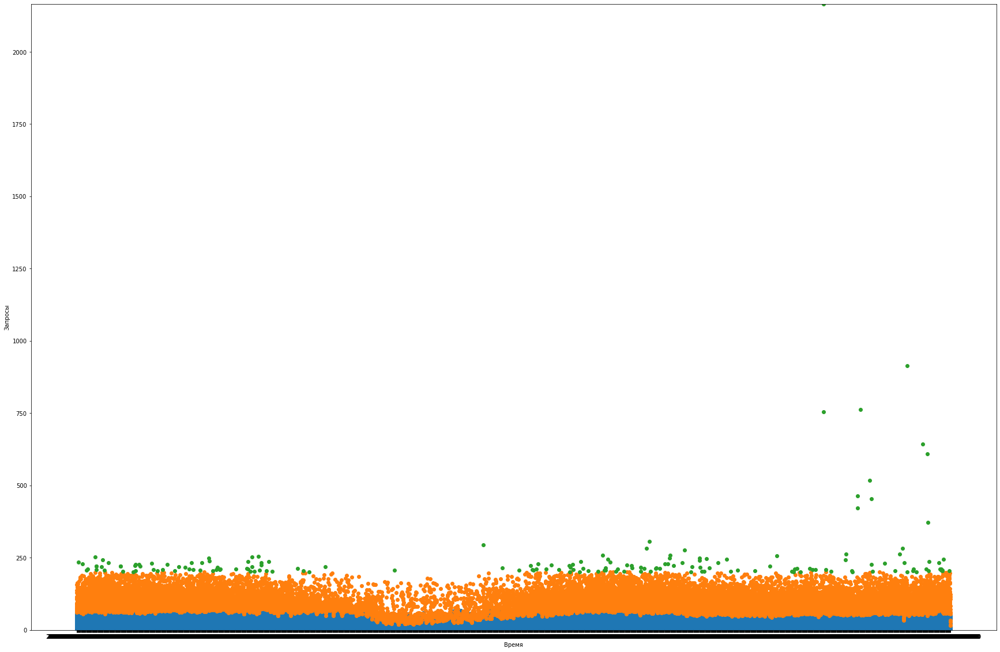

In [159]:
plt.figure(figsize=(30,20))
plt.scatter(data_0.sort_values('time')['time'],data_0.sort_values('time')['sum_requests'])
plt.scatter(data_1.sort_values('time')['time'],data_1.sort_values('time')['sum_requests'])
plt.scatter(data_2.sort_values('time')['time'],data_2.sort_values('time')['sum_requests'])
plt.ylim(0, 2166)
plt.xlabel('Время')
plt.ylabel('Запросы')

In [65]:
print("Норма",len(data_0)/len(data_new),'%')
print("Выше чем кватиль 0.75 + std*2:",len(data_1)/len(data_new),'%')
print("Аномалии:",len(data_2)/len(data_new),'%')

Норма 0.9636156921539231 %
Выше чем кватиль 0.75 + std*2: 0.03616816591704148 %
Аномалии: 0.00021614192903548227 %


На данном этапе я думаю, что выбрать константное число (200) для  определения аномалии было не лучшим решением и я решил поправить данные

In [66]:
d = df_n.groupby(['time']).agg({'sum_':['describe']})

In [68]:
d['porog_norm'] = d['sum_']['describe']['75%'] + d['sum_']['describe']['std']*2

In [70]:
d = d.reset_index()

In [85]:
d['porog_anomal'] = d['sum_']['describe']['75%'] + d['sum_']['describe']['std']*6

In [93]:
d

time     sum_                              ...        \
                          describe                              ...         
                             count       mean         std  min  ...   50%   
0     2021-03-30 18:13:00    397.0  17.360202   18.639827  1.0  ...  13.0   
1     2021-03-30 18:13:30    375.0  16.906667   16.636386  1.0  ...  13.0   
2     2021-03-30 18:14:00    356.0  18.014045   20.698978  1.0  ...  13.0   
3     2021-03-30 18:14:30    345.0  17.336232   20.107053  1.0  ...  12.0   
4     2021-03-30 18:15:00    362.0  17.364641   19.477515  1.0  ...  12.0   
5     2021-03-30 18:15:30    357.0  20.540616   24.460508  1.0  ...  14.0   
6     2021-03-30 18:16:00    362.0  19.049724   22.435818  1.0  ...  14.0   
7     2021-03-30 18:16:30    371.0  18.204852   20.239674  1.0  ...  13.0   
8     2021-03-30 18:17:00    363.0  16.374656   19.093767  1.0  ...  12.0   
9     2021-03-30 18:17:30    353.0  16.824363   20.992363  1.0  ...  12.0   
10    2021-03-30 18:18:00    376.0  17.678191   18.834299  1.0  ...  14.0   
11    2021-03-30 18:18:30    359.0  16.334262   20.518958  1.0  ...  10.0   
12    2021-03-30 18:19:00    398.0  18.590452   21.964262  1.0  ...  13.0   
13    2021-03-30 18:19:30    386.0  18.606218   23.455298  1.0  ...  13.0   
14    2021-03-30 18:20:00    400.0  16.592500   21.020969  1.0  ...  12.0   
15    2021-03-30 18:20:30    390.0  16.830769   17.820934  1.0  ...  12.0   
16    2021-03-30 18:21:00    398.0  17.000000   18.308028  1.0  ...  13.0   
17    2021-03-30 18:21:30    379.0  16.459103   19.308147  1.0  ...  12.0   
18    2021-03-30 18:22:00    400.0  18.192500   24.362559  1.0  ...  12.0   
19    2021-03-30 18:22:30    399.0  18.052632   23.221670  1.0  ...  12.0   
20    2021-03-30 18:23:00    387.0  19.542636   26.534172  1.0  ...  12.0   
21    2021-03-30 18:23:30    392.0  15.145408   15.852316  1.0  ...  10.0   
22    2021-03-30 18:24:00    386.0  17.378238   20.230797  1.0  ...  12.0   
23    2021-03-30 18:24:30    385.0  19.309091   23.884718  1.0  ...  13.0   
24    2021-03-30 18:25:00    410.0  19.548780   22.961833  1.0  ...  15.0   
25    2021-03-30 18:25:30    413.0  17.588378   18.656321  1.0  ...  14.0   
26    2021-03-30 18:26:00    399.0  18.741855   22.874379  1.0  ...  13.0   
27    2021-03-30 18:26:30    395.0  17.612658   19.786278  1.0  ...  14.0   
28    2021-03-30 18:27:00    359.0  17.281337   22.651389  1.0  ...  12.0   
29    2021-03-30 18:27:30    360.0  17.583333   18.998717  1.0  ...  13.0   
30    2021-03-30 18:28:00    366.0  17.530055   21.312108  1.0  ...  12.0   
31    2021-03-30 18:28:30    359.0  20.746518   23.918737  1.0  ...  15.0   
32    2021-03-30 18:29:00    375.0  18.130667   21.769613  1.0  ...  12.0   
33    2021-03-30 18:29:30    368.0  20.214674   23.102428  1.0  ...  15.0   
34    2021-03-30 18:30:00    353.0  17.606232   20.693671  1.0  ...  12.0   
35    2021-03-30 18:30:30    364.0  18.945055   21.707478  1.0  ...  14.0   
36    2021-03-30 18:31:00    360.0  19.888889   25.506652  1.0  ...  14.0   
37    2021-03-30 18:31:30    351.0  19.000000   22.584192  1.0  ...  13.0   
38    2021-03-30 18:32:00    337.0  20.403561   24.217216  1.0  ...  13.0   
39    2021-03-30 18:32:30    339.0  19.085546   20.026500  1.0  ...  15.0   
40    2021-03-30 18:33:00    351.0  19.529915   23.711567  1.0  ...  13.0   
41    2021-03-30 18:33:30    338.0  19.843195   22.535082  1.0  ...  15.0   
42    2021-03-30 18:34:00    337.0  18.798220   22.119150  1.0  ...  15.0   
43    2021-03-30 18:34:30    357.0  17.557423   18.160031  1.0  ...  14.0   
44    2021-03-30 18:35:00    336.0  19.437500   22.787709  1.0  ...  14.0   
45    2021-03-30 18:35:30    304.0  18.437500   20.227486  1.0  ...  13.5   
46    2021-03-30 18:36:00    333.0  18.690691   21.978024  1.0  ...  14.0   
47    2021-03-30 18:36:30    345.0  19.078261   22.881957  1.0  ...  14.0   
48    2021-03-30 18:37:00    321.0  18.647975   21.046320  1.0  ...  14.0   
49    2021-03-30 

In [87]:
da = pd.DataFrame({'time':d['time'],'porog_norm':d['porog_norm'],'porog_anomal':d['porog_anomal']})

In [88]:
da

,time,porog_norm,porog_anomal
0,2021-03-30 18:13:00,60.279654,134.838963
1,2021-03-30 18:13:30,56.272772,122.818316
2,2021-03-30 18:14:00,65.397956,148.193868
3,2021-03-30 18:14:30,63.214107,143.642320
4,2021-03-30 18:15:00,62.955030,140.865091
5,2021-03-30 18:15:30,74.921016,172.763049
6,2021-03-30 18:16:00,69.871637,159.614910
7,2021-03-30 18:16:30,63.479348,144.438045
8,2021-03-30 18:17:00,60.187535,136.562604
9,2021-03-30 18:17:30,63.984725,147.954176


In [94]:
data

,time,porog_norm
0,2021-03-30 18:13:00,60.279654
1,2021-03-30 18:13:30,56.272772
2,2021-03-30 18:14:00,65.397956
3,2021-03-30 18:14:30,63.214107
4,2021-03-30 18:15:00,62.955030
5,2021-03-30 18:15:30,74.921016
6,2021-03-30 18:16:00,69.871637
7,2021-03-30 18:16:30,63.479348
8,2021-03-30 18:17:00,60.187535
9,2021-03-30 18:17:30,63.984725


In [95]:
res_1 = df_n.merge(da, on='time')

/home/leotiv/anaconda3/lib/python3.7/site-packages/pandas/core/reshape/merge.py:618: UserWarning: merging between different levels can give an unintended result (2 levels on the left, 1 on the right)
  warnings.warn(msg, UserWarning)


In [96]:
res_1

,time,"(src_ip, )","(time, )","(requests, sum)","(sum_, )","(class, )","(porog_norm, )",porog_norm,porog_anomal
0,2021-03-31 11:52:30,0,2021-03-31 11:52:30,26,26,0,0,59.678423,137.035270
1,2021-03-31 11:52:30,168,2021-03-31 11:52:30,2,2,0,0,59.678423,137.035270
2,2021-03-31 11:52:30,377,2021-03-31 11:52:30,7,7,0,0,59.678423,137.035270
3,2021-03-31 11:52:30,601,2021-03-31 11:52:30,9,9,0,0,59.678423,137.035270
4,2021-03-31 11:52:30,1739,2021-03-31 11:52:30,18,18,0,0,59.678423,137.035270
...,...,...,...,...,...,...,...,...,...
800395,2021-03-31 05:10:00,92303,2021-03-31 05:10:00,13,13,0,0,49.905581,125.716744
800396,2021-03-31 05:10:00,94592,2021-03-31 05:10:00,1,1,0,0,49.905581,125.716744
800397,2021-03-31 05:10:00,94671,2021-03-31 05:10:00,6,6,0,0,49.905581,125.716744
800398,2021-03-31 05:10:00,97388,2021-03-31 05:10:00,1,1,0,0,49.905581,125.716744


In [97]:
da_new = pd.DataFrame({'time':res_1['time'],
                         'src_ip':res_1[('src_ip', '')],
                         'sum_requests':res_1[('sum_', '')],
                         'porog_norm':res_1['porog_norm'],
                       'porog_anomal':res_1['porog_anomal'],
                         'class':res_1[('class', '')]
                        })

In [99]:
da_new.sort_values('time')

,time,src_ip,sum_requests,porog_norm,porog_anomal,class
268483,2021-03-30 18:13:00,57421,21,60.279654,134.838963,0
268541,2021-03-30 18:13:00,71045,62,60.279654,134.838963,0
268540,2021-03-30 18:13:00,70800,17,60.279654,134.838963,0
268539,2021-03-30 18:13:00,70577,6,60.279654,134.838963,0
268538,2021-03-30 18:13:00,70440,30,60.279654,134.838963,0
...,...,...,...,...,...,...
441958,2021-03-31 18:12:30,32312,9,14.380991,33.142974,0
441957,2021-03-31 18:12:30,31107,5,14.380991,33.142974,0
441956,2021-03-31 18:12:30,30872,6,14.380991,33.142974,0
441969,2021-03-31 18:12:30,40706,4,14.380991,33.142974,0


In [100]:
da_new['class'] = np.where(da_new['sum_requests']>da_new['porog_anomal'],2,np.where(da_new['sum_requests']>da_new['porog_norm'],1,0))

In [102]:
da_new[da_new['class']==2]

,time,src_ip,sum_requests,porog_norm,porog_anomal,class
898,2021-03-31 11:57:30,8022,148,57.011727,131.035182,2
1803,2021-03-31 11:59:00,27070,163,63.746697,151.240091,2
2040,2021-03-31 11:59:00,72447,153,63.746697,151.240091,2
2323,2021-03-31 11:59:30,49377,156,59.546529,140.639588,2
2419,2021-03-31 11:59:30,60197,188,59.546529,140.639588,2
2805,2021-03-31 12:00:30,58509,148,53.911146,125.733439,2
3021,2021-03-31 14:49:00,14800,129,54.274431,122.823292,2
3315,2021-03-31 14:49:00,86167,127,54.274431,122.823292,2
3778,2021-03-31 14:49:30,101862,131,53.614680,122.844039,2
4195,2021-03-31 14:43:30,39026,2166,253.661335,716.984005,2


In [103]:
da_2 = da_new[data_new['class']==2]
da_1 = da_new[data_new['class']==1]
da_0 = da_new[data_new['class']==0]

Text(0, 0.5, 'Запросы')

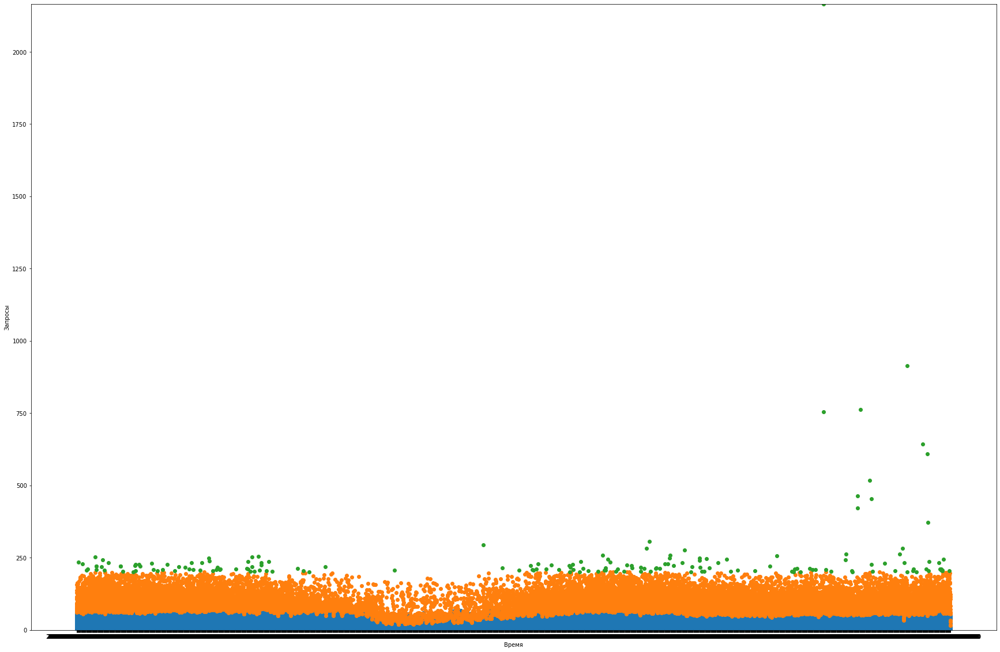

In [105]:
#отрисовываем получившиеся данные 
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(30,20))
plt.scatter(da_0.sort_values('time')['time'],da_0.sort_values('time')['sum_requests'])
plt.scatter(da_1.sort_values('time')['time'],da_1.sort_values('time')['sum_requests'])
plt.scatter(da_2.sort_values('time')['time'],da_2.sort_values('time')['sum_requests'])
plt.ylim(0, 2166)
plt.xlabel('Время')
plt.ylabel('Запросы')

In [107]:
da_new

,time,src_ip,sum_requests,porog_norm,porog_anomal,class
0,2021-03-31 11:52:30,0,26,59.678423,137.035270,0
1,2021-03-31 11:52:30,168,2,59.678423,137.035270,0
2,2021-03-31 11:52:30,377,7,59.678423,137.035270,0
3,2021-03-31 11:52:30,601,9,59.678423,137.035270,0
4,2021-03-31 11:52:30,1739,18,59.678423,137.035270,0
...,...,...,...,...,...,...
800395,2021-03-31 05:10:00,92303,13,49.905581,125.716744,0
800396,2021-03-31 05:10:00,94592,1,49.905581,125.716744,0
800397,2021-03-31 05:10:00,94671,6,49.905581,125.716744,0
800398,2021-03-31 05:10:00,97388,1,49.905581,125.716744,0


In [135]:
X = da_new[['time','src_ip','sum_requests','porog_norm','porog_anomal']]

In [136]:
y = da_new['class']

In [137]:
X

,time,src_ip,sum_requests,porog_norm,porog_anomal
0,2021-03-31 11:52:30,0,26,59.678423,137.035270
1,2021-03-31 11:52:30,168,2,59.678423,137.035270
2,2021-03-31 11:52:30,377,7,59.678423,137.035270
3,2021-03-31 11:52:30,601,9,59.678423,137.035270
4,2021-03-31 11:52:30,1739,18,59.678423,137.035270
...,...,...,...,...,...
800395,2021-03-31 05:10:00,92303,13,49.905581,125.716744
800396,2021-03-31 05:10:00,94592,1,49.905581,125.716744
800397,2021-03-31 05:10:00,94671,6,49.905581,125.716744
800398,2021-03-31 05:10:00,97388,1,49.905581,125.716744


In [138]:
y

0         0
1         0
2         0
3         0
4         0
         ..
800395    0
800396    0
800397    0
800398    0
800399    0
Name: class, Length: 800400, dtype: int64

In [186]:
from sklearn.model_selection import train_test_split

#делим данные на тренировачные и тестовые в отношении 0.33
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [140]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier


In [141]:
model = RandomForestClassifier(n_estimators=20,random_state=42)

In [142]:
model
from pandas.plotting._matplotlib import converter
converter.register()

In [179]:
model.fit(X_train,y_train)

ValueError: could not convert string to float: '2021-03-31 14:36:30'

In [169]:
# X_train['time'] = X_train['time'].app

/home/leotiv/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [184]:
def split_str(str_):
    date = str_.split()[0].replace('-','')
    time = str_.split()[1].replace(':','')
    fl = float(date+ '.' + time)
    print(fl,date,time)
    return fl

In [191]:
X_test['time'] = X_test['time'].apply(split_str)

20210331.12243 20210331 122430
20210331.0042 20210331 004200
20210330.20123 20210330 201230
20210330.22553 20210330 225530
20210331.0958 20210331 095800
20210330.1909 20210330 190900
20210331.0921 20210331 092100
20210331.14053 20210331 140530
20210331.00233 20210331 002330
20210331.1057 20210331 105700
20210331.1412 20210331 141200
20210331.07013 20210331 070130
20210331.15 20210331 150000
20210331.06353 20210331 063530
20210330.1937 20210330 193700
20210331.14183 20210331 141830
20210331.1534 20210331 153400
20210330.18493 20210330 184930
20210331.17423 20210331 174230
20210331.1052 20210331 105200
20210331.1156 20210331 115600
20210331.1543 20210331 154300
20210330.2231 20210330 223100
20210330.22543 20210330 225430
20210331.12453 20210331 124530
20210331.1304 20210331 130400
20210331.0256 20210331 025600
20210331.0016 20210331 001600
20210331.1712 20210331 171200
20210330.18243 20210330 182430
20210331.1452 20210331 145200
20210331.0147 20210331 014700
20210331.1457 20210331 145700

20210331.15323 20210331 153230
20210331.10083 20210331 100830
20210330.20223 20210330 202230
20210331.0844 20210331 084400
20210331.10443 20210331 104430
20210331.15133 20210331 151330
20210331.09463 20210331 094630
20210330.19123 20210330 191230
20210330.212 20210330 212000
20210331.1147 20210331 114700
20210331.12 20210331 120000
20210331.105 20210331 105000
20210331.09043 20210331 090430
20210330.21533 20210330 215330
20210331.1237 20210331 123700
20210330.2144 20210330 214400
20210330.21353 20210330 213530
20210330.21383 20210330 213830
20210330.22263 20210330 222630
20210331.1006 20210331 100600
20210331.1704 20210331 170400
20210331.0729 20210331 072900
20210331.12253 20210331 122530
20210331.11503 20210331 115030
20210331.0021 20210331 002100
20210330.22293 20210330 222930
20210331.17203 20210331 172030
20210331.1511 20210331 151100
20210331.0929 20210331 092900
20210331.165 20210331 165000
20210330.19143 20210330 191430
20210330.204 20210330 204000
20210331.07543 20210331 07543

20210331.1742 20210331 174200
20210331.095 20210331 095000
20210331.094 20210331 094000
20210331.1035 20210331 103500
20210330.18513 20210330 185130
20210330.19443 20210330 194430
20210331.12043 20210331 120430
20210331.0607 20210331 060700
20210331.10233 20210331 102330
20210331.12353 20210331 123530
20210331.01293 20210331 012930
20210330.18563 20210330 185630
20210331.15303 20210331 153030
20210331.06343 20210331 063430
20210331.1657 20210331 165700
20210331.13333 20210331 133330
20210331.10363 20210331 103630
20210331.18103 20210331 181030
20210331.05133 20210331 051330
20210331.1241 20210331 124100
20210330.2047 20210330 204700
20210331.10103 20210331 101030
20210331.1123 20210331 112300
20210331.11193 20210331 111930
20210331.12403 20210331 124030
20210331.1653 20210331 165300
20210331.00083 20210331 000830
20210331.1019 20210331 101900
20210331.14353 20210331 143530
20210331.15383 20210331 153830
20210331.1543 20210331 154300
20210331.1455 20210331 145500
20210331.1312 20210331 

20210331.01333 20210331 013330
20210331.07183 20210331 071830
20210331.1212 20210331 121200
20210331.14563 20210331 145630
20210331.09093 20210331 090930
20210330.22443 20210330 224430
20210331.1 20210331 100000
20210330.20433 20210330 204330
20210331.1331 20210331 133100
20210331.1054 20210331 105400
20210330.2057 20210330 205700
20210331.1222 20210331 122200
20210331.1408 20210331 140800
20210331.00503 20210331 005030
20210330.21343 20210330 213430
20210331.15223 20210331 152230
20210331.0013 20210331 001300
20210330.23583 20210330 235830
20210330.21483 20210330 214830
20210331.07393 20210331 073930
20210331.07313 20210331 073130
20210331.1101 20210331 110100
20210330.2109 20210330 210900
20210331.10053 20210331 100530
20210331.10183 20210331 101830
20210330.2012 20210330 201200
20210330.20283 20210330 202830
20210331.1008 20210331 100800
20210330.18153 20210330 181530
20210331.0916 20210331 091600
20210331.1307 20210331 130700
20210331.0819 20210331 081900
20210331.1631 20210331 163

20210331.0804 20210331 080400
20210331.16323 20210331 163230
20210330.213 20210330 213000
20210331.15193 20210331 151930
20210331.08563 20210331 085630
20210331.0651 20210331 065100
20210331.1225 20210331 122500
20210330.1848 20210330 184800
20210331.12253 20210331 122530
20210330.22433 20210330 224330
20210330.2249 20210330 224900
20210330.18383 20210330 183830
20210331.05573 20210331 055730
20210331.1022 20210331 102200
20210331.0054 20210331 005400
20210331.0027 20210331 002700
20210331.14513 20210331 145130
20210331.10253 20210331 102530
20210330.2141 20210330 214100
20210330.2033 20210330 203300
20210331.1459 20210331 145900
20210331.0903 20210331 090300
20210330.1823 20210330 182300
20210331.06183 20210331 061830
20210330.2112 20210330 211200
20210330.2132 20210330 213200
20210331.09473 20210331 094730
20210331.0356 20210331 035600
20210331.01383 20210331 013830
20210331.10513 20210331 105130
20210331.0157 20210331 015700
20210331.07173 20210331 071730
20210331.08453 20210331 084

20210330.20203 20210330 202030
20210331.1303 20210331 130300
20210331.1426 20210331 142600
20210331.1407 20210331 140700
20210331.0904 20210331 090400
20210331.1253 20210331 125300
20210331.11003 20210331 110030
20210331.11543 20210331 115430
20210331.0208 20210331 020800
20210331.1259 20210331 125900
20210331.12213 20210331 122130
20210331.0835 20210331 083500
20210331.05593 20210331 055930
20210330.18253 20210330 182530
20210331.12093 20210331 120930
20210331.1031 20210331 103100
20210330.1824 20210330 182400
20210331.1242 20210331 124200
20210331.17513 20210331 175130
20210331.0316 20210331 031600
20210331.16013 20210331 160130
20210331.071 20210331 071000
20210330.20183 20210330 201830
20210331.1522 20210331 152200
20210330.2144 20210330 214400
20210331.1704 20210331 170400
20210331.11123 20210331 111230
20210331.11033 20210331 110330
20210331.14213 20210331 142130
20210330.18333 20210330 183330
20210331.1326 20210331 132600
20210330.20093 20210330 200930
20210331.12303 20210331 12

20210331.1223 20210331 122300
20210331.14393 20210331 143930
20210331.1754 20210331 175400
20210331.16053 20210331 160530
20210331.12393 20210331 123930
20210330.1832 20210330 183200
20210331.00323 20210331 003230
20210331.01133 20210331 011330
20210331.0923 20210331 092300
20210331.06283 20210331 062830
20210331.08473 20210331 084730
20210331.00563 20210331 005630
20210331.1003 20210331 100300
20210331.12003 20210331 120030
20210330.2217 20210330 221700
20210331.01303 20210331 013030
20210331.1634 20210331 163400
20210330.2158 20210330 215800
20210331.0953 20210331 095300
20210331.14013 20210331 140130
20210330.1938 20210330 193800
20210331.10203 20210331 102030
20210331.06003 20210331 060030
20210331.09163 20210331 091630
20210330.20383 20210330 203830
20210331.16043 20210331 160430
20210331.13193 20210331 131930
20210331.11173 20210331 111730
20210330.19033 20210330 190330
20210331.01443 20210331 014430
20210331.13353 20210331 133530
20210330.1851 20210330 185100
20210331.15293 2021

20210331.1637 20210331 163700
20210330.203 20210330 203000
20210331.11483 20210331 114830
20210331.14453 20210331 144530
20210331.15153 20210331 151530
20210331.0731 20210331 073100
20210330.19343 20210330 193430
20210330.20143 20210330 201430
20210330.2055 20210330 205500
20210331.09553 20210331 095530
20210331.0955 20210331 095500
20210331.12113 20210331 121130
20210331.04153 20210331 041530
20210330.18503 20210330 185030
20210331.13103 20210331 131030
20210331.12173 20210331 121730
20210331.14393 20210331 143930
20210331.1459 20210331 145900
20210331.12413 20210331 124130
20210331.0122 20210331 012200
20210331.1449 20210331 144900
20210331.0306 20210331 030600
20210331.12343 20210331 123430
20210330.2328 20210330 232800
20210331.12563 20210331 125630
20210331.03573 20210331 035730
20210331.17303 20210331 173030
20210330.2118 20210330 211800
20210331.1232 20210331 123200
20210331.12363 20210331 123630
20210331.1329 20210331 132900
20210331.13143 20210331 131430
20210331.12073 2021033

20210331.12063 20210331 120630
20210330.184 20210330 184000
20210331.07503 20210331 075030
20210330.18263 20210330 182630
20210331.0905 20210331 090500
20210331.1117 20210331 111700
20210331.1616 20210331 161600
20210331.11133 20210331 111330
20210330.1843 20210330 184300
20210331.1409 20210331 140900
20210331.05343 20210331 053430
20210331.15533 20210331 155330
20210330.19573 20210330 195730
20210331.11343 20210331 113430
20210331.10363 20210331 103630
20210331.07573 20210331 075730
20210331.1104 20210331 110400
20210331.09103 20210331 091030
20210331.07453 20210331 074530
20210331.1659 20210331 165900
20210330.2017 20210330 201700
20210331.11583 20210331 115830
20210330.21593 20210330 215930
20210331.093 20210331 093000
20210330.2049 20210330 204900
20210330.2305 20210330 230500
20210331.1627 20210331 162700
20210331.17233 20210331 172330
20210331.16113 20210331 161130
20210331.1209 20210331 120900
20210331.1757 20210331 175700
20210331.12093 20210331 120930
20210330.21433 20210330 2

20210331.14573 20210331 145730
20210331.08153 20210331 081530
20210331.14503 20210331 145030
20210331.08563 20210331 085630
20210330.19493 20210330 194930
20210331.1152 20210331 115200
20210331.0236 20210331 023600
20210331.16323 20210331 163230
20210331.16263 20210331 162630
20210331.1807 20210331 180700
20210331.1754 20210331 175400
20210331.0849 20210331 084900
20210330.2224 20210330 222400
20210331.0933 20210331 093300
20210331.08193 20210331 081930
20210331.15023 20210331 150230
20210331.1726 20210331 172600
20210331.14203 20210331 142030
20210330.2222 20210330 222200
20210330.22023 20210330 220230
20210331.13103 20210331 131030
20210331.1414 20210331 141400
20210331.1743 20210331 174300
20210330.22573 20210330 225730
20210331.09483 20210331 094830
20210331.17333 20210331 173330
20210330.2105 20210330 210500
20210331.17593 20210331 175930
20210331.17023 20210331 170230
20210331.0816 20210331 081600
20210331.13213 20210331 132130
20210331.1503 20210331 150300
20210331.13433 2021033

20210330.20083 20210330 200830
20210330.1854 20210330 185400
20210331.0724 20210331 072400
20210331.10433 20210331 104330
20210331.073 20210331 073000
20210331.13443 20210331 134430
20210331.17 20210331 170000
20210331.10323 20210331 103230
20210331.10493 20210331 104930
20210331.0225 20210331 022500
20210331.0954 20210331 095400
20210331.12523 20210331 125230
20210331.1706 20210331 170600
20210331.0803 20210331 080300
20210331.16473 20210331 164730
20210331.1445 20210331 144500
20210331.04223 20210331 042230
20210331.0039 20210331 003900
20210331.15453 20210331 154530
20210331.0759 20210331 075900
20210331.12243 20210331 122430
20210331.16143 20210331 161430
20210331.10163 20210331 101630
20210331.13463 20210331 134630
20210331.00333 20210331 003330
20210331.17143 20210331 171430
20210331.10513 20210331 105130
20210331.06003 20210331 060030
20210330.23563 20210330 235630
20210331.09253 20210331 092530
20210331.08003 20210331 080030
20210331.1022 20210331 102200
20210331.10533 20210331

20210331.17223 20210331 172230
20210331.0726 20210331 072600
20210330.18313 20210330 183130
20210330.22003 20210330 220030
20210331.13333 20210331 133330
20210331.0111 20210331 011100
20210331.16283 20210331 162830
20210331.17373 20210331 173730
20210331.1414 20210331 141400
20210330.1919 20210330 191900
20210330.2225 20210330 222500
20210330.2232 20210330 223200
20210331.1516 20210331 151600
20210330.23043 20210330 230430
20210331.17413 20210331 174130
20210330.2338 20210330 233800
20210331.154 20210331 154000
20210330.18243 20210330 182430
20210331.11463 20210331 114630
20210331.0944 20210331 094400
20210331.12543 20210331 125430
20210330.20333 20210330 203330
20210331.08033 20210331 080330
20210330.22083 20210330 220830
20210331.1346 20210331 134600
20210331.09013 20210331 090130
20210331.16383 20210331 163830
20210331.10383 20210331 103830
20210331.0538 20210331 053800
20210331.16483 20210331 164830
20210331.06573 20210331 065730
20210331.15123 20210331 151230
20210331.09573 202103

20210331.14023 20210331 140230
20210331.14213 20210331 142130
20210331.09 20210331 090000
20210331.17053 20210331 170530
20210331.1419 20210331 141900
20210331.1034 20210331 103400
20210331.1144 20210331 114400
20210330.19163 20210330 191630
20210330.19373 20210330 193730
20210331.1639 20210331 163900
20210331.0719 20210331 071900
20210330.2125 20210330 212500
20210331.1345 20210331 134500
20210331.11273 20210331 112730
20210330.1911 20210330 191100
20210331.0839 20210331 083900
20210331.0936 20210331 093600
20210331.1056 20210331 105600
20210331.17363 20210331 173630
20210331.10183 20210331 101830
20210331.1414 20210331 141400
20210330.21563 20210330 215630
20210331.09333 20210331 093330
20210331.16373 20210331 163730
20210331.01553 20210331 015530
20210331.1201 20210331 120100
20210331.1049 20210331 104900
20210331.12493 20210331 124930
20210331.11143 20210331 111430
20210331.0647 20210331 064700
20210331.0833 20210331 083300
20210330.18233 20210330 182330
20210330.2114 20210330 2114

20210331.1133 20210331 113300
20210330.2225 20210330 222500
20210330.1854 20210330 185400
20210331.0931 20210331 093100
20210331.16073 20210331 160730
20210331.08313 20210331 083130
20210331.0326 20210331 032600
20210330.18473 20210330 184730
20210331.10163 20210331 101630
20210330.1849 20210330 184900
20210331.10073 20210331 100730
20210331.153 20210331 153000
20210330.2146 20210330 214600
20210331.14413 20210331 144130
20210331.12503 20210331 125030
20210331.0009 20210331 000900
20210330.21103 20210330 211030
20210331.14193 20210331 141930
20210330.20093 20210330 200930
20210331.09153 20210331 091530
20210331.0804 20210331 080400
20210331.0755 20210331 075500
20210330.20513 20210330 205130
20210331.11283 20210331 112830
20210330.22183 20210330 221830
20210330.18513 20210330 185130
20210331.15413 20210331 154130
20210331.1201 20210331 120100
20210331.1337 20210331 133700
20210331.1541 20210331 154100
20210331.12453 20210331 124530
20210331.00383 20210331 003830
20210331.15473 20210331

20210331.10253 20210331 102530
20210331.1318 20210331 131800
20210331.00353 20210331 003530
20210331.1203 20210331 120300
20210331.1416 20210331 141600
20210331.10323 20210331 103230
20210331.1306 20210331 130600
20210331.14153 20210331 141530
20210331.0903 20210331 090300
20210330.2332 20210330 233200
20210330.19113 20210330 191130
20210330.19023 20210330 190230
20210331.13073 20210331 130730
20210330.20023 20210330 200230
20210331.1736 20210331 173600
20210330.2106 20210330 210600
20210331.0911 20210331 091100
20210331.12353 20210331 123530
20210331.12153 20210331 121530
20210331.0301 20210331 030100
20210330.2236 20210330 223600
20210331.10373 20210331 103730
20210331.07253 20210331 072530
20210330.1835 20210330 183500
20210330.2356 20210330 235600
20210331.15493 20210331 154930
20210331.13143 20210331 131430
20210331.1024 20210331 102400
20210330.19523 20210330 195230
20210330.2129 20210330 212900
20210330.20083 20210330 200830
20210331.12523 20210331 125230
20210331.115 20210331 1

20210331.093 20210331 093000
20210331.15103 20210331 151030
20210330.2035 20210330 203500
20210331.1715 20210331 171500
20210330.1912 20210330 191200
20210331.09593 20210331 095930
20210330.20123 20210330 201230
20210331.08543 20210331 085430
20210331.10043 20210331 100430
20210331.1504 20210331 150400
20210331.07223 20210331 072230
20210331.00143 20210331 001430
20210331.1302 20210331 130200
20210331.10283 20210331 102830
20210331.0951 20210331 095100
20210331.0924 20210331 092400
20210331.09563 20210331 095630
20210330.22233 20210330 222330
20210330.19363 20210330 193630
20210331.081 20210331 081000
20210331.0938 20210331 093800
20210330.184 20210330 184000
20210331.0915 20210331 091500
20210331.11383 20210331 113830
20210331.16213 20210331 162130
20210330.205 20210330 205000
20210331.1201 20210331 120100
20210331.08413 20210331 084130
20210331.1048 20210331 104800
20210331.16463 20210331 164630
20210331.1739 20210331 173900
20210331.072 20210331 072000
20210331.1523 20210331 152300


20210331.10223 20210331 102230
20210331.0222 20210331 022200
20210331.1436 20210331 143600
20210331.0848 20210331 084800
20210331.00523 20210331 005230
20210331.00023 20210331 000230
20210330.21253 20210330 212530
20210331.07583 20210331 075830
20210331.1618 20210331 161800
20210331.1439 20210331 143900
20210331.17563 20210331 175630
20210331.13313 20210331 133130
20210330.19013 20210330 190130
20210331.09593 20210331 095930
20210330.1956 20210330 195600
20210331.11273 20210331 112730
20210330.20013 20210330 200130
20210331.1746 20210331 174600
20210331.0637 20210331 063700
20210331.1618 20210331 161800
20210331.1217 20210331 121700
20210330.2253 20210330 225300
20210331.17583 20210331 175830
20210331.1726 20210331 172600
20210330.2001 20210330 200100
20210331.1022 20210331 102200
20210330.20373 20210330 203730
20210331.1745 20210331 174500
20210330.20243 20210330 202430
20210331.08083 20210331 080830
20210331.17293 20210331 172930
20210331.1214 20210331 121400
20210331.06033 20210331 

20210331.0948 20210331 094800
20210331.0831 20210331 083100
20210331.14523 20210331 145230
20210330.2049 20210330 204900
20210331.1552 20210331 155200
20210330.21413 20210330 214130
20210330.22273 20210330 222730
20210330.183 20210330 183000
20210331.1636 20210331 163600
20210330.2308 20210330 230800
20210331.1349 20210331 134900
20210331.01513 20210331 015130
20210331.00343 20210331 003430
20210331.1021 20210331 102100
20210331.13433 20210331 134330
20210330.23213 20210330 232130
20210331.01493 20210331 014930
20210331.15 20210331 150000
20210330.2051 20210330 205100
20210330.211 20210330 211000
20210331.12273 20210331 122730
20210330.2147 20210330 214700
20210331.1026 20210331 102600
20210330.19373 20210330 193730
20210331.13403 20210331 134030
20210330.2316 20210330 231600
20210330.2006 20210330 200600
20210331.00433 20210331 004330
20210331.0935 20210331 093500
20210331.08343 20210331 083430
20210330.2126 20210330 212600
20210331.1009 20210331 100900
20210331.1045 20210331 104500
2

20210331.11573 20210331 115730
20210331.0928 20210331 092800
20210331.16133 20210331 161330
20210331.1709 20210331 170900
20210331.17143 20210331 171430
20210331.0129 20210331 012900
20210331.1009 20210331 100900
20210330.2151 20210330 215100
20210331.10363 20210331 103630
20210330.2046 20210330 204600
20210331.0816 20210331 081600
20210330.22123 20210330 221230
20210331.12133 20210331 121330
20210331.1802 20210331 180200
20210331.1231 20210331 123100
20210330.20053 20210330 200530
20210331.0952 20210331 095200
20210331.0911 20210331 091100
20210331.17303 20210331 173030
20210331.1011 20210331 101100
20210331.16133 20210331 161330
20210331.13443 20210331 134430
20210331.14013 20210331 140130
20210330.19553 20210330 195530
20210331.08413 20210331 084130
20210330.20013 20210330 200130
20210330.20483 20210330 204830
20210330.2245 20210330 224500
20210331.16213 20210331 162130
20210331.0731 20210331 073100
20210330.2006 20210330 200600
20210331.1552 20210331 155200
20210331.11523 20210331 

20210331.1617 20210331 161700
20210331.07103 20210331 071030
20210331.09483 20210331 094830
20210331.16233 20210331 162330
20210331.13343 20210331 133430
20210331.08393 20210331 083930
20210330.1934 20210330 193400
20210331.1057 20210331 105700
20210331.11103 20210331 111030
20210331.06373 20210331 063730
20210331.0601 20210331 060100
20210330.2341 20210330 234100
20210331.153 20210331 153000
20210331.09073 20210331 090730
20210331.06273 20210331 062730
20210331.06203 20210331 062030
20210330.2255 20210330 225500
20210330.2122 20210330 212200
20210331.09523 20210331 095230
20210331.12433 20210331 124330
20210330.2012 20210330 201200
20210331.04353 20210331 043530
20210331.1443 20210331 144300
20210331.12103 20210331 121030
20210331.16033 20210331 160330
20210331.08213 20210331 082130
20210331.0128 20210331 012800
20210331.12033 20210331 120330
20210331.01183 20210331 011830
20210330.2142 20210330 214200
20210331.16343 20210331 163430
20210331.15553 20210331 155530
20210331.15283 202103

20210331.1648 20210331 164800
20210331.16133 20210331 161330
20210331.11463 20210331 114630
20210330.18213 20210330 182130
20210331.1032 20210331 103200
20210331.09503 20210331 095030
20210331.12463 20210331 124630
20210331.15463 20210331 154630
20210330.21443 20210330 214430
20210331.12143 20210331 121430
20210330.1819 20210330 181900
20210331.0658 20210331 065800
20210331.13273 20210331 132730
20210330.20283 20210330 202830
20210331.09343 20210331 093430
20210331.11043 20210331 110430
20210331.17303 20210331 173030
20210331.1725 20210331 172500
20210330.2016 20210330 201600
20210331.15453 20210331 154530
20210330.2003 20210330 200300
20210330.20463 20210330 204630
20210331.1307 20210331 130700
20210330.20503 20210330 205030
20210331.164 20210331 164000
20210331.1808 20210331 180800
20210331.15543 20210331 155430
20210331.17503 20210331 175030
20210331.15063 20210331 150630
20210331.12303 20210331 123030
20210331.1756 20210331 175600
20210330.1923 20210330 192300
20210331.1641 2021033

20210331.17153 20210331 171530
20210331.1753 20210331 175300
20210331.1619 20210331 161900
20210331.15233 20210331 152330
20210330.20353 20210330 203530
20210331.14593 20210331 145930
20210331.13423 20210331 134230
20210331.09143 20210331 091430
20210331.08213 20210331 082130
20210331.0107 20210331 010700
20210331.13173 20210331 131730
20210331.09203 20210331 092030
20210331.13493 20210331 134930
20210330.21103 20210330 211030
20210331.16163 20210331 161630
20210331.12133 20210331 121330
20210331.112 20210331 112000
20210331.15403 20210331 154030
20210331.02003 20210331 020030
20210331.07153 20210331 071530
20210331.11283 20210331 112830
20210331.13363 20210331 133630
20210331.0245 20210331 024500
20210331.08393 20210331 083930
20210331.121 20210331 121000
20210331.13343 20210331 133430
20210330.19203 20210330 192030
20210331.1119 20210331 111900
20210331.14353 20210331 143530
20210331.01063 20210331 010630
20210331.18093 20210331 180930
20210331.09413 20210331 094130
20210331.1444 202

20210330.2225 20210330 222500
20210331.1439 20210331 143900
20210330.2222 20210330 222200
20210331.1537 20210331 153700
20210331.1245 20210331 124500
20210331.1254 20210331 125400
20210331.09063 20210331 090630
20210330.21263 20210330 212630
20210330.2241 20210330 224100
20210330.1919 20210330 191900
20210331.1254 20210331 125400
20210330.2052 20210330 205200
20210331.1755 20210331 175500
20210331.13063 20210331 130630
20210330.1912 20210330 191200
20210331.12253 20210331 122530
20210331.08593 20210331 085930
20210331.1505 20210331 150500
20210331.0828 20210331 082800
20210331.1403 20210331 140300
20210331.16203 20210331 162030
20210330.2204 20210330 220400
20210331.1017 20210331 101700
20210331.11493 20210331 114930
20210331.09253 20210331 092530
20210331.1505 20210331 150500
20210331.1229 20210331 122900
20210331.11033 20210331 110330
20210331.11413 20210331 114130
20210331.0948 20210331 094800
20210331.0708 20210331 070800
20210331.0304 20210331 030400
20210331.14223 20210331 142230

20210331.10403 20210331 104030
20210330.21263 20210330 212630
20210331.10543 20210331 105430
20210330.21503 20210330 215030
20210331.07183 20210331 071830
20210331.0109 20210331 010900
20210331.10403 20210331 104030
20210330.19363 20210330 193630
20210331.1306 20210331 130600
20210331.14313 20210331 143130
20210331.1344 20210331 134400
20210331.15323 20210331 153230
20210331.1248 20210331 124800
20210331.1601 20210331 160100
20210330.18443 20210330 184430
20210331.17003 20210331 170030
20210331.1019 20210331 101900
20210331.09213 20210331 092130
20210331.142 20210331 142000
20210331.17133 20210331 171330
20210330.20493 20210330 204930
20210331.12153 20210331 121530
20210330.1829 20210330 182900
20210331.114 20210331 114000
20210330.1948 20210330 194800
20210331.13403 20210331 134030
20210331.13463 20210331 134630
20210330.18423 20210330 184230
20210331.12093 20210331 120930
20210330.20163 20210330 201630
20210331.0752 20210331 075200
20210330.19523 20210330 195230
20210330.20123 202103

20210331.1034 20210331 103400
20210331.13473 20210331 134730
20210331.174 20210331 174000
20210331.1122 20210331 112200
20210331.164 20210331 164000
20210330.2208 20210330 220800
20210331.064 20210331 064000
20210331.17243 20210331 172430
20210331.1139 20210331 113900
20210331.1407 20210331 140700
20210330.21163 20210330 211630
20210331.14573 20210331 145730
20210331.1328 20210331 132800
20210331.14503 20210331 145030
20210331.0407 20210331 040700
20210331.1413 20210331 141300
20210331.1206 20210331 120600
20210331.1246 20210331 124600
20210331.1033 20210331 103300
20210331.14423 20210331 144230
20210331.1045 20210331 104500
20210331.0221 20210331 022100
20210331.08523 20210331 085230
20210330.2 20210330 200000
20210331.1057 20210331 105700
20210331.0746 20210331 074600
20210331.18123 20210331 181230
20210331.01373 20210331 013730
20210331.1156 20210331 115600
20210331.11223 20210331 112230
20210331.1039 20210331 103900
20210331.15173 20210331 151730
20210331.1728 20210331 172800
20210

20210331.12393 20210331 123930
20210331.0852 20210331 085200
20210331.1359 20210331 135900
20210331.1123 20210331 112300
20210331.14463 20210331 144630
20210331.07263 20210331 072630
20210331.1048 20210331 104800
20210331.13153 20210331 131530
20210331.1607 20210331 160700
20210331.07083 20210331 070830
20210330.21033 20210330 210330
20210330.1851 20210330 185100
20210331.09513 20210331 095130
20210331.0932 20210331 093200
20210330.1859 20210330 185900
20210331.0711 20210331 071100
20210331.1605 20210331 160500
20210331.0257 20210331 025700
20210331.0851 20210331 085100
20210331.11563 20210331 115630
20210331.0012 20210331 001200
20210331.163 20210331 163000
20210330.19213 20210330 192130
20210331.18063 20210331 180630
20210331.09363 20210331 093630
20210331.06 20210331 060000
20210331.1425 20210331 142500
20210331.0936 20210331 093600
20210331.155 20210331 155000
20210330.19423 20210330 194230
20210331.18063 20210331 180630
20210330.19313 20210330 193130
20210331.07453 20210331 074530

20210331.18053 20210331 180530
20210331.1134 20210331 113400
20210331.14373 20210331 143730
20210331.0419 20210331 041900
20210331.0339 20210331 033900
20210331.1746 20210331 174600
20210331.12423 20210331 124230
20210331.11483 20210331 114830
20210331.0908 20210331 090800
20210331.1453 20210331 145300
20210330.19453 20210330 194530
20210331.07073 20210331 070730
20210330.18473 20210330 184730
20210331.15423 20210331 154230
20210330.20283 20210330 202830
20210330.22193 20210330 221930
20210331.14163 20210331 141630
20210331.0019 20210331 001900
20210330.22043 20210330 220430
20210331.011 20210331 011000
20210330.1859 20210330 185900
20210331.1128 20210331 112800
20210330.2113 20210330 211300
20210330.21443 20210330 214430
20210330.234 20210330 234000
20210331.0802 20210331 080200
20210331.15413 20210331 154130
20210331.1524 20210331 152400
20210330.19593 20210330 195930
20210331.1503 20210331 150300
20210331.1702 20210331 170200
20210330.19203 20210330 192030
20210330.2042 20210330 204

20210330.2147 20210330 214700
20210331.1116 20210331 111600
20210331.015 20210331 015000
20210331.00063 20210331 000630
20210331.12583 20210331 125830
20210331.0633 20210331 063300
20210330.1835 20210330 183500
20210331.16033 20210331 160330
20210331.08443 20210331 084430
20210331.11243 20210331 112430
20210331.1117 20210331 111700
20210331.0647 20210331 064700
20210331.1705 20210331 170500
20210331.14393 20210331 143930
20210331.1128 20210331 112800
20210331.1404 20210331 140400
20210331.1211 20210331 121100
20210331.1555 20210331 155500
20210331.0848 20210331 084800
20210330.20203 20210330 202030
20210330.1906 20210330 190600
20210331.1142 20210331 114200
20210331.13353 20210331 133530
20210331.14133 20210331 141330
20210331.1811 20210331 181100
20210331.12053 20210331 120530
20210331.01543 20210331 015430
20210331.0951 20210331 095100
20210331.1738 20210331 173800
20210331.1026 20210331 102600
20210331.1126 20210331 112600
20210331.1635 20210331 163500
20210331.12163 20210331 121630

20210331.08483 20210331 084830
20210331.17373 20210331 173730
20210331.17183 20210331 171830
20210331.0727 20210331 072700
20210330.2314 20210330 231400
20210331.13453 20210331 134530
20210331.1003 20210331 100300
20210331.0033 20210331 003300
20210330.20233 20210330 202330
20210330.22523 20210330 225230
20210331.1233 20210331 123300
20210331.1424 20210331 142400
20210331.0821 20210331 082100
20210331.1717 20210331 171700
20210331.0321 20210331 032100
20210331.1514 20210331 151400
20210331.1323 20210331 132300
20210331.02093 20210331 020930
20210331.1732 20210331 173200
20210331.0807 20210331 080700
20210330.2048 20210330 204800
20210331.10573 20210331 105730
20210330.23463 20210330 234630
20210331.0914 20210331 091400
20210330.2311 20210330 231100
20210331.13003 20210331 130030
20210331.11253 20210331 112530
20210331.1229 20210331 122900
20210331.1343 20210331 134300
20210331.1521 20210331 152100
20210331.1524 20210331 152400
20210331.15023 20210331 150230
20210331.17493 20210331 1749

20210330.1859 20210330 185900
20210331.1528 20210331 152800
20210331.00083 20210331 000830
20210331.03203 20210331 032030
20210331.1347 20210331 134700
20210330.22413 20210330 224130
20210331.1249 20210331 124900
20210330.1813 20210330 181300
20210331.07173 20210331 071730
20210330.19433 20210330 194330
20210330.19103 20210330 191030
20210330.2338 20210330 233800
20210331.17043 20210331 170430
20210330.22383 20210330 223830
20210331.11523 20210331 115230
20210331.12063 20210331 120630
20210331.12233 20210331 122330
20210331.1737 20210331 173700
20210331.1447 20210331 144700
20210331.1644 20210331 164400
20210331.1644 20210331 164400
20210331.15273 20210331 152730
20210331.162 20210331 162000
20210331.10033 20210331 100330
20210331.12483 20210331 124830
20210330.2237 20210330 223700
20210331.11483 20210331 114830
20210330.23543 20210330 235430
20210331.08473 20210331 084730
20210330.2122 20210330 212200
20210330.1827 20210330 182700
20210331.09443 20210331 094430
20210330.2107 20210330 

20210331.08013 20210331 080130
20210330.19293 20210330 192930
20210330.21513 20210330 215130
20210330.20083 20210330 200830
20210331.09353 20210331 093530
20210331.1657 20210331 165700
20210331.0542 20210331 054200
20210330.1922 20210330 192200
20210331.1134 20210331 113400
20210331.1308 20210331 130800
20210330.1855 20210330 185500
20210331.1707 20210331 170700
20210330.2203 20210330 220300
20210331.0823 20210331 082300
20210331.11133 20210331 111330
20210330.21393 20210330 213930
20210331.1001 20210331 100100
20210331.1529 20210331 152900
20210331.1153 20210331 115300
20210331.0116 20210331 011600
20210331.1808 20210331 180800
20210331.15013 20210331 150130
20210331.0941 20210331 094100
20210330.21583 20210330 215830
20210330.19103 20210330 191030
20210331.13013 20210331 130130
20210331.13193 20210331 131930
20210331.1641 20210331 164100
20210331.10293 20210331 102930
20210331.1409 20210331 140900
20210331.10143 20210331 101430
20210331.0748 20210331 074800
20210330.2331 20210330 233

20210330.2106 20210330 210600
20210331.1646 20210331 164600
20210331.12413 20210331 124130
20210330.1821 20210330 182100
20210331.1603 20210331 160300
20210331.12513 20210331 125130
20210331.08173 20210331 081730
20210331.07213 20210331 072130
20210331.1236 20210331 123600
20210330.2111 20210330 211100
20210330.223 20210330 223000
20210331.14173 20210331 141730
20210331.14033 20210331 140330
20210331.1735 20210331 173500
20210331.10153 20210331 101530
20210331.1316 20210331 131600
20210330.23383 20210330 233830
20210331.1503 20210331 150300
20210330.22083 20210330 220830
20210330.2153 20210330 215300
20210331.1605 20210331 160500
20210331.0646 20210331 064600
20210331.10563 20210331 105630
20210331.17153 20210331 171530
20210331.15023 20210331 150230
20210331.11233 20210331 112330
20210331.16343 20210331 163430
20210330.2155 20210330 215500
20210331.0819 20210331 081900
20210331.05543 20210331 055430
20210330.1949 20210330 194900
20210330.22153 20210330 221530
20210331.0 20210331 00000

20210331.1459 20210331 145900
20210331.13543 20210331 135430
20210331.16113 20210331 161130
20210331.034 20210331 034000
20210330.2314 20210330 231400
20210331.1407 20210331 140700
20210331.1123 20210331 112300
20210330.2132 20210330 213200
20210331.1552 20210331 155200
20210331.09293 20210331 092930
20210331.10593 20210331 105930
20210331.17203 20210331 172030
20210330.193 20210330 193000
20210331.11443 20210331 114430
20210330.2131 20210330 213100
20210331.065 20210331 065000
20210331.0759 20210331 075900
20210331.13283 20210331 132830
20210331.1518 20210331 151800
20210330.19063 20210330 190630
20210331.12513 20210331 125130
20210331.105 20210331 105000
20210331.1533 20210331 153300
20210331.1721 20210331 172100
20210331.15573 20210331 155730
20210331.07533 20210331 075330
20210331.16313 20210331 163130
20210331.1224 20210331 122400
20210331.1426 20210331 142600
20210330.22173 20210330 221730
20210331.1359 20210331 135900
20210331.02023 20210331 020230
20210331.08323 20210331 083230

20210331.11013 20210331 110130
20210331.12433 20210331 124330
20210331.11543 20210331 115430
20210331.1454 20210331 145400
20210331.1046 20210331 104600
20210331.08533 20210331 085330
20210331.11403 20210331 114030
20210330.183 20210330 183000
20210331.17123 20210331 171230
20210331.1127 20210331 112700
20210331.00123 20210331 001230
20210331.07203 20210331 072030
20210330.22283 20210330 222830
20210331.1019 20210331 101900
20210330.23443 20210330 234430
20210331.11463 20210331 114630
20210331.1342 20210331 134200
20210330.19 20210330 190000
20210331.09143 20210331 091430
20210330.23203 20210330 232030
20210331.1256 20210331 125600
20210331.1144 20210331 114400
20210331.153 20210331 153000
20210331.153 20210331 153000
20210330.19513 20210330 195130
20210331.1404 20210331 140400
20210330.1918 20210330 191800
20210330.18293 20210330 182930
20210331.0118 20210331 011800
20210331.1627 20210331 162700
20210331.1228 20210331 122800
20210331.1323 20210331 132300
20210331.09183 20210331 091830

20210331.1634 20210331 163400
20210330.19303 20210330 193030
20210331.1347 20210331 134700
20210331.0845 20210331 084500
20210331.0657 20210331 065700
20210331.11143 20210331 111430
20210331.13483 20210331 134830
20210331.083 20210331 083000
20210331.13083 20210331 130830
20210330.2305 20210330 230500
20210331.0812 20210331 081200
20210331.15383 20210331 153830
20210330.2328 20210330 232800
20210331.15273 20210331 152730
20210331.1708 20210331 170800
20210331.10423 20210331 104230
20210330.19253 20210330 192530
20210331.14233 20210331 142330
20210331.0045 20210331 004500
20210331.1803 20210331 180300
20210331.08383 20210331 083830
20210331.12343 20210331 123430
20210331.10583 20210331 105830
20210331.10303 20210331 103030
20210331.174 20210331 174000
20210330.22523 20210330 225230
20210331.1811 20210331 181100
20210331.0712 20210331 071200
20210331.09043 20210331 090430
20210330.19403 20210330 194030
20210331.092 20210331 092000
20210331.0926 20210331 092600
20210331.0841 20210331 0841

20210331.09303 20210331 093030
20210331.1808 20210331 180800
20210331.16123 20210331 161230
20210330.2247 20210330 224700
20210330.18223 20210330 182230
20210331.1209 20210331 120900
20210331.0741 20210331 074100
20210331.17453 20210331 174530
20210331.1119 20210331 111900
20210330.23383 20210330 233830
20210330.19003 20210330 190030
20210330.20543 20210330 205430
20210331.0615 20210331 061500
20210330.2023 20210330 202300
20210330.23313 20210330 233130
20210331.1353 20210331 135300
20210331.1212 20210331 121200
20210331.07563 20210331 075630
20210331.1259 20210331 125900
20210331.1234 20210331 123400
20210331.13113 20210331 131130
20210330.1903 20210330 190300
20210331.0735 20210331 073500
20210331.12263 20210331 122630
20210331.1003 20210331 100300
20210331.17143 20210331 171430
20210331.09453 20210331 094530
20210331.1432 20210331 143200
20210331.1059 20210331 105900
20210331.11163 20210331 111630
20210331.1732 20210331 173200
20210331.1035 20210331 103500
20210331.16483 20210331 16

20210331.13333 20210331 133330
20210331.1348 20210331 134800
20210330.19343 20210330 193430
20210331.13093 20210331 130930
20210331.14433 20210331 144330
20210331.00353 20210331 003530
20210331.14143 20210331 141430
20210330.22363 20210330 223630
20210331.1015 20210331 101500
20210331.1012 20210331 101200
20210331.10553 20210331 105530
20210331.07453 20210331 074530
20210331.14093 20210331 140930
20210331.1618 20210331 161800
20210330.20533 20210330 205330
20210331.0938 20210331 093800
20210330.2147 20210330 214700
20210331.09103 20210331 091030
20210330.1914 20210330 191400
20210330.2035 20210330 203500
20210330.2213 20210330 221300
20210331.1725 20210331 172500
20210330.19193 20210330 191930
20210331.0017 20210331 001700
20210330.2153 20210330 215300
20210331.18113 20210331 181130
20210331.0754 20210331 075400
20210331.1018 20210331 101800
20210330.22513 20210330 225130
20210330.19 20210330 190000
20210331.0935 20210331 093500
20210331.14243 20210331 142430
20210331.1055 20210331 105

20210330.1824 20210330 182400
20210330.19473 20210330 194730
20210331.14333 20210331 143330
20210331.1112 20210331 111200
20210330.22593 20210330 225930
20210331.11193 20210331 111930
20210331.07343 20210331 073430
20210330.20153 20210330 201530
20210331.14553 20210331 145530
20210331.11463 20210331 114630
20210331.14413 20210331 144130
20210331.09443 20210331 094430
20210330.2039 20210330 203900
20210330.1827 20210330 182700
20210330.2007 20210330 200700
20210331.13163 20210331 131630
20210330.18193 20210330 181930
20210330.1816 20210330 181600
20210331.13373 20210331 133730
20210330.1922 20210330 192200
20210331.1149 20210331 114900
20210330.1827 20210330 182700
20210330.2335 20210330 233500
20210331.151 20210331 151000
20210331.1304 20210331 130400
20210330.1845 20210330 184500
20210331.11523 20210331 115230
20210331.1241 20210331 124100
20210331.1809 20210331 180900
20210331.11493 20210331 114930
20210331.1618 20210331 161800
20210331.11183 20210331 111830
20210331.172 20210331 172

20210331.1145 20210331 114500
20210331.01083 20210331 010830
20210331.13413 20210331 134130
20210330.21563 20210330 215630
20210331.10253 20210331 102530
20210331.14373 20210331 143730
20210331.16183 20210331 161830
20210330.1911 20210330 191100
20210330.2207 20210330 220700
20210331.11243 20210331 112430
20210330.18333 20210330 183330
20210330.20313 20210330 203130
20210330.23133 20210330 231330
20210330.192 20210330 192000
20210331.1305 20210331 130500
20210331.18053 20210331 180530
20210331.1448 20210331 144800
20210331.12193 20210331 121930
20210331.0916 20210331 091600
20210331.1332 20210331 133200
20210331.1343 20210331 134300
20210331.0118 20210331 011800
20210331.0835 20210331 083500
20210331.1524 20210331 152400
20210331.1154 20210331 115400
20210331.1811 20210331 181100
20210331.16443 20210331 164430
20210330.21413 20210330 214130
20210331.0929 20210331 092900
20210330.1944 20210330 194400
20210331.0949 20210331 094900
20210331.15463 20210331 154630
20210331.10223 20210331 10

20210331.15053 20210331 150530
20210331.0917 20210331 091700
20210330.21453 20210330 214530
20210331.1421 20210331 142100
20210331.10373 20210331 103730
20210331.1402 20210331 140200
20210331.1219 20210331 121900
20210331.14263 20210331 142630
20210330.1958 20210330 195800
20210331.085 20210331 085000
20210331.0756 20210331 075600
20210331.0202 20210331 020200
20210331.13473 20210331 134730
20210331.16053 20210331 160530
20210330.2158 20210330 215800
20210331.1421 20210331 142100
20210330.2015 20210330 201500
20210331.12213 20210331 122130
20210331.06543 20210331 065430
20210331.1351 20210331 135100
20210331.162 20210331 162000
20210330.19333 20210330 193330
20210331.03153 20210331 031530
20210330.22573 20210330 225730
20210331.1605 20210331 160500
20210331.11393 20210331 113930
20210331.15303 20210331 153030
20210330.2235 20210330 223500
20210331.1118 20210331 111800
20210330.2051 20210330 205100
20210331.15233 20210331 152330
20210331.0209 20210331 020900
20210330.18203 20210330 1820

20210331.17583 20210331 175830
20210331.17123 20210331 171230
20210331.01073 20210331 010730
20210331.1332 20210331 133200
20210331.013 20210331 013000
20210331.12103 20210331 121030
20210331.1351 20210331 135100
20210331.13263 20210331 132630
20210330.19453 20210330 194530
20210331.1432 20210331 143200
20210331.1422 20210331 142200
20210330.19413 20210330 194130
20210331.1653 20210331 165300
20210331.08433 20210331 084330
20210331.1442 20210331 144200
20210331.16543 20210331 165430
20210331.12503 20210331 125030
20210331.0707 20210331 070700
20210331.16003 20210331 160030
20210330.18343 20210330 183430
20210331.0006 20210331 000600
20210331.18023 20210331 180230
20210331.08523 20210331 085230
20210331.1345 20210331 134500
20210331.10043 20210331 100430
20210331.00033 20210331 000330
20210330.19003 20210330 190030
20210331.08083 20210331 080830
20210331.10403 20210331 104030
20210331.14343 20210331 143430
20210331.1717 20210331 171700
20210331.08193 20210331 081930
20210331.1559 202103

20210331.0908 20210331 090800
20210331.0306 20210331 030600
20210331.0948 20210331 094800
20210331.1236 20210331 123600
20210331.17403 20210331 174030
20210331.1305 20210331 130500
20210330.18513 20210330 185130
20210331.1112 20210331 111200
20210331.10123 20210331 101230
20210331.10553 20210331 105530
20210331.14573 20210331 145730
20210331.06533 20210331 065330
20210330.1905 20210330 190500
20210330.18443 20210330 184430
20210331.10103 20210331 101030
20210331.08543 20210331 085430
20210330.21163 20210330 211630
20210331.14233 20210331 142330
20210331.0828 20210331 082800
20210330.1947 20210330 194700
20210331.16433 20210331 164330
20210331.1304 20210331 130400
20210331.12463 20210331 124630
20210331.1234 20210331 123400
20210331.1727 20210331 172700
20210331.1444 20210331 144400
20210331.0945 20210331 094500
20210331.1328 20210331 132800
20210331.04453 20210331 044530
20210331.1232 20210331 123200
20210331.0956 20210331 095600
20210330.22043 20210330 220430
20210331.0013 20210331 00

20210331.1057 20210331 105700
20210331.12533 20210331 125330
20210330.2003 20210330 200300
20210331.1433 20210331 143300
20210331.1339 20210331 133900
20210331.00303 20210331 003030
20210331.10153 20210331 101530
20210331.04543 20210331 045430
20210331.12293 20210331 122930
20210331.11013 20210331 110130
20210330.21253 20210330 212530
20210331.18073 20210331 180730
20210331.1418 20210331 141800
20210330.2257 20210330 225700
20210331.1458 20210331 145800
20210331.1623 20210331 162300
20210331.01033 20210331 010330
20210330.21293 20210330 212930
20210331.02353 20210331 023530
20210331.1149 20210331 114900
20210331.12413 20210331 124130
20210331.0145 20210331 014500
20210331.122 20210331 122000
20210330.224 20210330 224000
20210331.15573 20210331 155730
20210331.09433 20210331 094330
20210331.0547 20210331 054700
20210331.06243 20210331 062430
20210330.1914 20210330 191400
20210331.0048 20210331 004800
20210331.09383 20210331 093830
20210331.11113 20210331 111130
20210331.13373 20210331 1

20210331.11273 20210331 112730
20210331.16593 20210331 165930
20210331.1607 20210331 160700
20210331.17073 20210331 170730
20210331.1018 20210331 101800
20210331.1734 20210331 173400
20210331.11413 20210331 114130
20210330.22243 20210330 222430
20210331.1609 20210331 160900
20210330.19443 20210330 194430
20210331.17183 20210331 171830
20210331.12373 20210331 123730
20210330.1928 20210330 192800
20210331.14273 20210331 142730
20210330.2246 20210330 224600
20210331.07423 20210331 074230
20210330.20073 20210330 200730
20210330.1927 20210330 192700
20210331.0709 20210331 070900
20210331.1047 20210331 104700
20210331.11513 20210331 115130
20210331.1018 20210331 101800
20210331.123 20210331 123000
20210330.22103 20210330 221030
20210331.10513 20210331 105130
20210331.07283 20210331 072830
20210331.09013 20210331 090130
20210331.0856 20210331 085600
20210331.08523 20210331 085230
20210331.14113 20210331 141130
20210330.20363 20210330 203630
20210331.10393 20210331 103930
20210331.0943 2021033

20210331.16033 20210331 160330
20210330.1849 20210330 184900
20210331.1209 20210331 120900
20210331.09333 20210331 093330
20210331.1229 20210331 122900
20210330.2026 20210330 202600
20210331.14053 20210331 140530
20210331.14303 20210331 143030
20210331.09113 20210331 091130
20210331.1619 20210331 161900
20210331.1139 20210331 113900
20210330.1826 20210330 182600
20210331.13153 20210331 131530
20210330.19303 20210330 193030
20210330.19553 20210330 195530
20210330.2159 20210330 215900
20210331.0735 20210331 073500
20210331.143 20210331 143000
20210331.02153 20210331 021530
20210331.1545 20210331 154500
20210330.21183 20210330 211830
20210331.10513 20210331 105130
20210330.1815 20210330 181500
20210331.1404 20210331 140400
20210331.15453 20210331 154530
20210330.1845 20210330 184500
20210331.12033 20210331 120330
20210331.13133 20210331 131330
20210331.1328 20210331 132800
20210331.1037 20210331 103700
20210330.18253 20210330 182530
20210331.1503 20210331 150300
20210330.204 20210330 2040

20210331.1525 20210331 152500
20210331.1624 20210331 162400
20210331.1006 20210331 100600
20210331.16173 20210331 161730
20210331.09013 20210331 090130
20210330.18483 20210330 184830
20210331.09153 20210331 091530
20210331.0046 20210331 004600
20210331.1327 20210331 132700
20210331.0608 20210331 060800
20210331.15273 20210331 152730
20210331.10433 20210331 104330
20210331.1109 20210331 110900
20210331.16053 20210331 160530
20210331.12293 20210331 122930
20210331.13333 20210331 133330
20210331.17073 20210331 170730
20210330.1929 20210330 192900
20210330.1841 20210330 184100
20210331.12543 20210331 125430
20210331.16293 20210331 162930
20210331.00063 20210331 000630
20210331.10433 20210331 104330
20210330.19363 20210330 193630
20210331.1411 20210331 141100
20210330.18263 20210330 182630
20210331.13363 20210331 133630
20210331.0716 20210331 071600
20210331.11183 20210331 111830
20210331.14023 20210331 140230
20210331.1451 20210331 145100
20210330.185 20210330 185000
20210331.152 20210331 

20210330.19193 20210330 191930
20210330.18583 20210330 185830
20210331.0928 20210331 092800
20210331.1132 20210331 113200
20210331.1656 20210331 165600
20210330.1844 20210330 184400
20210331.09283 20210331 092830
20210331.07573 20210331 075730
20210330.2001 20210330 200100
20210331.17203 20210331 172030
20210331.0727 20210331 072700
20210331.1608 20210331 160800
20210331.1218 20210331 121800
20210330.20183 20210330 201830
20210330.19173 20210330 191730
20210331.0908 20210331 090800
20210331.09243 20210331 092430
20210331.12123 20210331 121230
20210330.23173 20210330 231730
20210331.07193 20210331 071930
20210331.13163 20210331 131630
20210331.0127 20210331 012700
20210331.13543 20210331 135430
20210330.21473 20210330 214730
20210331.07 20210331 070000
20210331.14283 20210331 142830
20210331.17283 20210331 172830
20210331.1211 20210331 121100
20210331.11293 20210331 112930
20210331.13553 20210331 135530
20210331.15493 20210331 154930
20210331.09323 20210331 093230
20210331.13463 2021033

20210331.10103 20210331 101030
20210331.0805 20210331 080500
20210330.2124 20210330 212400
20210331.12063 20210331 120630
20210331.0557 20210331 055700
20210331.0313 20210331 031300
20210331.1113 20210331 111300
20210331.0912 20210331 091200
20210331.09363 20210331 093630
20210331.1459 20210331 145900
20210330.1939 20210330 193900
20210331.13543 20210331 135430
20210331.18043 20210331 180430
20210331.11453 20210331 114530
20210330.191 20210330 191000
20210331.12593 20210331 125930
20210331.02143 20210331 021430
20210331.0747 20210331 074700
20210331.09413 20210331 094130
20210331.11173 20210331 111730
20210331.14503 20210331 145030
20210331.11443 20210331 114430
20210331.0733 20210331 073300
20210331.17453 20210331 174530
20210331.1533 20210331 153300
20210331.12353 20210331 123530
20210331.09363 20210331 093630
20210331.0904 20210331 090400
20210331.1021 20210331 102100
20210330.22003 20210330 220030
20210330.2358 20210330 235800
20210331.14183 20210331 141830
20210331.11083 20210331 

20210331.02153 20210331 021530
20210331.15423 20210331 154230
20210331.1033 20210331 103300
20210331.09353 20210331 093530
20210331.17223 20210331 172230
20210330.2123 20210330 212300
20210331.0549 20210331 054900
20210331.13183 20210331 131830
20210331.1145 20210331 114500
20210331.15473 20210331 154730
20210330.2143 20210330 214300
20210330.2202 20210330 220200
20210330.1924 20210330 192400
20210331.1715 20210331 171500
20210331.1303 20210331 130300
20210331.072 20210331 072000
20210331.12383 20210331 123830
20210331.1809 20210331 180900
20210331.09393 20210331 093930
20210331.1539 20210331 153900
20210331.11493 20210331 114930
20210331.14513 20210331 145130
20210330.2334 20210330 233400
20210331.11383 20210331 113830
20210331.17383 20210331 173830
20210331.1419 20210331 141900
20210330.20143 20210330 201430
20210330.2141 20210330 214100
20210330.20083 20210330 200830
20210331.1312 20210331 131200
20210331.11393 20210331 113930
20210330.23273 20210330 232730
20210330.21153 20210330 2

20210331.12303 20210331 123030
20210330.20033 20210330 200330
20210330.19593 20210330 195930
20210331.13303 20210331 133030
20210331.0948 20210331 094800
20210331.14533 20210331 145330
20210331.1546 20210331 154600
20210330.1942 20210330 194200
20210331.08173 20210331 081730
20210331.1018 20210331 101800
20210331.08573 20210331 085730
20210331.1211 20210331 121100
20210331.03053 20210331 030530
20210331.09023 20210331 090230
20210330.18493 20210330 184930
20210331.10223 20210331 102230
20210331.13423 20210331 134230
20210331.1704 20210331 170400
20210331.09563 20210331 095630
20210331.08113 20210331 081130
20210331.09183 20210331 091830
20210331.07463 20210331 074630
20210331.1142 20210331 114200
20210330.2235 20210330 223500
20210331.15483 20210331 154830
20210331.0938 20210331 093800
20210330.19083 20210330 190830
20210331.1048 20210331 104800
20210331.153 20210331 153000
20210330.19533 20210330 195330
20210331.1335 20210331 133500
20210331.1309 20210331 130900
20210331.0845 20210331

20210331.15053 20210331 150530
20210330.18403 20210330 184030
20210330.2133 20210330 213300
20210331.1006 20210331 100600
20210330.20373 20210330 203730
20210330.2042 20210330 204200
20210331.081 20210331 081000
20210330.18343 20210330 183430
20210330.2108 20210330 210800
20210330.2304 20210330 230400
20210331.0927 20210331 092700
20210331.1054 20210331 105400
20210331.14133 20210331 141330
20210331.17523 20210331 175230
20210331.1348 20210331 134800
20210330.21283 20210330 212830
20210331.17453 20210331 174530
20210331.17133 20210331 171330
20210330.2332 20210330 233200
20210331.08273 20210331 082730
20210331.0446 20210331 044600
20210331.17543 20210331 175430
20210330.1952 20210330 195200
20210330.18533 20210330 185330
20210331.10263 20210331 102630
20210331.0108 20210331 010800
20210331.1019 20210331 101900
20210331.15513 20210331 155130
20210331.1048 20210331 104800
20210331.10323 20210331 103230
20210331.1027 20210331 102700
20210331.02533 20210331 025330
20210331.10373 20210331 1

20210331.15243 20210331 152430
20210330.2123 20210330 212300
20210331.1437 20210331 143700
20210331.06093 20210331 060930
20210331.1355 20210331 135500
20210331.0852 20210331 085200
20210331.0344 20210331 034400
20210331.0942 20210331 094200
20210331.08543 20210331 085430
20210330.19283 20210330 192830
20210330.1845 20210330 184500
20210331.1454 20210331 145400
20210331.14083 20210331 140830
20210330.2319 20210330 231900
20210330.2055 20210330 205500
20210331.1537 20210331 153700
20210330.2004 20210330 200400
20210331.10243 20210331 102430
20210331.01103 20210331 011030
20210331.1211 20210331 121100
20210331.0354 20210331 035400
20210331.1003 20210331 100300
20210331.1513 20210331 151300
20210331.1234 20210331 123400
20210331.1619 20210331 161900
20210331.0852 20210331 085200
20210331.0752 20210331 075200
20210331.17433 20210331 174330
20210331.1202 20210331 120200
20210331.10583 20210331 105830
20210331.17043 20210331 170430
20210331.0951 20210331 095100
20210331.12133 20210331 121330

20210331.1138 20210331 113800
20210331.0938 20210331 093800
20210331.13053 20210331 130530
20210331.15353 20210331 153530
20210331.0859 20210331 085900
20210331.01573 20210331 015730
20210331.09153 20210331 091530
20210331.0226 20210331 022600
20210331.15503 20210331 155030
20210331.1637 20210331 163700
20210331.13353 20210331 133530
20210331.03233 20210331 032330
20210330.2126 20210330 212600
20210331.00063 20210331 000630
20210331.1225 20210331 122500
20210330.20163 20210330 201630
20210331.1214 20210331 121400
20210331.10033 20210331 100330
20210331.13233 20210331 132330
20210330.2333 20210330 233300
20210331.01293 20210331 012930
20210330.2208 20210330 220800
20210331.1122 20210331 112200
20210331.18023 20210331 180230
20210330.19193 20210330 191930
20210331.10483 20210331 104830
20210331.1232 20210331 123200
20210330.18563 20210330 185630
20210331.16383 20210331 163830
20210331.16243 20210331 162430
20210331.0735 20210331 073500
20210330.2231 20210330 223100
20210331.0227 20210331

20210331.1035 20210331 103500
20210331.0838 20210331 083800
20210331.02463 20210331 024630
20210330.21413 20210330 214130
20210330.1934 20210330 193400
20210330.21353 20210330 213530
20210330.20143 20210330 201430
20210331.1444 20210331 144400
20210331.0311 20210331 031100
20210331.1032 20210331 103200
20210331.1437 20210331 143700
20210330.2038 20210330 203800
20210331.07073 20210331 070730
20210331.02233 20210331 022330
20210331.1737 20210331 173700
20210331.1516 20210331 151600
20210331.16453 20210331 164530
20210330.20023 20210330 200230
20210330.19153 20210330 191530
20210331.0024 20210331 002400
20210330.18223 20210330 182230
20210331.1304 20210331 130400
20210331.09123 20210331 091230
20210331.1728 20210331 172800
20210330.18553 20210330 185530
20210330.21243 20210330 212430
20210331.10003 20210331 100030
20210331.17063 20210331 170630
20210331.07083 20210331 070830
20210331.1016 20210331 101600
20210330.1833 20210330 183300
20210330.2233 20210330 223300
20210330.2318 20210330 2

20210330.20243 20210330 202430
20210331.15123 20210331 151230
20210331.16373 20210331 163730
20210331.09343 20210331 093430
20210331.18063 20210331 180630
20210331.1029 20210331 102900
20210331.1604 20210331 160400
20210331.1534 20210331 153400
20210331.16313 20210331 163130
20210331.1453 20210331 145300
20210330.18323 20210330 183230
20210331.01203 20210331 012030
20210331.17443 20210331 174430
20210331.15233 20210331 152330
20210331.14003 20210331 140030
20210331.1058 20210331 105800
20210330.23573 20210330 235730
20210331.0853 20210331 085300
20210330.20353 20210330 203530
20210330.1828 20210330 182800
20210331.0433 20210331 043300
20210330.1921 20210330 192100
20210331.01073 20210331 010730
20210331.0638 20210331 063800
20210331.06 20210331 060000
20210330.2359 20210330 235900
20210331.1251 20210331 125100
20210331.1253 20210331 125300
20210330.22043 20210330 220430
20210331.13033 20210331 130330
20210330.21593 20210330 215930
20210331.16273 20210331 162730
20210331.1513 20210331 1

20210331.07163 20210331 071630
20210330.18153 20210330 181530
20210331.0903 20210331 090300
20210330.20393 20210330 203930
20210331.1211 20210331 121100
20210331.12283 20210331 122830
20210331.0103 20210331 010300
20210331.0633 20210331 063300
20210331.06313 20210331 063130
20210331.1345 20210331 134500
20210330.1902 20210330 190200
20210330.21083 20210330 210830
20210331.1138 20210331 113800
20210331.10483 20210331 104830
20210331.1432 20210331 143200
20210330.21333 20210330 213330
20210331.05093 20210331 050930
20210331.1025 20210331 102500
20210330.19063 20210330 190630
20210331.07073 20210331 070730
20210331.0725 20210331 072500
20210330.18173 20210330 181730
20210331.151 20210331 151000
20210330.20063 20210330 200630
20210331.1205 20210331 120500
20210331.07263 20210331 072630
20210331.0531 20210331 053100
20210331.1725 20210331 172500
20210331.13513 20210331 135130
20210331.08283 20210331 082830
20210331.1034 20210331 103400
20210330.2107 20210330 210700
20210330.2114 20210330 21

20210331.08243 20210331 082430
20210331.10053 20210331 100530
20210331.06313 20210331 063130
20210330.2236 20210330 223600
20210331.1351 20210331 135100
20210331.1801 20210331 180100
20210331.02343 20210331 023430
20210331.1754 20210331 175400
20210331.13163 20210331 131630
20210331.0805 20210331 080500
20210331.11553 20210331 115530
20210331.0752 20210331 075200
20210331.1409 20210331 140900
20210330.2242 20210330 224200
20210331.16383 20210331 163830
20210331.17253 20210331 172530
20210331.1743 20210331 174300
20210331.08003 20210331 080030
20210331.10013 20210331 100130
20210330.19123 20210330 191230
20210331.09113 20210331 091130
20210330.23263 20210330 232630
20210331.10173 20210331 101730
20210331.11323 20210331 113230
20210331.0737 20210331 073700
20210331.0146 20210331 014600
20210331.1541 20210331 154100
20210330.18233 20210330 182330
20210330.1823 20210330 182300
20210331.0942 20210331 094200
20210330.2005 20210330 200500
20210331.14293 20210331 142930
20210330.20103 20210330

20210331.13343 20210331 133430
20210330.21493 20210330 214930
20210331.12283 20210331 122830
20210330.21543 20210330 215430
20210331.0851 20210331 085100
20210331.1101 20210331 110100
20210330.2023 20210330 202300
20210331.1201 20210331 120100
20210331.1041 20210331 104100
20210331.14003 20210331 140030
20210330.19103 20210330 191030
20210331.0748 20210331 074800
20210331.1433 20210331 143300
20210331.14433 20210331 144330
20210331.11453 20210331 114530
20210331.1406 20210331 140600
20210330.2033 20210330 203300
20210331.0502 20210331 050200
20210331.0133 20210331 013300
20210331.062 20210331 062000
20210331.14213 20210331 142130
20210331.10533 20210331 105330
20210330.21033 20210330 210330
20210331.13493 20210331 134930
20210331.12273 20210331 122730
20210331.13103 20210331 131030
20210331.10463 20210331 104630
20210331.1418 20210331 141800
20210331.1229 20210331 122900
20210331.0915 20210331 091500
20210330.2111 20210330 211100
20210331.17333 20210331 173330
20210330.2045 20210330 20

20210331.1154 20210331 115400
20210330.22173 20210330 221730
20210331.05363 20210331 053630
20210331.0959 20210331 095900
20210331.1102 20210331 110200
20210331.1745 20210331 174500
20210331.1652 20210331 165200
20210330.19023 20210330 190230
20210331.07103 20210331 071030
20210331.15013 20210331 150130
20210331.144 20210331 144000
20210331.1224 20210331 122400
20210331.1616 20210331 161600
20210330.1859 20210330 185900
20210330.2154 20210330 215400
20210331.1623 20210331 162300
20210331.05133 20210331 051330
20210331.0855 20210331 085500
20210331.1046 20210331 104600
20210331.0807 20210331 080700
20210331.15443 20210331 154430
20210331.14123 20210331 141230
20210331.11413 20210331 114130
20210330.1819 20210330 181900
20210331.00163 20210331 001630
20210330.20503 20210330 205030
20210331.1421 20210331 142100
20210331.09593 20210331 095930
20210331.0808 20210331 080800
20210331.17423 20210331 174230
20210331.0529 20210331 052900
20210331.1033 20210331 103300
20210331.10483 20210331 1048

20210331.12433 20210331 124330
20210330.20223 20210330 202230
20210331.00213 20210331 002130
20210330.184 20210330 184000
20210330.2348 20210330 234800
20210331.16303 20210331 163030
20210331.02253 20210331 022530
20210331.0915 20210331 091500
20210331.16513 20210331 165130
20210331.134 20210331 134000
20210331.08423 20210331 084230
20210330.21153 20210330 211530
20210331.14363 20210331 143630
20210331.1731 20210331 173100
20210330.1824 20210330 182400
20210330.19403 20210330 194030
20210331.1759 20210331 175900
20210330.1905 20210330 190500
20210331.13033 20210331 130330
20210331.1004 20210331 100400
20210331.1437 20210331 143700
20210331.17063 20210331 170630
20210331.10133 20210331 101330
20210331.1732 20210331 173200
20210330.2116 20210330 211600
20210331.1605 20210331 160500
20210331.14453 20210331 144530
20210331.12243 20210331 122430
20210331.16553 20210331 165530
20210331.15 20210331 150000
20210331.16163 20210331 161630
20210331.0726 20210331 072600
20210331.0907 20210331 0907

20210330.1855 20210330 185500
20210331.133 20210331 133000
20210331.06483 20210331 064830
20210331.1722 20210331 172200
20210331.16073 20210331 160730
20210331.08153 20210331 081530
20210331.0213 20210331 021300
20210331.00403 20210331 004030
20210331.1309 20210331 130900
20210330.2004 20210330 200400
20210331.1528 20210331 152800
20210330.21453 20210330 214530
20210331.0847 20210331 084700
20210330.20113 20210330 201130
20210331.102 20210331 102000
20210330.211 20210330 211000
20210330.2044 20210330 204400
20210331.12403 20210331 124030
20210331.11093 20210331 110930
20210330.19503 20210330 195030
20210330.1938 20210330 193800
20210331.0734 20210331 073400
20210331.09553 20210331 095530
20210331.1323 20210331 132300
20210331.0917 20210331 091700
20210331.1106 20210331 110600
20210331.1026 20210331 102600
20210330.22183 20210330 221830
20210331.1402 20210331 140200
20210331.1018 20210331 101800
20210331.07473 20210331 074730
20210331.07473 20210331 074730
20210331.14113 20210331 141130

20210330.19233 20210330 192330
20210331.09333 20210331 093330
20210331.141 20210331 141000
20210331.13363 20210331 133630
20210331.11383 20210331 113830
20210331.1741 20210331 174100
20210330.18163 20210330 181630
20210330.19463 20210330 194630
20210331.1123 20210331 112300
20210331.1729 20210331 172900
20210331.09553 20210331 095530
20210331.14313 20210331 143130
20210331.123 20210331 123000
20210331.1441 20210331 144100
20210330.1844 20210330 184400
20210331.09163 20210331 091630
20210330.1814 20210330 181400
20210331.10453 20210331 104530
20210331.15183 20210331 151830
20210331.02273 20210331 022730
20210331.09563 20210331 095630
20210330.21483 20210330 214830
20210331.03053 20210331 030530
20210331.01083 20210331 010830
20210331.174 20210331 174000
20210331.0546 20210331 054600
20210330.21213 20210330 212130
20210331.0238 20210331 023800
20210331.13313 20210331 133130
20210330.193 20210330 193000
20210331.1052 20210331 105200
20210331.1051 20210331 105100
20210331.14083 20210331 14

20210331.1642 20210331 164200
20210331.1332 20210331 133200
20210331.0736 20210331 073600
20210330.2244 20210330 224400
20210331.17573 20210331 175730
20210330.19403 20210330 194030
20210331.14243 20210331 142430
20210331.1124 20210331 112400
20210331.00013 20210331 000130
20210331.1519 20210331 151900
20210331.1456 20210331 145600
20210331.08243 20210331 082430
20210331.0158 20210331 015800
20210331.113 20210331 113000
20210330.23113 20210330 231130
20210330.18403 20210330 184030
20210330.21493 20210330 214930
20210331.175 20210331 175000
20210331.1808 20210331 180800
20210331.104 20210331 104000
20210331.11443 20210331 114430
20210331.15363 20210331 153630
20210331.0841 20210331 084100
20210330.21573 20210330 215730
20210330.21583 20210330 215830
20210331.0722 20210331 072200
20210331.1308 20210331 130800
20210330.21363 20210330 213630
20210331.1652 20210331 165200
20210331.14563 20210331 145630
20210331.14183 20210331 141830
20210331.14553 20210331 145530
20210331.1728 20210331 1728

20210331.17533 20210331 175330
20210331.1708 20210331 170800
20210330.215 20210330 215000
20210331.09243 20210331 092430
20210330.2222 20210330 222200
20210330.2104 20210330 210400
20210331.11083 20210331 110830
20210331.09343 20210331 093430
20210331.10553 20210331 105530
20210331.01193 20210331 011930
20210331.16563 20210331 165630
20210331.0039 20210331 003900
20210331.1033 20210331 103300
20210331.10393 20210331 103930
20210331.11013 20210331 110130
20210331.13033 20210331 130330
20210331.1443 20210331 144300
20210331.1215 20210331 121500
20210331.1242 20210331 124200
20210330.21443 20210330 214430
20210331.1114 20210331 111400
20210331.17253 20210331 172530
20210331.1714 20210331 171400
20210331.06043 20210331 060430
20210331.10513 20210331 105130
20210331.02343 20210331 023430
20210331.15593 20210331 155930
20210331.1312 20210331 131200
20210331.02233 20210331 022330
20210330.184 20210330 184000
20210331.1028 20210331 102800
20210331.17333 20210331 173330
20210331.15433 20210331 

20210331.17013 20210331 170130
20210331.1637 20210331 163700
20210331.0853 20210331 085300
20210330.2137 20210330 213700
20210331.1738 20210331 173800
20210331.0121 20210331 012100
20210331.08423 20210331 084230
20210331.1159 20210331 115900
20210330.19343 20210330 193430
20210331.06503 20210331 065030
20210331.10393 20210331 103930
20210331.1321 20210331 132100
20210331.11293 20210331 112930
20210331.07 20210331 070000
20210331.1332 20210331 133200
20210331.0926 20210331 092600
20210330.22323 20210330 223230
20210331.08403 20210331 084030
20210330.1906 20210330 190600
20210331.00033 20210331 000330
20210331.1407 20210331 140700
20210331.0048 20210331 004800
20210330.2002 20210330 200200
20210330.19473 20210330 194730
20210331.07593 20210331 075930
20210331.11563 20210331 115630
20210330.22023 20210330 220230
20210331.1346 20210331 134600
20210330.1827 20210330 182700
20210331.17483 20210331 174830
20210331.16433 20210331 164330
20210331.15523 20210331 155230
20210331.0921 20210331 092

20210331.1422 20210331 142200
20210331.15433 20210331 154330
20210331.1038 20210331 103800
20210331.1107 20210331 110700
20210330.23213 20210330 232130
20210331.1542 20210331 154200
20210331.17283 20210331 172830
20210331.0139 20210331 013900
20210331.1256 20210331 125600
20210331.0542 20210331 054200
20210331.122 20210331 122000
20210331.1221 20210331 122100
20210330.2059 20210330 205900
20210331.1049 20210331 104900
20210331.00113 20210331 001130
20210331.1221 20210331 122100
20210331.0838 20210331 083800
20210331.1232 20210331 123200
20210331.08233 20210331 082330
20210331.15593 20210331 155930
20210331.15543 20210331 155430
20210331.12103 20210331 121030
20210331.001 20210331 001000
20210331.11113 20210331 111130
20210331.14563 20210331 145630
20210330.22453 20210330 224530
20210331.08093 20210331 080930
20210330.222 20210330 222000
20210330.2027 20210330 202700
20210330.19383 20210330 193830
20210331.09133 20210331 091330
20210331.14563 20210331 145630
20210331.0755 20210331 07550

20210330.20263 20210330 202630
20210331.12543 20210331 125430
20210331.1339 20210331 133900
20210330.20013 20210330 200130
20210331.1656 20210331 165600
20210331.16393 20210331 163930
20210331.1441 20210331 144100
20210331.1054 20210331 105400
20210331.0102 20210331 010200
20210331.0207 20210331 020700
20210331.17203 20210331 172030
20210331.09183 20210331 091830
20210330.21183 20210330 211830
20210331.0025 20210331 002500
20210330.18263 20210330 182630
20210331.1442 20210331 144200
20210331.1008 20210331 100800
20210331.00193 20210331 001930
20210331.1454 20210331 145400
20210331.15043 20210331 150430
20210331.0918 20210331 091800
20210330.21323 20210330 213230
20210330.1924 20210330 192400
20210331.1447 20210331 144700
20210331.11033 20210331 110330
20210331.0117 20210331 011700
20210331.09513 20210331 095130
20210331.17073 20210331 170730
20210331.1532 20210331 153200
20210331.14093 20210331 140930
20210330.22033 20210330 220330
20210331.0846 20210331 084600
20210331.1001 20210331 1

20210330.1951 20210330 195100
20210330.22043 20210330 220430
20210330.2039 20210330 203900
20210331.13593 20210331 135930
20210331.1532 20210331 153200
20210330.1948 20210330 194800
20210331.1355 20210331 135500
20210331.15033 20210331 150330
20210331.1054 20210331 105400
20210331.14463 20210331 144630
20210331.08383 20210331 083830
20210330.2025 20210330 202500
20210331.0919 20210331 091900
20210330.18343 20210330 183430
20210331.1533 20210331 153300
20210331.13383 20210331 133830
20210331.1419 20210331 141900
20210331.1728 20210331 172800
20210331.17003 20210331 170030
20210331.1433 20210331 143300
20210331.10253 20210331 102530
20210331.1443 20210331 144300
20210331.1229 20210331 122900
20210330.2005 20210330 200500
20210331.12253 20210331 122530
20210331.01153 20210331 011530
20210331.08413 20210331 084130
20210331.09413 20210331 094130
20210331.1046 20210331 104600
20210330.20303 20210330 203030
20210331.05483 20210331 054830
20210331.16333 20210331 163330
20210330.20443 20210330 

20210331.1106 20210331 110600
20210330.1856 20210330 185600
20210331.1252 20210331 125200
20210330.1915 20210330 191500
20210330.19083 20210330 190830
20210331.06503 20210331 065030
20210331.15183 20210331 151830
20210331.15503 20210331 155030
20210331.15 20210331 150000
20210331.00563 20210331 005630
20210331.1711 20210331 171100
20210331.1204 20210331 120400
20210331.1106 20210331 110600
20210331.1645 20210331 164500
20210331.0611 20210331 061100
20210331.0709 20210331 070900
20210331.0754 20210331 075400
20210331.03533 20210331 035330
20210331.0812 20210331 081200
20210331.1434 20210331 143400
20210331.10473 20210331 104730
20210331.09413 20210331 094130
20210331.1006 20210331 100600
20210331.1142 20210331 114200
20210331.1201 20210331 120100
20210330.2004 20210330 200400
20210331.0408 20210331 040800
20210331.11213 20210331 112130
20210331.00153 20210331 001530
20210331.104 20210331 104000
20210331.1659 20210331 165900
20210331.1035 20210331 103500
20210331.13003 20210331 130030
20

20210331.10513 20210331 105130
20210331.07123 20210331 071230
20210330.2143 20210330 214300
20210331.10043 20210331 100430
20210331.1432 20210331 143200
20210331.09343 20210331 093430
20210330.23023 20210330 230230
20210331.11113 20210331 111130
20210331.00563 20210331 005630
20210330.2131 20210330 213100
20210331.0547 20210331 054700
20210330.1901 20210330 190100
20210330.22383 20210330 223830
20210331.1442 20210331 144200
20210331.15063 20210331 150630
20210331.01483 20210331 014830
20210330.2056 20210330 205600
20210331.0928 20210331 092800
20210330.2038 20210330 203800
20210331.1723 20210331 172300
20210331.04333 20210331 043330
20210331.1325 20210331 132500
20210331.0909 20210331 090900
20210331.1618 20210331 161800
20210330.22263 20210330 222630
20210331.1622 20210331 162200
20210331.10393 20210331 103930
20210331.1238 20210331 123800
20210331.15223 20210331 152230
20210331.153 20210331 153000
20210331.16353 20210331 163530
20210331.14303 20210331 143030
20210331.12233 20210331 1

20210331.1301 20210331 130100
20210331.1049 20210331 104900
20210330.1821 20210330 182100
20210330.18183 20210330 181830
20210331.13053 20210331 130530
20210331.1427 20210331 142700
20210331.1701 20210331 170100
20210331.15213 20210331 152130
20210330.203 20210330 203000
20210330.23563 20210330 235630
20210331.1451 20210331 145100
20210331.0132 20210331 013200
20210331.10503 20210331 105030
20210331.0957 20210331 095700
20210331.1547 20210331 154700
20210331.1337 20210331 133700
20210331.0913 20210331 091300
20210331.0421 20210331 042100
20210331.0444 20210331 044400
20210331.13083 20210331 130830
20210331.1715 20210331 171500
20210331.14033 20210331 140330
20210331.1018 20210331 101800
20210331.14083 20210331 140830
20210330.18153 20210330 181530
20210331.1238 20210331 123800
20210330.19413 20210330 194130
20210331.00413 20210331 004130
20210330.21133 20210330 211330
20210330.211 20210330 211000
20210331.1143 20210331 114300
20210331.1744 20210331 174400
20210330.2132 20210330 213200


20210331.10043 20210331 100430
20210331.1142 20210331 114200
20210330.2015 20210330 201500
20210330.1931 20210330 193100
20210330.20353 20210330 203530
20210331.13593 20210331 135930
20210330.19533 20210330 195330
20210330.22343 20210330 223430
20210331.1212 20210331 121200
20210331.1513 20210331 151300
20210331.09213 20210331 092130
20210330.2005 20210330 200500
20210331.1042 20210331 104200
20210331.1647 20210331 164700
20210331.1345 20210331 134500
20210330.21203 20210330 212030
20210331.18033 20210331 180330
20210331.1656 20210331 165600
20210331.15203 20210331 152030
20210331.094 20210331 094000
20210331.16023 20210331 160230
20210331.09173 20210331 091730
20210330.2133 20210330 213300
20210330.18143 20210330 181430
20210331.10403 20210331 104030
20210331.1013 20210331 101300
20210331.0849 20210331 084900
20210330.22153 20210330 221530
20210331.0948 20210331 094800
20210330.1904 20210330 190400
20210331.00273 20210331 002730
20210331.16163 20210331 161630
20210331.0757 20210331 07

20210331.13143 20210331 131430
20210331.0748 20210331 074800
20210330.194 20210330 194000
20210331.12513 20210331 125130
20210330.18543 20210330 185430
20210331.05123 20210331 051230
20210331.0811 20210331 081100
20210331.13043 20210331 130430
20210331.0953 20210331 095300
20210330.23133 20210330 231330
20210331.1551 20210331 155100
20210331.13333 20210331 133330
20210331.15433 20210331 154330
20210331.14273 20210331 142730
20210331.10393 20210331 103930
20210330.203 20210330 203000
20210331.14273 20210331 142730
20210331.17223 20210331 172230
20210331.1612 20210331 161200
20210330.185 20210330 185000
20210330.19503 20210330 195030
20210331.1141 20210331 114100
20210331.1027 20210331 102700
20210331.14293 20210331 142930
20210331.0926 20210331 092600
20210331.1248 20210331 124800
20210331.13233 20210331 132330
20210331.07343 20210331 073430
20210331.0527 20210331 052700
20210331.16343 20210331 163430
20210331.08093 20210331 080930
20210330.19453 20210330 194530
20210331.12203 20210331 

20210331.11333 20210331 113330
20210331.11563 20210331 115630
20210331.1724 20210331 172400
20210331.17493 20210331 174930
20210331.1517 20210331 151700
20210330.2026 20210330 202600
20210331.0749 20210331 074900
20210331.1054 20210331 105400
20210330.2208 20210330 220800
20210331.13043 20210331 130430
20210331.10083 20210331 100830
20210331.052 20210331 052000
20210331.13483 20210331 134830
20210331.1317 20210331 131700
20210331.0835 20210331 083500
20210331.00473 20210331 004730
20210331.0937 20210331 093700
20210331.1044 20210331 104400
20210331.1205 20210331 120500
20210331.10353 20210331 103530
20210331.1342 20210331 134200
20210330.21513 20210330 215130
20210331.1408 20210331 140800
20210331.1336 20210331 133600
20210330.20343 20210330 203430
20210331.0206 20210331 020600
20210331.15553 20210331 155530
20210331.1406 20210331 140600
20210330.21333 20210330 213330
20210331.14213 20210331 142130
20210331.11033 20210331 110330
20210331.13493 20210331 134930
20210330.19323 20210330 19

20210331.12043 20210331 120430
20210331.1404 20210331 140400
20210331.12463 20210331 124630
20210331.1158 20210331 115800
20210331.0907 20210331 090700
20210331.0651 20210331 065100
20210330.21293 20210330 212930
20210331.1343 20210331 134300
20210330.2115 20210330 211500
20210331.1147 20210331 114700
20210331.0724 20210331 072400
20210331.13273 20210331 132730
20210331.11403 20210331 114030
20210331.1019 20210331 101900
20210330.22523 20210330 225230
20210331.0503 20210331 050300
20210331.0013 20210331 001300
20210331.1255 20210331 125500
20210331.09303 20210331 093030
20210331.1416 20210331 141600
20210330.1915 20210330 191500
20210330.2315 20210330 231500
20210331.17013 20210331 170130
20210330.2243 20210330 224300
20210331.1635 20210331 163500
20210331.08533 20210331 085330
20210330.20253 20210330 202530
20210330.2201 20210330 220100
20210331.13223 20210331 132230
20210331.17293 20210331 172930
20210331.17533 20210331 175330
20210331.15503 20210331 155030
20210331.1424 20210331 142

20210331.09273 20210331 092730
20210330.1932 20210330 193200
20210331.1447 20210331 144700
20210330.18163 20210330 181630
20210330.2056 20210330 205600
20210330.18473 20210330 184730
20210331.00283 20210331 002830
20210331.1058 20210331 105800
20210331.12553 20210331 125530
20210331.1342 20210331 134200
20210330.20553 20210330 205530
20210330.20093 20210330 200930
20210331.11023 20210331 110230
20210331.08223 20210331 082230
20210331.13393 20210331 133930
20210331.0655 20210331 065500
20210331.15353 20210331 153530
20210331.1223 20210331 122300
20210331.14063 20210331 140630
20210331.14553 20210331 145530
20210330.19 20210330 190000
20210331.1643 20210331 164300
20210330.19303 20210330 193030
20210331.12123 20210331 121230
20210331.1511 20210331 151100
20210330.20413 20210330 204130
20210331.0247 20210331 024700
20210330.2123 20210330 212300
20210331.1332 20210331 133200
20210330.19163 20210330 191630
20210331.151 20210331 151000
20210331.06583 20210331 065830
20210331.09193 20210331 0

20210331.12093 20210331 120930
20210331.15563 20210331 155630
20210330.2017 20210330 201700
20210331.12 20210331 120000
20210330.1849 20210330 184900
20210330.1947 20210330 194700
20210330.22083 20210330 220830
20210330.2031 20210330 203100
20210330.22253 20210330 222530
20210331.12283 20210331 122830
20210330.19373 20210330 193730
20210331.11243 20210331 112430
20210330.20213 20210330 202130
20210331.1047 20210331 104700
20210331.01493 20210331 014930
20210331.0946 20210331 094600
20210330.19313 20210330 193130
20210331.1043 20210331 104300
20210331.1417 20210331 141700
20210330.18303 20210330 183030
20210331.17193 20210331 171930
20210331.08173 20210331 081730
20210331.1459 20210331 145900
20210331.1316 20210331 131600
20210331.1115 20210331 111500
20210331.17113 20210331 171130
20210331.15093 20210331 150930
20210331.09423 20210331 094230
20210331.17063 20210331 170630
20210331.11413 20210331 114130
20210330.2113 20210330 211300
20210331.12483 20210331 124830
20210331.1344 20210331 

20210331.16303 20210331 163030
20210331.1203 20210331 120300
20210331.16493 20210331 164930
20210330.1901 20210330 190100
20210330.2147 20210330 214700
20210331.15373 20210331 153730
20210331.0139 20210331 013900
20210331.1445 20210331 144500
20210331.08263 20210331 082630
20210331.11113 20210331 111130
20210331.11103 20210331 111030
20210330.1845 20210330 184500
20210331.13463 20210331 134630
20210331.12113 20210331 121130
20210331.1314 20210331 131400
20210331.02243 20210331 022430
20210330.1905 20210330 190500
20210330.19053 20210330 190530
20210331.14333 20210331 143330
20210331.14343 20210331 143430
20210331.15523 20210331 155230
20210331.1216 20210331 121600
20210331.11233 20210331 112330
20210331.13043 20210331 130430
20210331.17403 20210331 174030
20210331.1536 20210331 153600
20210331.1348 20210331 134800
20210331.1732 20210331 173200
20210331.0038 20210331 003800
20210331.1148 20210331 114800
20210331.02343 20210331 023430
20210331.15213 20210331 152130
20210331.10303 2021033

20210331.10203 20210331 102030
20210331.12393 20210331 123930
20210331.14393 20210331 143930
20210331.0723 20210331 072300
20210331.0703 20210331 070300
20210331.0847 20210331 084700
20210331.13553 20210331 135530
20210331.10083 20210331 100830
20210330.1817 20210330 181700
20210331.085 20210331 085000
20210331.11413 20210331 114130
20210330.20143 20210330 201430
20210331.0725 20210331 072500
20210331.12053 20210331 120530
20210331.12273 20210331 122730
20210331.1003 20210331 100300
20210331.18003 20210331 180030
20210331.00483 20210331 004830
20210331.1622 20210331 162200
20210331.1508 20210331 150800
20210330.19183 20210330 191830
20210330.18223 20210330 182230
20210330.21453 20210330 214530
20210331.05273 20210331 052730
20210331.11493 20210331 114930
20210331.1731 20210331 173100
20210331.1304 20210331 130400
20210330.21093 20210330 210930
20210331.10353 20210331 103530
20210331.16293 20210331 162930
20210331.1139 20210331 113900
20210331.1023 20210331 102300
20210331.1648 20210331

20210331.00513 20210331 005130
20210331.10413 20210331 104130
20210331.102 20210331 102000
20210331.15033 20210331 150330
20210331.17363 20210331 173630
20210331.1717 20210331 171700
20210331.1738 20210331 173800
20210331.1015 20210331 101500
20210331.1603 20210331 160300
20210331.15223 20210331 152230
20210331.1151 20210331 115100
20210331.1234 20210331 123400
20210331.1219 20210331 121900
20210331.1047 20210331 104700
20210331.0224 20210331 022400
20210331.1042 20210331 104200
20210331.15373 20210331 153730
20210331.0107 20210331 010700
20210331.1303 20210331 130300
20210331.1046 20210331 104600
20210331.1256 20210331 125600
20210331.1419 20210331 141900
20210331.1239 20210331 123900
20210331.13263 20210331 132630
20210331.1809 20210331 180900
20210331.0019 20210331 001900
20210331.104 20210331 104000
20210330.1857 20210330 185700
20210331.07093 20210331 070930
20210330.21223 20210330 212230
20210331.155 20210331 155000
20210331.11063 20210331 110630
20210331.1436 20210331 143600
202

20210331.1156 20210331 115600
20210330.2049 20210330 204900
20210331.10363 20210331 103630
20210331.1138 20210331 113800
20210331.15413 20210331 154130
20210331.0819 20210331 081900
20210330.23413 20210330 234130
20210331.103 20210331 103000
20210331.07033 20210331 070330
20210331.1342 20210331 134200
20210331.1013 20210331 101300
20210331.0839 20210331 083900
20210330.2046 20210330 204600
20210331.06003 20210331 060030
20210330.18503 20210330 185030
20210331.16383 20210331 163830
20210331.1449 20210331 144900
20210331.13113 20210331 131130
20210330.1839 20210330 183900
20210330.20333 20210330 203330
20210331.14223 20210331 142230
20210331.0135 20210331 013500
20210331.1714 20210331 171400
20210331.1754 20210331 175400
20210331.0824 20210331 082400
20210330.23053 20210330 230530
20210331.10223 20210331 102230
20210330.1901 20210330 190100
20210331.1626 20210331 162600
20210331.15353 20210331 153530
20210331.04213 20210331 042130
20210330.2053 20210330 205300
20210331.1302 20210331 1302

20210331.10563 20210331 105630
20210331.07443 20210331 074430
20210331.06373 20210331 063730
20210331.1807 20210331 180700
20210331.0954 20210331 095400
20210331.1241 20210331 124100
20210331.12523 20210331 125230
20210330.21413 20210330 214130
20210331.13163 20210331 131630
20210330.18143 20210330 181430
20210330.21313 20210330 213130
20210331.10593 20210331 105930
20210331.16233 20210331 162330
20210331.0845 20210331 084500
20210331.0807 20210331 080700
20210331.1255 20210331 125500
20210331.16193 20210331 161930
20210330.23583 20210330 235830
20210331.01013 20210331 010130
20210330.19183 20210330 191830
20210330.18553 20210330 185530
20210331.05493 20210331 054930
20210330.22393 20210330 223930
20210331.0949 20210331 094900
20210330.22043 20210330 220430
20210331.11513 20210331 115130
20210331.1053 20210331 105300
20210331.0027 20210331 002700
20210331.14593 20210331 145930
20210331.0834 20210331 083400
20210331.1238 20210331 123800
20210331.10173 20210331 101730
20210331.1559 20210

20210331.111 20210331 111000
20210330.1915 20210330 191500
20210331.1715 20210331 171500
20210331.00003 20210331 000030
20210331.16043 20210331 160430
20210331.10593 20210331 105930
20210331.1641 20210331 164100
20210331.10333 20210331 103330
20210331.0914 20210331 091400
20210331.0045 20210331 004500
20210331.18073 20210331 180730
20210331.1808 20210331 180800
20210330.18363 20210330 183630
20210331.0858 20210331 085800
20210331.0025 20210331 002500
20210330.1829 20210330 182900
20210331.1326 20210331 132600
20210331.05593 20210331 055930
20210330.2038 20210330 203800
20210331.134 20210331 134000
20210330.1927 20210330 192700
20210331.15413 20210331 154130
20210330.222 20210330 222000
20210331.12303 20210331 123030
20210330.2038 20210330 203800
20210331.0349 20210331 034900
20210330.2132 20210330 213200
20210330.20383 20210330 203830
20210331.1057 20210331 105700
20210331.1215 20210331 121500
20210331.1108 20210331 110800
20210331.0945 20210331 094500
20210330.2001 20210330 200100
202

20210331.1008 20210331 100800
20210331.11203 20210331 112030
20210331.08343 20210331 083430
20210330.21373 20210330 213730
20210331.1755 20210331 175500
20210331.06333 20210331 063330
20210331.00293 20210331 002930
20210331.1308 20210331 130800
20210330.22233 20210330 222330
20210331.1311 20210331 131100
20210330.18253 20210330 182530
20210331.1757 20210331 175700
20210331.0121 20210331 012100
20210330.19063 20210330 190630
20210330.2048 20210330 204800
20210331.14333 20210331 143330
20210331.1003 20210331 100300
20210331.1345 20210331 134500
20210331.0226 20210331 022600
20210331.10243 20210331 102430
20210331.14143 20210331 141430
20210331.10253 20210331 102530
20210330.19453 20210330 194530
20210331.1633 20210331 163300
20210331.0558 20210331 055800
20210330.22233 20210330 222330
20210331.05453 20210331 054530
20210330.1822 20210330 182200
20210330.1819 20210330 181900
20210331.16443 20210331 164430
20210331.121 20210331 121000
20210330.2337 20210330 233700
20210330.22343 20210330 2

20210331.1406 20210331 140600
20210331.08253 20210331 082530
20210330.2145 20210330 214500
20210331.13023 20210331 130230
20210331.0758 20210331 075800
20210331.10333 20210331 103330
20210330.1945 20210330 194500
20210330.1915 20210330 191500
20210331.1648 20210331 164800
20210331.08423 20210331 084230
20210331.07003 20210331 070030
20210331.0845 20210331 084500
20210330.21553 20210330 215530
20210331.1404 20210331 140400
20210331.13293 20210331 132930
20210331.00353 20210331 003530
20210330.1952 20210330 195200
20210330.2228 20210330 222800
20210330.1945 20210330 194500
20210331.18053 20210331 180530
20210331.08473 20210331 084730
20210331.11293 20210331 112930
20210331.08123 20210331 081230
20210331.13323 20210331 133230
20210331.12433 20210331 124330
20210331.08133 20210331 081330
20210330.1842 20210330 184200
20210331.09593 20210331 095930
20210331.0941 20210331 094100
20210331.0118 20210331 011800
20210331.0246 20210331 024600
20210331.16483 20210331 164830
20210330.21163 20210330

20210331.0649 20210331 064900
20210331.0834 20210331 083400
20210331.12193 20210331 121930
20210331.11253 20210331 112530
20210330.2109 20210330 210900
20210331.17453 20210331 174530
20210331.1351 20210331 135100
20210331.09223 20210331 092230
20210331.16113 20210331 161130
20210331.13453 20210331 134530
20210331.17583 20210331 175830
20210330.1851 20210330 185100
20210331.13253 20210331 132530
20210330.1833 20210330 183300
20210331.11473 20210331 114730
20210331.1722 20210331 172200
20210331.0715 20210331 071500
20210330.18303 20210330 183030
20210330.2009 20210330 200900
20210331.0941 20210331 094100
20210331.15443 20210331 154430
20210330.2018 20210330 201800
20210331.09203 20210331 092030
20210331.11 20210331 110000
20210331.1058 20210331 105800
20210331.16403 20210331 164030
20210331.08303 20210331 083030
20210331.09363 20210331 093630
20210330.19303 20210330 193030
20210330.18553 20210330 185530
20210330.18173 20210330 181730
20210330.19523 20210330 195230
20210331.0814 20210331 

20210331.05553 20210331 055530
20210330.19473 20210330 194730
20210331.1501 20210331 150100
20210331.11153 20210331 111530
20210330.18173 20210330 181730
20210330.19143 20210330 191430
20210330.1843 20210330 184300
20210331.15003 20210331 150030
20210330.2135 20210330 213500
20210330.20273 20210330 202730
20210331.1332 20210331 133200
20210331.16453 20210331 164530
20210330.2158 20210330 215800
20210331.10473 20210331 104730
20210331.15523 20210331 155230
20210330.18363 20210330 183630
20210331.1033 20210331 103300
20210330.2135 20210330 213500
20210331.13103 20210331 131030
20210330.1921 20210330 192100
20210330.21063 20210330 210630
20210330.1945 20210330 194500
20210331.1217 20210331 121700
20210331.11163 20210331 111630
20210330.2342 20210330 234200
20210331.1428 20210331 142800
20210330.23 20210330 230000
20210331.0002 20210331 000200
20210331.1401 20210331 140100
20210331.00063 20210331 000630
20210331.10223 20210331 102230
20210330.20093 20210330 200930
20210331.1406 20210331 14

20210331.082 20210331 082000
20210331.09443 20210331 094430
20210331.14553 20210331 145530
20210331.04003 20210331 040030
20210331.18023 20210331 180230
20210331.15143 20210331 151430
20210331.1342 20210331 134200
20210331.10053 20210331 100530
20210331.0936 20210331 093600
20210331.16253 20210331 162530
20210331.10483 20210331 104830
20210331.17513 20210331 175130
20210331.17013 20210331 170130
20210331.08543 20210331 085430
20210331.11483 20210331 114830
20210331.17123 20210331 171230
20210331.1136 20210331 113600
20210330.2307 20210330 230700
20210331.0828 20210331 082800
20210331.13303 20210331 133030
20210331.14053 20210331 140530
20210330.213 20210330 213000
20210331.175 20210331 175000
20210330.22543 20210330 225430
20210331.0941 20210331 094100
20210330.2246 20210330 224600
20210331.1143 20210331 114300
20210331.1349 20210331 134900
20210331.11383 20210331 113830
20210331.1303 20210331 130300
20210331.17193 20210331 171930
20210330.2115 20210330 211500
20210330.184 20210330 184

20210330.2143 20210330 214300
20210331.08063 20210331 080630
20210330.19143 20210330 191430
20210331.07133 20210331 071330
20210330.2128 20210330 212800
20210331.0848 20210331 084800
20210331.1405 20210331 140500
20210330.1902 20210330 190200
20210330.20333 20210330 203330
20210331.16053 20210331 160530
20210331.08543 20210331 085430
20210331.0847 20210331 084700
20210331.11143 20210331 111430
20210331.1155 20210331 115500
20210330.2059 20210330 205900
20210331.09493 20210331 094930
20210331.1346 20210331 134600
20210331.00223 20210331 002230
20210330.2256 20210330 225600
20210331.13233 20210331 132330
20210331.1806 20210331 180600
20210331.13453 20210331 134530
20210330.2238 20210330 223800
20210331.1527 20210331 152700
20210331.12153 20210331 121530
20210331.0944 20210331 094400
20210331.00313 20210331 003130
20210331.1241 20210331 124100
20210331.12333 20210331 123330
20210331.104 20210331 104000
20210330.21183 20210330 211830
20210330.2017 20210330 201700
20210331.18 20210331 18000

20210331.1151 20210331 115100
20210330.1955 20210330 195500
20210331.1341 20210331 134100
20210331.1745 20210331 174500
20210330.1904 20210330 190400
20210331.16543 20210331 165430
20210330.22563 20210330 225630
20210330.20313 20210330 203130
20210330.21333 20210330 213330
20210331.1603 20210331 160300
20210331.10483 20210331 104830
20210331.0804 20210331 080400
20210331.09163 20210331 091630
20210331.06123 20210331 061230
20210331.09453 20210331 094530
20210331.17183 20210331 171830
20210331.16243 20210331 162430
20210331.12253 20210331 122530
20210331.1047 20210331 104700
20210331.11133 20210331 111330
20210331.09033 20210331 090330
20210331.05473 20210331 054730
20210331.161 20210331 161000
20210331.04153 20210331 041530
20210331.153 20210331 153000
20210331.0632 20210331 063200
20210331.0207 20210331 020700
20210331.0903 20210331 090300
20210331.07393 20210331 073930
20210331.1552 20210331 155200
20210331.12443 20210331 124430
20210331.0036 20210331 003600
20210331.1252 20210331 12

20210331.0144 20210331 014400
20210331.1106 20210331 110600
20210331.0907 20210331 090700
20210331.1041 20210331 104100
20210330.2203 20210330 220300
20210330.1849 20210330 184900
20210330.2339 20210330 233900
20210331.09083 20210331 090830
20210331.0208 20210331 020800
20210331.15473 20210331 154730
20210330.2351 20210330 235100
20210330.19263 20210330 192630
20210331.1614 20210331 161400
20210330.1828 20210330 182800
20210331.12483 20210331 124830
20210331.0116 20210331 011600
20210330.2344 20210330 234400
20210330.19243 20210330 192430
20210331.0939 20210331 093900
20210331.08183 20210331 081830
20210331.17343 20210331 173430
20210331.1743 20210331 174300
20210331.0647 20210331 064700
20210331.08433 20210331 084330
20210331.1047 20210331 104700
20210331.09183 20210331 091830
20210330.21563 20210330 215630
20210331.0849 20210331 084900
20210331.1106 20210331 110600
20210331.1539 20210331 153900
20210331.1209 20210331 120900
20210331.0816 20210331 081600
20210330.2027 20210330 202700


20210331.15083 20210331 150830
20210330.2226 20210330 222600
20210331.10213 20210331 102130
20210331.1002 20210331 100200
20210331.17003 20210331 170030
20210331.1612 20210331 161200
20210331.17593 20210331 175930
20210331.1712 20210331 171200
20210330.19073 20210330 190730
20210331.04363 20210331 043630
20210331.1808 20210331 180800
20210330.23493 20210330 234930
20210331.12233 20210331 122330
20210331.15323 20210331 153230
20210331.1336 20210331 133600
20210331.17433 20210331 174330
20210331.1303 20210331 130300
20210331.11323 20210331 113230
20210330.22223 20210330 222230
20210331.1324 20210331 132400
20210331.09133 20210331 091330
20210331.11083 20210331 110830
20210330.23103 20210330 231030
20210331.1724 20210331 172400
20210331.16243 20210331 162430
20210330.18163 20210330 181630
20210330.1835 20210330 183500
20210331.10483 20210331 104830
20210331.1054 20210331 105400
20210331.15083 20210331 150830
20210330.224 20210330 224000
20210331.0912 20210331 091200
20210331.165 20210331 

20210331.1218 20210331 121800
20210330.21143 20210330 211430
20210331.1554 20210331 155400
20210331.12413 20210331 124130
20210331.01123 20210331 011230
20210330.18293 20210330 182930
20210331.1208 20210331 120800
20210331.104 20210331 104000
20210331.16153 20210331 161530
20210331.0553 20210331 055300
20210330.2118 20210330 211800
20210330.2242 20210330 224200
20210331.0949 20210331 094900
20210331.1109 20210331 110900
20210331.01193 20210331 011930
20210330.1854 20210330 185400
20210331.1735 20210331 173500
20210330.22043 20210330 220430
20210331.18083 20210331 180830
20210331.0038 20210331 003800
20210330.1848 20210330 184800
20210331.1736 20210331 173600
20210331.15083 20210331 150830
20210331.09463 20210331 094630
20210331.11083 20210331 110830
20210331.12523 20210331 125230
20210331.154 20210331 154000
20210331.10113 20210331 101130
20210331.13003 20210331 130030
20210331.1141 20210331 114100
20210331.0124 20210331 012400
20210331.1636 20210331 163600
20210331.17363 20210331 1736

20210330.18543 20210330 185430
20210331.15023 20210331 150230
20210330.2215 20210330 221500
20210331.11153 20210331 111530
20210331.09473 20210331 094730
20210331.0957 20210331 095700
20210331.105 20210331 105000
20210331.1705 20210331 170500
20210331.1308 20210331 130800
20210331.1116 20210331 111600
20210331.11503 20210331 115030
20210330.2114 20210330 211400
20210330.2314 20210330 231400
20210330.1953 20210330 195300
20210331.1003 20210331 100300
20210331.08473 20210331 084730
20210330.23083 20210330 230830
20210330.1935 20210330 193500
20210331.15413 20210331 154130
20210331.17573 20210331 175730
20210331.12373 20210331 123730
20210331.10393 20210331 103930
20210330.23273 20210330 232730
20210330.23553 20210330 235530
20210331.175 20210331 175000
20210331.09313 20210331 093130
20210331.0821 20210331 082100
20210331.13123 20210331 131230
20210331.02073 20210331 020730
20210331.03033 20210331 030330
20210330.2354 20210330 235400
20210330.20123 20210330 201230
20210331.1424 20210331 1

20210331.1515 20210331 151500
20210331.1804 20210331 180400
20210331.1621 20210331 162100
20210331.12493 20210331 124930
20210330.21523 20210330 215230
20210331.1049 20210331 104900
20210331.1748 20210331 174800
20210331.05053 20210331 050530
20210331.1531 20210331 153100
20210330.1956 20210330 195600
20210331.13313 20210331 133130
20210331.16423 20210331 164230
20210331.16113 20210331 161130
20210331.14053 20210331 140530
20210331.1244 20210331 124400
20210331.1435 20210331 143500
20210330.19003 20210330 190030
20210331.1644 20210331 164400
20210331.09493 20210331 094930
20210330.21023 20210330 210230
20210331.11143 20210331 111430
20210331.08083 20210331 080830
20210331.09513 20210331 095130
20210331.1346 20210331 134600
20210331.1059 20210331 105900
20210331.11343 20210331 113430
20210331.18043 20210331 180430
20210331.101 20210331 101000
20210330.1906 20210330 190600
20210331.0647 20210331 064700
20210331.0743 20210331 074300
20210331.16353 20210331 163530
20210331.13423 20210331 1

20210331.10463 20210331 104630
20210331.15393 20210331 153930
20210331.1017 20210331 101700
20210330.21473 20210330 214730
20210331.12453 20210331 124530
20210331.08553 20210331 085530
20210331.10593 20210331 105930
20210331.09223 20210331 092230
20210331.1222 20210331 122200
20210331.0552 20210331 055200
20210331.1239 20210331 123900
20210331.1625 20210331 162500
20210331.13263 20210331 132630
20210331.13313 20210331 133130
20210331.15443 20210331 154430
20210331.13473 20210331 134730
20210331.0938 20210331 093800
20210330.22213 20210330 222130
20210331.13203 20210331 132030
20210330.2233 20210330 223300
20210331.0841 20210331 084100
20210331.1333 20210331 133300
20210331.1456 20210331 145600
20210331.07303 20210331 073030
20210331.1255 20210331 125500
20210331.13333 20210331 133330
20210331.1217 20210331 121700
20210331.1219 20210331 121900
20210331.1138 20210331 113800
20210330.20203 20210330 202030
20210330.21553 20210330 215530
20210330.2341 20210330 234100
20210330.2144 20210330 

20210331.1221 20210331 122100
20210331.12513 20210331 125130
20210330.18363 20210330 183630
20210331.113 20210331 113000
20210331.01123 20210331 011230
20210330.1938 20210330 193800
20210330.18473 20210330 184730
20210331.1323 20210331 132300
20210331.17263 20210331 172630
20210331.15583 20210331 155830
20210330.2125 20210330 212500
20210331.09223 20210331 092230
20210331.1754 20210331 175400
20210331.04213 20210331 042130
20210331.08413 20210331 084130
20210331.1042 20210331 104200
20210330.20063 20210330 200630
20210330.20183 20210330 201830
20210331.17023 20210331 170230
20210331.13403 20210331 134030
20210331.04473 20210331 044730
20210331.0952 20210331 095200
20210331.12303 20210331 123030
20210331.16083 20210331 160830
20210331.11153 20210331 111530
20210331.0926 20210331 092600
20210331.1233 20210331 123300
20210331.13513 20210331 135130
20210330.211 20210330 211000
20210331.14003 20210331 140030
20210331.09543 20210331 095430
20210330.1936 20210330 193600
20210331.0902 20210331

20210331.0322 20210331 032200
20210330.22373 20210330 223730
20210330.19033 20210330 190330
20210331.1722 20210331 172200
20210331.0811 20210331 081100
20210331.1257 20210331 125700
20210330.19253 20210330 192530
20210331.11523 20210331 115230
20210331.06103 20210331 061030
20210331.15053 20210331 150530
20210331.08313 20210331 083130
20210331.08533 20210331 085330
20210331.02063 20210331 020630
20210331.16103 20210331 161030
20210331.17173 20210331 171730
20210331.0925 20210331 092500
20210331.1626 20210331 162600
20210331.0947 20210331 094700
20210331.1718 20210331 171800
20210331.14223 20210331 142230
20210330.1909 20210330 190900
20210331.023 20210331 023000
20210331.13493 20210331 134930
20210331.1637 20210331 163700
20210331.13353 20210331 133530
20210331.07363 20210331 073630
20210330.21213 20210330 212130
20210331.1735 20210331 173500
20210331.12253 20210331 122530
20210331.08443 20210331 084430
20210330.2051 20210330 205100
20210331.01203 20210331 012030
20210331.06333 2021033

20210330.19013 20210330 190130
20210331.0821 20210331 082100
20210331.0914 20210331 091400
20210331.1807 20210331 180700
20210330.1942 20210330 194200
20210331.09 20210331 090000
20210330.23013 20210330 230130
20210330.20463 20210330 204630
20210331.11153 20210331 111530
20210331.01053 20210331 010530
20210331.112 20210331 112000
20210331.15323 20210331 153230
20210331.1351 20210331 135100
20210330.2043 20210330 204300
20210331.17543 20210331 175430
20210331.1212 20210331 121200
20210331.1231 20210331 123100
20210331.1449 20210331 144900
20210331.10513 20210331 105130
20210331.11153 20210331 111530
20210331.12003 20210331 120030
20210331.11353 20210331 113530
20210331.0921 20210331 092100
20210331.15433 20210331 154330
20210331.0012 20210331 001200
20210330.1947 20210330 194700
20210331.16403 20210331 164030
20210331.14083 20210331 140830
20210331.1152 20210331 115200
20210331.0958 20210331 095800
20210331.1719 20210331 171900
20210331.07283 20210331 072830
20210331.1146 20210331 11460

20210331.10513 20210331 105130
20210331.10133 20210331 101330
20210331.13223 20210331 132230
20210331.0846 20210331 084600
20210331.08143 20210331 081430
20210330.23113 20210330 231130
20210331.1724 20210331 172400
20210330.1859 20210330 185900
20210331.12113 20210331 121130
20210331.1743 20210331 174300
20210331.1722 20210331 172200
20210331.1034 20210331 103400
20210331.0923 20210331 092300
20210331.1515 20210331 151500
20210330.22123 20210330 221230
20210330.1924 20210330 192400
20210331.02043 20210331 020430
20210331.1416 20210331 141600
20210330.19373 20210330 193730
20210331.1158 20210331 115800
20210331.1006 20210331 100600
20210330.18143 20210330 181430
20210331.14253 20210331 142530
20210330.2211 20210330 221100
20210331.12253 20210331 122530
20210330.1905 20210330 190500
20210330.19193 20210330 191930
20210331.06 20210331 060000
20210331.05493 20210331 054930
20210331.17073 20210331 170730
20210330.1938 20210330 193800
20210331.1134 20210331 113400
20210331.135 20210331 13500

20210331.1741 20210331 174100
20210331.1728 20210331 172800
20210331.15293 20210331 152930
20210331.05533 20210331 055330
20210331.1314 20210331 131400
20210331.15573 20210331 155730
20210331.1352 20210331 135200
20210331.13483 20210331 134830
20210331.1623 20210331 162300
20210330.23553 20210330 235530
20210331.0845 20210331 084500
20210330.18203 20210330 182030
20210331.14583 20210331 145830
20210331.093 20210331 093000
20210331.0225 20210331 022500
20210331.0447 20210331 044700
20210330.2217 20210330 221700
20210330.21263 20210330 212630
20210331.11313 20210331 113130
20210331.10003 20210331 100030
20210331.1132 20210331 113200
20210331.00073 20210331 000730
20210331.1359 20210331 135900
20210330.2028 20210330 202800
20210331.09023 20210331 090230
20210331.15023 20210331 150230
20210331.1044 20210331 104400
20210330.22093 20210330 220930
20210331.125 20210331 125000
20210331.1433 20210331 143300
20210331.15443 20210331 154430
20210331.1404 20210331 140400
20210331.1216 20210331 1216

20210331.14093 20210331 140930
20210331.07163 20210331 071630
20210331.0444 20210331 044400
20210331.13253 20210331 132530
20210331.11173 20210331 111730
20210331.1704 20210331 170400
20210331.141 20210331 141000
20210331.09063 20210331 090630
20210331.1259 20210331 125900
20210331.1231 20210331 123100
20210331.13163 20210331 131630
20210331.15303 20210331 153030
20210331.15353 20210331 153530
20210331.1504 20210331 150400
20210330.1836 20210330 183600
20210331.16183 20210331 161830
20210330.21233 20210330 212330
20210331.01273 20210331 012730
20210331.0833 20210331 083300
20210331.1217 20210331 121700
20210330.18513 20210330 185130
20210331.17253 20210331 172530
20210331.17193 20210331 171930
20210331.13413 20210331 134130
20210330.223 20210330 223000
20210331.11533 20210331 115330
20210331.0942 20210331 094200
20210331.17153 20210331 171530
20210331.17473 20210331 174730
20210330.202 20210330 202000
20210331.1624 20210331 162400
20210331.1408 20210331 140800
20210331.09383 20210331 0

20210330.2006 20210330 200600
20210331.0549 20210331 054900
20210331.1207 20210331 120700
20210331.1031 20210331 103100
20210331.12073 20210331 120730
20210331.17403 20210331 174030
20210331.1614 20210331 161400
20210330.20543 20210330 205430
20210331.13463 20210331 134630
20210330.20233 20210330 202330
20210331.14013 20210331 140130
20210331.0403 20210331 040300
20210331.15593 20210331 155930
20210331.07323 20210331 073230
20210331.0532 20210331 053200
20210331.055 20210331 055000
20210331.08433 20210331 084330
20210331.1508 20210331 150800
20210331.0709 20210331 070900
20210331.1622 20210331 162200
20210331.11013 20210331 110130
20210330.2214 20210330 221400
20210331.0132 20210331 013200
20210330.19043 20210330 190430
20210331.13423 20210331 134230
20210331.09453 20210331 094530
20210330.20143 20210330 201430
20210331.0804 20210331 080400
20210331.0056 20210331 005600
20210330.2341 20210330 234100
20210331.17103 20210331 171030
20210331.09193 20210331 091930
20210330.20423 20210330 2

20210331.0726 20210331 072600
20210331.0902 20210331 090200
20210331.1619 20210331 161900
20210331.08063 20210331 080630
20210331.1655 20210331 165500
20210331.1447 20210331 144700
20210331.1536 20210331 153600
20210331.15483 20210331 154830
20210331.1216 20210331 121600
20210330.1917 20210330 191700
20210330.18223 20210330 182230
20210331.15443 20210331 154430
20210331.04523 20210331 045230
20210331.1727 20210331 172700
20210331.1236 20210331 123600
20210331.11403 20210331 114030
20210330.2056 20210330 205600
20210331.17223 20210331 172230
20210331.0357 20210331 035700
20210331.08453 20210331 084530
20210331.02033 20210331 020330
20210331.11493 20210331 114930
20210331.10343 20210331 103430
20210331.1452 20210331 145200
20210331.09403 20210331 094030
20210330.19473 20210330 194730
20210331.0754 20210331 075400
20210331.1513 20210331 151300
20210330.19433 20210330 194330
20210330.2338 20210330 233800
20210331.12573 20210331 125730
20210331.1807 20210331 180700
20210331.0652 20210331 06

20210330.20103 20210330 201030
20210331.09533 20210331 095330
20210331.11123 20210331 111230
20210330.21023 20210330 210230
20210331.07583 20210331 075830
20210331.1218 20210331 121800
20210330.2035 20210330 203500
20210331.12283 20210331 122830
20210331.0155 20210331 015500
20210330.2304 20210330 230400
20210330.19313 20210330 193130
20210331.1709 20210331 170900
20210331.1055 20210331 105500
20210331.0156 20210331 015600
20210331.15443 20210331 154430
20210330.18353 20210330 183530
20210330.18573 20210330 185730
20210331.15593 20210331 155930
20210331.00453 20210331 004530
20210330.2037 20210330 203700
20210331.0108 20210331 010800
20210331.10433 20210331 104330
20210331.02343 20210331 023430
20210331.0859 20210331 085900
20210331.0609 20210331 060900
20210331.15203 20210331 152030
20210331.17573 20210331 175730
20210331.1556 20210331 155600
20210330.22153 20210330 221530
20210331.12513 20210331 125130
20210331.1336 20210331 133600
20210331.15 20210331 150000
20210331.10163 20210331 

20210331.17533 20210331 175330
20210331.1808 20210331 180800
20210331.1111 20210331 111100
20210331.02383 20210331 023830
20210331.17573 20210331 175730
20210331.11373 20210331 113730
20210331.17343 20210331 173430
20210330.20333 20210330 203330
20210330.1838 20210330 183800
20210331.00053 20210331 000530
20210331.1212 20210331 121200
20210331.1055 20210331 105500
20210331.1812 20210331 181200
20210331.1124 20210331 112400
20210330.22133 20210330 221330
20210330.22193 20210330 221930
20210330.2053 20210330 205300
20210331.1445 20210331 144500
20210331.17223 20210331 172230
20210331.17023 20210331 170230
20210330.1846 20210330 184600
20210331.14023 20210331 140230
20210331.15253 20210331 152530
20210331.0559 20210331 055900
20210331.11563 20210331 115630
20210331.13563 20210331 135630
20210330.20133 20210330 201330
20210330.2147 20210330 214700
20210330.1948 20210330 194800
20210331.10093 20210331 100930
20210331.08213 20210331 082130
20210330.22053 20210330 220530
20210331.0841 2021033

20210331.13503 20210331 135030
20210331.0753 20210331 075300
20210331.0358 20210331 035800
20210331.12313 20210331 123130
20210331.06063 20210331 060630
20210331.14123 20210331 141230
20210330.20313 20210330 203130
20210331.13523 20210331 135230
20210331.00433 20210331 004330
20210331.10203 20210331 102030
20210331.06013 20210331 060130
20210330.20423 20210330 204230
20210331.18003 20210331 180030
20210330.2118 20210330 211800
20210331.1312 20210331 131200
20210331.145 20210331 145000
20210331.10433 20210331 104330
20210331.12013 20210331 120130
20210331.16453 20210331 164530
20210331.0628 20210331 062800
20210330.21383 20210330 213830
20210331.1429 20210331 142900
20210331.13193 20210331 131930
20210330.2006 20210330 200600
20210331.09023 20210331 090230
20210331.1217 20210331 121700
20210331.16563 20210331 165630
20210331.1104 20210331 110400
20210330.1944 20210330 194400
20210331.0922 20210331 092200
20210331.10583 20210331 105830
20210331.1719 20210331 171900
20210330.2034 20210330

20210331.13283 20210331 132830
20210331.14553 20210331 145530
20210331.05453 20210331 054530
20210330.2155 20210330 215500
20210330.22273 20210330 222730
20210331.15173 20210331 151730
20210331.1408 20210331 140800
20210331.0318 20210331 031800
20210331.0933 20210331 093300
20210331.03303 20210331 033030
20210331.08233 20210331 082330
20210331.16233 20210331 162330
20210331.1311 20210331 131100
20210330.1837 20210330 183700
20210330.2033 20210330 203300
20210331.0854 20210331 085400
20210331.0828 20210331 082800
20210331.16143 20210331 161430
20210330.2247 20210330 224700
20210331.11493 20210331 114930
20210330.2035 20210330 203500
20210331.1337 20210331 133700
20210330.18153 20210330 181530
20210331.1058 20210331 105800
20210331.00293 20210331 002930
20210330.19253 20210330 192530
20210330.1818 20210330 181800
20210330.22143 20210330 221430
20210331.01223 20210331 012230
20210331.0054 20210331 005400
20210331.10203 20210331 102030
20210330.18193 20210330 181930
20210331.09233 20210331

20210330.2156 20210330 215600
20210331.1038 20210331 103800
20210331.07503 20210331 075030
20210331.11203 20210331 112030
20210331.0931 20210331 093100
20210331.1129 20210331 112900
20210331.0935 20210331 093500
20210331.1627 20210331 162700
20210330.22113 20210330 221130
20210331.1702 20210331 170200
20210330.22273 20210330 222730
20210331.1537 20210331 153700
20210331.07303 20210331 073030
20210331.16163 20210331 161630
20210331.09533 20210331 095330
20210331.02033 20210331 020330
20210330.2241 20210330 224100
20210331.14343 20210331 143430
20210331.09183 20210331 091830
20210331.02193 20210331 021930
20210331.09383 20210331 093830
20210331.16273 20210331 162730
20210330.1821 20210330 182100
20210330.2135 20210330 213500
20210331.16213 20210331 162130
20210330.18503 20210330 185030
20210331.14043 20210331 140430
20210330.1953 20210330 195300
20210331.1508 20210331 150800
20210331.094 20210331 094000
20210331.1322 20210331 132200
20210331.16563 20210331 165630
20210330.21393 20210330 

20210331.16063 20210331 160630
20210330.213 20210330 213000
20210331.1406 20210331 140600
20210331.16213 20210331 162130
20210331.04583 20210331 045830
20210331.07023 20210331 070230
20210331.10383 20210331 103830
20210331.11593 20210331 115930
20210330.2208 20210330 220800
20210331.02213 20210331 022130
20210331.12013 20210331 120130
20210331.0319 20210331 031900
20210330.1826 20210330 182600
20210331.1733 20210331 173300
20210331.12583 20210331 125830
20210331.0956 20210331 095600
20210331.16563 20210331 165630
20210331.13063 20210331 130630
20210331.1239 20210331 123900
20210330.19493 20210330 194930
20210331.161 20210331 161000
20210331.1755 20210331 175500
20210330.18583 20210330 185830
20210330.1909 20210330 190900
20210331.1635 20210331 163500
20210331.07003 20210331 070030
20210331.15483 20210331 154830
20210331.10533 20210331 105330
20210331.09593 20210331 095930
20210331.13323 20210331 133230
20210330.18573 20210330 185730
20210331.17553 20210331 175530
20210331.14583 2021033

20210330.1939 20210330 193900
20210331.08183 20210331 081830
20210331.1549 20210331 154900
20210330.23053 20210330 230530
20210331.1503 20210331 150300
20210331.16323 20210331 163230
20210331.11373 20210331 113730
20210330.21013 20210330 210130
20210331.1437 20210331 143700
20210331.10453 20210331 104530
20210331.06593 20210331 065930
20210331.115 20210331 115000
20210331.1033 20210331 103300
20210331.10353 20210331 103530
20210330.1949 20210330 194900
20210331.1325 20210331 132500
20210331.12273 20210331 122730
20210330.20323 20210330 203230
20210330.2124 20210330 212400
20210331.14293 20210331 142930
20210331.00293 20210331 002930
20210331.1412 20210331 141200
20210331.1455 20210331 145500
20210331.12223 20210331 122230
20210331.14423 20210331 144230
20210330.1952 20210330 195200
20210331.09363 20210331 093630
20210331.12513 20210331 125130
20210331.1644 20210331 164400
20210331.09433 20210331 094330
20210331.17323 20210331 173230
20210331.0041 20210331 004100
20210330.2159 20210330 

20210330.2331 20210330 233100
20210331.05293 20210331 052930
20210331.16463 20210331 164630
20210331.09353 20210331 093530
20210330.19383 20210330 193830
20210331.1611 20210331 161100
20210331.16563 20210331 165630
20210331.0854 20210331 085400
20210331.1537 20210331 153700
20210331.133 20210331 133000
20210331.0638 20210331 063800
20210330.19593 20210330 195930
20210331.0209 20210331 020900
20210331.14203 20210331 142030
20210330.2314 20210330 231400
20210331.17013 20210331 170130
20210331.0703 20210331 070300
20210330.21283 20210330 212830
20210330.1928 20210330 192800
20210330.18523 20210330 185230
20210331.11433 20210331 114330
20210331.16463 20210331 164630
20210331.16573 20210331 165730
20210331.10183 20210331 101830
20210331.0812 20210331 081200
20210331.10263 20210331 102630
20210331.1506 20210331 150600
20210331.154 20210331 154000
20210331.1606 20210331 160600
20210330.19433 20210330 194330
20210331.0929 20210331 092900
20210331.015 20210331 015000
20210331.07503 20210331 075

20210331.08453 20210331 084530
20210331.16353 20210331 163530
20210331.14333 20210331 143330
20210331.12093 20210331 120930
20210330.2204 20210330 220400
20210331.02203 20210331 022030
20210331.14043 20210331 140430
20210331.0136 20210331 013600
20210331.105 20210331 105000
20210331.08303 20210331 083030
20210330.1823 20210330 182300
20210331.1415 20210331 141500
20210330.18273 20210330 182730
20210331.14573 20210331 145730
20210330.18153 20210330 181530
20210331.1542 20210331 154200
20210330.22063 20210330 220630
20210331.042 20210331 042000
20210331.13083 20210331 130830
20210331.1234 20210331 123400
20210330.20483 20210330 204830
20210331.1624 20210331 162400
20210331.09053 20210331 090530
20210331.0957 20210331 095700
20210331.1155 20210331 115500
20210330.18443 20210330 184430
20210330.2252 20210330 225200
20210331.12203 20210331 122030
20210330.19243 20210330 192430
20210331.1153 20210331 115300
20210331.12043 20210331 120430
20210331.1559 20210331 155900
20210331.1027 20210331 1

20210331.12423 20210331 124230
20210331.15483 20210331 154830
20210331.1331 20210331 133100
20210330.20473 20210330 204730
20210331.1629 20210331 162900
20210330.204 20210330 204000
20210331.09293 20210331 092930
20210331.13453 20210331 134530
20210331.1252 20210331 125200
20210330.22303 20210330 223030
20210331.12313 20210331 123130
20210331.16083 20210331 160830
20210331.1608 20210331 160800
20210331.1532 20210331 153200
20210330.2225 20210330 222500
20210330.2039 20210330 203900
20210331.11333 20210331 113330
20210331.15163 20210331 151630
20210331.07103 20210331 071030
20210331.1137 20210331 113700
20210330.1828 20210330 182800
20210331.09413 20210331 094130
20210330.20183 20210330 201830
20210331.1434 20210331 143400
20210331.13403 20210331 134030
20210331.1029 20210331 102900
20210331.11433 20210331 114330
20210331.1142 20210331 114200
20210330.2037 20210330 203700
20210331.12373 20210331 123730
20210330.2006 20210330 200600
20210331.1437 20210331 143700
20210331.12233 20210331 1

20210331.1134 20210331 113400
20210330.1917 20210330 191700
20210331.10313 20210331 103130
20210331.1805 20210331 180500
20210331.14093 20210331 140930
20210331.1011 20210331 101100
20210331.16583 20210331 165830
20210331.08523 20210331 085230
20210331.16523 20210331 165230
20210331.11213 20210331 112130
20210330.23093 20210330 230930
20210331.11203 20210331 112030
20210331.0013 20210331 001300
20210331.1037 20210331 103700
20210331.08403 20210331 084030
20210331.1619 20210331 161900
20210331.1103 20210331 110300
20210331.01553 20210331 015530
20210331.16503 20210331 165030
20210331.1642 20210331 164200
20210331.1553 20210331 155300
20210331.07283 20210331 072830
20210331.0941 20210331 094100
20210331.073 20210331 073000
20210330.19393 20210330 193930
20210330.19073 20210330 190730
20210331.0754 20210331 075400
20210331.0208 20210331 020800
20210331.14 20210331 140000
20210331.1057 20210331 105700
20210331.1218 20210331 121800
20210331.0949 20210331 094900
20210331.09103 20210331 09103

20210331.05573 20210331 055730
20210331.1012 20210331 101200
20210331.09333 20210331 093330
20210330.2234 20210330 223400
20210330.2148 20210330 214800
20210331.10563 20210331 105630
20210330.19003 20210330 190030
20210330.1845 20210330 184500
20210331.1115 20210331 111500
20210331.10173 20210331 101730
20210331.1104 20210331 110400
20210331.1231 20210331 123100
20210331.14233 20210331 142330
20210331.1612 20210331 161200
20210331.1509 20210331 150900
20210331.0937 20210331 093700
20210331.1425 20210331 142500
20210330.2355 20210330 235500
20210331.1752 20210331 175200
20210331.12143 20210331 121430
20210330.21113 20210330 211130
20210330.21123 20210330 211230
20210330.18133 20210330 181330
20210331.0829 20210331 082900
20210331.0959 20210331 095900
20210331.03113 20210331 031130
20210331.1041 20210331 104100
20210331.09503 20210331 095030
20210331.17033 20210331 170330
20210330.214 20210330 214000
20210331.0833 20210331 083300
20210330.1927 20210330 192700
20210331.12553 20210331 1255

20210331.12593 20210331 125930
20210330.2119 20210330 211900
20210331.1132 20210331 113200
20210330.205 20210330 205000
20210331.16003 20210331 160030
20210330.19133 20210330 191330
20210330.2251 20210330 225100
20210331.0937 20210331 093700
20210330.2023 20210330 202300
20210331.10193 20210331 101930
20210331.09493 20210331 094930
20210330.19273 20210330 192730
20210331.09023 20210331 090230
20210331.1425 20210331 142500
20210331.1035 20210331 103500
20210331.1513 20210331 151300
20210331.10493 20210331 104930
20210331.0346 20210331 034600
20210331.1602 20210331 160200
20210331.06113 20210331 061130
20210331.1439 20210331 143900
20210331.1541 20210331 154100
20210331.17283 20210331 172830
20210331.1202 20210331 120200
20210331.0359 20210331 035900
20210330.224 20210330 224000
20210330.2129 20210330 212900
20210330.1828 20210330 182800
20210331.10393 20210331 103930
20210331.10033 20210331 100330
20210331.0656 20210331 065600
20210331.09583 20210331 095830
20210331.04563 20210331 04563

20210330.22193 20210330 221930
20210331.04353 20210331 043530
20210331.10333 20210331 103330
20210331.1036 20210331 103600
20210331.10363 20210331 103630
20210331.11473 20210331 114730
20210331.07593 20210331 075930
20210331.1038 20210331 103800
20210330.20043 20210330 200430
20210330.20293 20210330 202930
20210331.0045 20210331 004500
20210331.0125 20210331 012500
20210331.1722 20210331 172200
20210330.232 20210330 232000
20210331.11343 20210331 113430
20210331.1222 20210331 122200
20210331.1304 20210331 130400
20210331.1641 20210331 164100
20210331.14003 20210331 140030
20210331.0104 20210331 010400
20210331.0224 20210331 022400
20210331.1736 20210331 173600
20210331.16543 20210331 165430
20210330.20153 20210330 201530
20210331.0915 20210331 091500
20210331.0601 20210331 060100
20210331.1134 20210331 113400
20210331.1107 20210331 110700
20210331.1009 20210331 100900
20210331.11233 20210331 112330
20210330.22353 20210330 223530
20210331.0022 20210331 002200
20210331.0821 20210331 0821

20210331.06573 20210331 065730
20210331.11523 20210331 115230
20210330.19463 20210330 194630
20210331.0705 20210331 070500
20210331.1711 20210331 171100
20210331.07343 20210331 073430
20210330.1925 20210330 192500
20210331.1241 20210331 124100
20210330.18283 20210330 182830
20210331.07123 20210331 071230
20210330.1902 20210330 190200
20210331.00133 20210331 001330
20210331.1047 20210331 104700
20210331.17343 20210331 173430
20210331.1512 20210331 151200
20210331.18 20210331 180000
20210331.15503 20210331 155030
20210331.08133 20210331 081330
20210331.1236 20210331 123600
20210331.0659 20210331 065900
20210331.01273 20210331 012730
20210331.10023 20210331 100230
20210331.1703 20210331 170300
20210330.19133 20210330 191330
20210331.0808 20210331 080800
20210331.0036 20210331 003600
20210330.1928 20210330 192800
20210331.1055 20210331 105500
20210330.2235 20210330 223500
20210330.22103 20210330 221030
20210330.1841 20210330 184100
20210331.1324 20210331 132400
20210330.2343 20210330 23430

20210331.1028 20210331 102800
20210331.18083 20210331 180830
20210331.0014 20210331 001400
20210331.10563 20210331 105630
20210331.1511 20210331 151100
20210331.18103 20210331 181030
20210331.1755 20210331 175500
20210331.1645 20210331 164500
20210331.14243 20210331 142430
20210331.14313 20210331 143130
20210330.18133 20210330 181330
20210331.03053 20210331 030530
20210331.10343 20210331 103430
20210331.0742 20210331 074200
20210331.1302 20210331 130200
20210331.1005 20210331 100500
20210330.1921 20210330 192100
20210331.015 20210331 015000
20210331.06403 20210331 064030
20210331.11163 20210331 111630
20210331.082 20210331 082000
20210330.1952 20210330 195200
20210331.0007 20210331 000700
20210331.1 20210331 100000
20210330.22233 20210330 222330
20210331.13453 20210331 134530
20210331.0139 20210331 013900
20210331.1216 20210331 121600
20210331.13423 20210331 134230
20210331.1133 20210331 113300
20210331.1752 20210331 175200
20210331.155 20210331 155000
20210331.1737 20210331 173700
202

20210331.10063 20210331 100630
20210330.2305 20210330 230500
20210331.1156 20210331 115600
20210331.0612 20210331 061200
20210331.0911 20210331 091100
20210331.1534 20210331 153400
20210331.00193 20210331 001930
20210330.19593 20210330 195930
20210331.0055 20210331 005500
20210331.10533 20210331 105330
20210331.07483 20210331 074830
20210330.2257 20210330 225700
20210331.1611 20210331 161100
20210331.1039 20210331 103900
20210331.1306 20210331 130600
20210331.12113 20210331 121130
20210331.10163 20210331 101630
20210331.1054 20210331 105400
20210331.13403 20210331 134030
20210330.2111 20210330 211100
20210331.10203 20210331 102030
20210330.233 20210330 233000
20210331.1641 20210331 164100
20210331.06453 20210331 064530
20210331.13 20210331 130000
20210331.09503 20210331 095030
20210331.11373 20210331 113730
20210330.19453 20210330 194530
20210330.2127 20210330 212700
20210331.0848 20210331 084800
20210331.09163 20210331 091630
20210330.1928 20210330 192800
20210331.1129 20210331 112900

20210330.19533 20210330 195330
20210331.07043 20210331 070430
20210331.08453 20210331 084530
20210331.1755 20210331 175500
20210331.16173 20210331 161730
20210331.17253 20210331 172530
20210331.16213 20210331 162130
20210331.11333 20210331 113330
20210331.0856 20210331 085600
20210330.22063 20210330 220630
20210330.204 20210330 204000
20210331.13263 20210331 132630
20210331.0146 20210331 014600
20210331.1536 20210331 153600
20210331.10313 20210331 103130
20210331.14273 20210331 142730
20210330.20583 20210330 205830
20210331.1047 20210331 104700
20210331.1419 20210331 141900
20210330.2127 20210330 212700
20210331.13483 20210331 134830
20210331.1134 20210331 113400
20210330.18283 20210330 182830
20210330.1921 20210330 192100
20210331.0622 20210331 062200
20210331.15493 20210331 154930
20210331.0028 20210331 002800
20210331.1801 20210331 180100
20210331.1527 20210331 152700
20210330.18163 20210330 181630
20210331.09103 20210331 091030
20210331.0914 20210331 091400
20210330.22073 20210330 

20210331.1125 20210331 112500
20210331.09143 20210331 091430
20210331.12383 20210331 123830
20210331.13483 20210331 134830
20210331.0818 20210331 081800
20210331.10463 20210331 104630
20210331.15143 20210331 151430
20210330.21343 20210330 213430
20210331.13053 20210331 130530
20210331.14383 20210331 143830
20210331.0754 20210331 075400
20210331.15393 20210331 153930
20210331.02583 20210331 025830
20210331.06453 20210331 064530
20210331.10513 20210331 105130
20210331.1458 20210331 145800
20210331.11 20210331 110000
20210331.0943 20210331 094300
20210330.2246 20210330 224600
20210330.18513 20210330 185130
20210330.1947 20210330 194700
20210330.2356 20210330 235600
20210330.1953 20210330 195300
20210331.16143 20210331 161430
20210330.20073 20210330 200730
20210331.0626 20210331 062600
20210330.21213 20210330 212130
20210331.01 20210331 010000
20210331.16493 20210331 164930
20210331.1517 20210331 151700
20210331.05503 20210331 055030
20210331.115 20210331 115000
20210331.0837 20210331 0837

20210331.1012 20210331 101200
20210331.0921 20210331 092100
20210330.1829 20210330 182900
20210331.1605 20210331 160500
20210331.10313 20210331 103130
20210330.2339 20210330 233900
20210331.14513 20210331 145130
20210331.02323 20210331 023230
20210331.1012 20210331 101200
20210331.13583 20210331 135830
20210331.0801 20210331 080100
20210331.06463 20210331 064630
20210331.0743 20210331 074300
20210331.15383 20210331 153830
20210331.1728 20210331 172800
20210331.1217 20210331 121700
20210331.09323 20210331 093230
20210331.02043 20210331 020430
20210330.23413 20210330 234130
20210331.10343 20210331 103430
20210331.13073 20210331 130730
20210331.0922 20210331 092200
20210331.1301 20210331 130100
20210331.17043 20210331 170430
20210331.1058 20210331 105800
20210330.1813 20210330 181300
20210331.0139 20210331 013900
20210331.1755 20210331 175500
20210331.15533 20210331 155330
20210331.0153 20210331 015300
20210331.1104 20210331 110400
20210331.0924 20210331 092400
20210331.14363 20210331 143

20210331.1003 20210331 100300
20210331.15403 20210331 154030
20210330.18313 20210330 183130
20210331.12053 20210331 120530
20210331.03403 20210331 034030
20210331.09543 20210331 095430
20210331.0424 20210331 042400
20210331.0129 20210331 012900
20210331.16313 20210331 163130
20210330.1948 20210330 194800
20210331.01253 20210331 012530
20210331.1036 20210331 103600
20210331.0509 20210331 050900
20210331.0551 20210331 055100
20210331.0859 20210331 085900
20210330.18383 20210330 183830
20210331.16333 20210331 163330
20210331.10363 20210331 103630
20210331.1016 20210331 101600
20210331.09033 20210331 090330
20210331.1457 20210331 145700
20210331.13373 20210331 133730
20210331.0151 20210331 015100
20210331.14473 20210331 144730
20210331.13563 20210331 135630
20210331.10433 20210331 104330
20210331.14333 20210331 143330
20210331.14533 20210331 145330
20210331.0956 20210331 095600
20210331.1718 20210331 171800
20210331.1722 20210331 172200
20210331.1459 20210331 145900
20210331.10533 20210331

20210331.1423 20210331 142300
20210331.1433 20210331 143300
20210331.0732 20210331 073200
20210331.1516 20210331 151600
20210331.0918 20210331 091800
20210330.2221 20210330 222100
20210330.2358 20210330 235800
20210330.2101 20210330 210100
20210331.03443 20210331 034430
20210331.1724 20210331 172400
20210330.192 20210330 192000
20210331.16013 20210331 160130
20210331.09253 20210331 092530
20210330.2015 20210330 201500
20210330.1907 20210330 190700
20210330.1907 20210330 190700
20210331.0226 20210331 022600
20210330.2029 20210330 202900
20210330.19563 20210330 195630
20210330.2218 20210330 221800
20210331.17103 20210331 171030
20210330.18303 20210330 183030
20210330.1954 20210330 195400
20210331.1519 20210331 151900
20210331.05273 20210331 052730
20210330.2013 20210330 201300
20210331.07323 20210331 073230
20210331.1716 20210331 171600
20210330.2322 20210330 232200
20210331.07243 20210331 072430
20210331.08223 20210331 082230
20210331.06233 20210331 062330
20210331.10353 20210331 103530

20210331.1137 20210331 113700
20210331.14123 20210331 141230
20210331.16193 20210331 161930
20210331.1347 20210331 134700
20210331.1408 20210331 140800
20210331.12013 20210331 120130
20210331.1517 20210331 151700
20210330.21293 20210330 212930
20210330.2012 20210330 201200
20210331.1052 20210331 105200
20210331.11393 20210331 113930
20210331.1546 20210331 154600
20210331.1305 20210331 130500
20210331.10073 20210331 100730
20210330.21513 20210330 215130
20210331.09513 20210331 095130
20210331.175 20210331 175000
20210331.18 20210331 180000
20210331.10493 20210331 104930
20210331.1021 20210331 102100
20210331.14123 20210331 141230
20210330.2255 20210330 225500
20210330.2204 20210330 220400
20210331.1347 20210331 134700
20210331.18083 20210331 180830
20210331.15253 20210331 152530
20210330.19253 20210330 192530
20210330.1813 20210330 181300
20210331.1138 20210331 113800
20210331.1209 20210331 120900
20210331.02343 20210331 023430
20210331.1701 20210331 170100
20210331.0747 20210331 074700

20210331.1746 20210331 174600
20210331.03103 20210331 031030
20210331.11503 20210331 115030
20210330.18423 20210330 184230
20210331.16223 20210331 162230
20210331.14 20210331 140000
20210331.1246 20210331 124600
20210330.20003 20210330 200030
20210331.1238 20210331 123800
20210331.09513 20210331 095130
20210330.22003 20210330 220030
20210331.10503 20210331 105030
20210331.0729 20210331 072900
20210330.1836 20210330 183600
20210331.09463 20210331 094630
20210331.09133 20210331 091330
20210331.0355 20210331 035500
20210331.095 20210331 095000
20210331.0022 20210331 002200
20210331.08123 20210331 081230
20210330.2201 20210330 220100
20210331.1424 20210331 142400
20210331.1136 20210331 113600
20210331.07263 20210331 072630
20210331.13543 20210331 135430
20210330.21 20210330 210000
20210330.22293 20210330 222930
20210331.14173 20210331 141730
20210331.1622 20210331 162200
20210330.22223 20210330 222230
20210331.08493 20210331 084930
20210331.01123 20210331 011230
20210331.15 20210331 150000

20210331.0209 20210331 020900
20210331.0356 20210331 035600
20210331.1313 20210331 131300
20210331.12403 20210331 124030
20210331.0119 20210331 011900
20210330.1835 20210330 183500
20210331.1221 20210331 122100
20210331.00033 20210331 000330
20210331.07543 20210331 075430
20210331.01293 20210331 012930
20210330.20163 20210330 201630
20210331.1105 20210331 110500
20210331.07263 20210331 072630
20210331.10443 20210331 104430
20210331.02093 20210331 020930
20210331.1341 20210331 134100
20210331.13423 20210331 134230
20210331.0337 20210331 033700
20210331.064 20210331 064000
20210331.0634 20210331 063400
20210331.1253 20210331 125300
20210331.0557 20210331 055700
20210331.1412 20210331 141200
20210331.08203 20210331 082030
20210330.2026 20210330 202600
20210331.16333 20210331 163330
20210331.0934 20210331 093400
20210331.1735 20210331 173500
20210331.1704 20210331 170400
20210330.224 20210330 224000
20210331.0517 20210331 051700
20210331.01463 20210331 014630
20210331.1343 20210331 134300


20210331.1631 20210331 163100
20210331.1444 20210331 144400
20210330.1858 20210330 185800
20210331.1218 20210331 121800
20210331.15073 20210331 150730
20210331.1112 20210331 111200
20210331.08283 20210331 082830
20210331.1652 20210331 165200
20210331.15173 20210331 151730
20210331.16003 20210331 160030
20210331.05463 20210331 054630
20210331.09283 20210331 092830
20210331.181 20210331 181000
20210331.15423 20210331 154230
20210331.17013 20210331 170130
20210331.0811 20210331 081100
20210330.18283 20210330 182830
20210330.20123 20210330 201230
20210331.10423 20210331 104230
20210331.0551 20210331 055100
20210331.1102 20210331 110200
20210330.1907 20210330 190700
20210331.0052 20210331 005200
20210331.00053 20210331 000530
20210331.1009 20210331 100900
20210331.1419 20210331 141900
20210331.1301 20210331 130100
20210331.15043 20210331 150430
20210331.124 20210331 124000
20210331.13123 20210331 131230
20210331.1239 20210331 123900
20210331.1144 20210331 114400
20210331.15253 20210331 1525

20210330.19533 20210330 195330
20210331.13473 20210331 134730
20210331.0852 20210331 085200
20210331.1024 20210331 102400
20210331.01113 20210331 011130
20210331.10533 20210331 105330
20210331.07083 20210331 070830
20210330.201 20210330 201000
20210331.11113 20210331 111130
20210330.2151 20210330 215100
20210331.1801 20210331 180100
20210331.1156 20210331 115600
20210330.2148 20210330 214800
20210331.14143 20210331 141430
20210331.1645 20210331 164500
20210331.1707 20210331 170700
20210331.1333 20210331 133300
20210331.0114 20210331 011400
20210331.1711 20210331 171100
20210331.12063 20210331 120630
20210330.19 20210330 190000
20210331.164 20210331 164000
20210331.15593 20210331 155930
20210331.0832 20210331 083200
20210331.11293 20210331 112930
20210330.2123 20210330 212300
20210331.12253 20210331 122530
20210330.2159 20210330 215900
20210331.01113 20210331 011130
20210331.1233 20210331 123300
20210331.1511 20210331 151100
20210331.1051 20210331 105100
20210331.11453 20210331 114530
2

20210330.20023 20210330 200230
20210331.07503 20210331 075030
20210331.1548 20210331 154800
20210331.09343 20210331 093430
20210331.11113 20210331 111130
20210330.19343 20210330 193430
20210331.06013 20210331 060130
20210331.1048 20210331 104800
20210331.11343 20210331 113430
20210331.1736 20210331 173600
20210330.19483 20210330 194830
20210331.02343 20210331 023430
20210330.21133 20210330 211330
20210331.1238 20210331 123800
20210331.16313 20210331 163130
20210331.0728 20210331 072800
20210331.12383 20210331 123830
20210331.13303 20210331 133030
20210331.00423 20210331 004230
20210331.17423 20210331 174230
20210331.0108 20210331 010800
20210331.1054 20210331 105400
20210331.0913 20210331 091300
20210330.232 20210330 232000
20210330.2009 20210330 200900
20210331.1006 20210331 100600
20210331.13263 20210331 132630
20210330.18173 20210330 181730
20210331.17093 20210331 170930
20210331.1435 20210331 143500
20210330.2057 20210330 205700
20210330.23003 20210330 230030
20210331.0949 20210331

20210331.172 20210331 172000
20210331.1133 20210331 113300
20210331.0116 20210331 011600
20210330.211 20210330 211000
20210330.2147 20210330 214700
20210331.12443 20210331 124430
20210330.20343 20210330 203430
20210330.22043 20210330 220430
20210331.15513 20210331 155130
20210330.212 20210330 212000
20210331.151 20210331 151000
20210331.11083 20210331 110830
20210330.19203 20210330 192030
20210331.1518 20210331 151800
20210330.18393 20210330 183930
20210330.22393 20210330 223930
20210330.1923 20210330 192300
20210331.08 20210331 080000
20210331.16383 20210331 163830
20210330.1935 20210330 193500
20210330.22223 20210330 222230
20210331.0203 20210331 020300
20210331.1428 20210331 142800
20210331.1605 20210331 160500
20210331.00203 20210331 002030
20210331.16593 20210331 165930
20210330.2238 20210330 223800
20210331.0728 20210331 072800
20210331.0915 20210331 091500
20210331.10363 20210331 103630
20210331.12583 20210331 125830
20210330.2025 20210330 202500
20210331.14253 20210331 142530
2

20210331.0931 20210331 093100
20210331.11043 20210331 110430
20210330.1855 20210330 185500
20210331.13153 20210331 131530
20210331.11 20210331 110000
20210330.2347 20210330 234700
20210331.0923 20210331 092300
20210331.11433 20210331 114330
20210331.14293 20210331 142930
20210331.11323 20210331 113230
20210330.19553 20210330 195530
20210331.113 20210331 113000
20210331.1404 20210331 140400
20210330.23453 20210330 234530
20210331.13423 20210331 134230
20210331.155 20210331 155000
20210331.1116 20210331 111600
20210331.09593 20210331 095930
20210331.16053 20210331 160530
20210331.12543 20210331 125430
20210331.0056 20210331 005600
20210331.0012 20210331 001200
20210331.12533 20210331 125330
20210330.2013 20210330 201300
20210331.1537 20210331 153700
20210331.0 20210331 000000
20210331.12153 20210331 121530
20210331.0137 20210331 013700
20210331.07563 20210331 075630
20210331.11463 20210331 114630
20210331.14493 20210331 144930
20210330.2022 20210330 202200
20210331.12573 20210331 125730


20210331.0102 20210331 010200
20210330.1859 20210330 185900
20210331.0916 20210331 091600
20210331.15453 20210331 154530
20210331.16543 20210331 165430
20210331.1559 20210331 155900
20210331.06143 20210331 061430
20210330.20243 20210330 202430
20210331.0937 20210331 093700
20210331.1353 20210331 135300
20210331.05143 20210331 051430
20210331.09183 20210331 091830
20210330.21103 20210330 211030
20210331.0831 20210331 083100
20210331.0617 20210331 061700
20210331.0607 20210331 060700
20210331.0709 20210331 070900
20210331.0938 20210331 093800
20210330.1909 20210330 190900
20210331.00413 20210331 004130
20210331.15563 20210331 155630
20210331.13343 20210331 133430
20210331.07143 20210331 071430
20210331.00483 20210331 004830
20210330.19043 20210330 190430
20210331.14403 20210331 144030
20210331.17483 20210331 174830
20210331.17073 20210331 170730
20210330.2128 20210330 212800
20210331.16303 20210331 163030
20210331.0928 20210331 092800
20210330.18413 20210330 184130
20210330.2334 20210330

20210331.01573 20210331 015730
20210330.19453 20210330 194530
20210331.145 20210331 145000
20210331.15393 20210331 153930
20210331.05223 20210331 052230
20210330.18183 20210330 181830
20210330.18523 20210330 185230
20210330.19023 20210330 190230
20210331.1659 20210331 165900
20210330.1956 20210330 195600
20210331.13203 20210331 132030
20210331.13193 20210331 131930
20210331.17183 20210331 171830
20210330.22383 20210330 223830
20210331.0738 20210331 073800
20210331.13243 20210331 132430
20210331.10273 20210331 102730
20210331.1643 20210331 164300
20210331.0944 20210331 094400
20210331.11063 20210331 110630
20210330.1846 20210330 184600
20210330.19183 20210330 191830
20210331.14173 20210331 141730
20210331.0834 20210331 083400
20210331.1232 20210331 123200
20210331.1711 20210331 171100
20210330.2056 20210330 205600
20210331.1753 20210331 175300
20210331.1134 20210331 113400
20210331.16383 20210331 163830
20210331.13173 20210331 131730
20210331.09093 20210331 090930
20210331.01303 2021033

20210331.09 20210331 090000
20210331.09263 20210331 092630
20210331.085 20210331 085000
20210331.02343 20210331 023430
20210330.20063 20210330 200630
20210331.08193 20210331 081930
20210331.1226 20210331 122600
20210331.16433 20210331 164330
20210331.10263 20210331 102630
20210331.15163 20210331 151630
20210330.23123 20210330 231230
20210331.17303 20210331 173030
20210331.01263 20210331 012630
20210331.03053 20210331 030530
20210331.13583 20210331 135830
20210331.1 20210331 100000
20210331.10343 20210331 103430
20210331.122 20210331 122000
20210331.16063 20210331 160630
20210331.18023 20210331 180230
20210331.16033 20210331 160330
20210331.13543 20210331 135430
20210330.20323 20210330 203230
20210331.0049 20210331 004900
20210330.1838 20210330 183800
20210331.13123 20210331 131230
20210330.2033 20210330 203300
20210331.12293 20210331 122930
20210331.13543 20210331 135430
20210331.1518 20210331 151800
20210331.1146 20210331 114600
20210331.1544 20210331 154400
20210331.09283 20210331 09

20210331.11223 20210331 112230
20210330.1814 20210330 181400
20210330.2024 20210330 202400
20210330.22313 20210330 223130
20210331.1026 20210331 102600
20210330.18473 20210330 184730
20210331.15233 20210331 152330
20210331.12003 20210331 120030
20210331.08123 20210331 081230
20210331.0904 20210331 090400
20210331.11413 20210331 114130
20210331.1406 20210331 140600
20210331.10133 20210331 101330
20210330.22003 20210330 220030
20210331.13 20210331 130000
20210331.1557 20210331 155700
20210331.1523 20210331 152300
20210331.1641 20210331 164100
20210331.1717 20210331 171700
20210331.0847 20210331 084700
20210331.1606 20210331 160600
20210330.18333 20210330 183330
20210330.23583 20210330 235830
20210331.08213 20210331 082130
20210331.1311 20210331 131100
20210331.13473 20210331 134730
20210330.19083 20210330 190830
20210331.1807 20210331 180700
20210330.20283 20210330 202830
20210331.0937 20210331 093700
20210331.1454 20210331 145400
20210331.1744 20210331 174400
20210331.15033 20210331 150

20210331.11243 20210331 112430
20210330.22543 20210330 225430
20210331.16363 20210331 163630
20210331.1206 20210331 120600
20210330.22513 20210330 225130
20210331.09423 20210331 094230
20210331.11013 20210331 110130
20210330.21113 20210330 211130
20210331.08483 20210331 084830
20210331.12183 20210331 121830
20210331.1329 20210331 132900
20210331.123 20210331 123000
20210331.1448 20210331 144800
20210331.1238 20210331 123800
20210331.1357 20210331 135700
20210331.10303 20210331 103030
20210330.2353 20210330 235300
20210330.21453 20210330 214530
20210331.03403 20210331 034030
20210330.2209 20210330 220900
20210331.0641 20210331 064100
20210330.18233 20210330 182330
20210331.14013 20210331 140130
20210331.01093 20210331 010930
20210330.18443 20210330 184430
20210331.142 20210331 142000
20210331.1255 20210331 125500
20210330.2207 20210330 220700
20210331.17573 20210331 175730
20210330.212 20210330 212000
20210331.11213 20210331 112130
20210331.0759 20210331 075900
20210331.0802 20210331 08

20210331.0651 20210331 065100
20210330.20003 20210330 200030
20210331.0453 20210331 045300
20210331.08283 20210331 082830
20210331.1349 20210331 134900
20210331.134 20210331 134000
20210331.1009 20210331 100900
20210331.13053 20210331 130530
20210331.0904 20210331 090400
20210331.1157 20210331 115700
20210331.16233 20210331 162330
20210331.0841 20210331 084100
20210331.15433 20210331 154330
20210331.04123 20210331 041230
20210331.14293 20210331 142930
20210330.21 20210330 210000
20210330.2005 20210330 200500
20210330.1957 20210330 195700
20210331.154 20210331 154000
20210331.11203 20210331 112030
20210331.16243 20210331 162430
20210331.1041 20210331 104100
20210331.11313 20210331 113130
20210331.16423 20210331 164230
20210330.214 20210330 214000
20210331.1012 20210331 101200
20210331.1043 20210331 104300
20210331.08003 20210331 080030
20210330.203 20210330 203000
20210331.14173 20210331 141730
20210331.18113 20210331 181130
20210331.0826 20210331 082600
20210330.2211 20210330 221100
20

20210331.14173 20210331 141730
20210331.1245 20210331 124500
20210330.21263 20210330 212630
20210331.131 20210331 131000
20210331.1246 20210331 124600
20210331.11 20210331 110000
20210331.08103 20210331 081030
20210331.1348 20210331 134800
20210331.14593 20210331 145930
20210331.11593 20210331 115930
20210330.2302 20210330 230200
20210331.1059 20210331 105900
20210330.2124 20210330 212400
20210330.2121 20210330 212100
20210331.1516 20210331 151600
20210331.1027 20210331 102700
20210331.1213 20210331 121300
20210331.10293 20210331 102930
20210331.11263 20210331 112630
20210331.1108 20210331 110800
20210331.07503 20210331 075030
20210331.12573 20210331 125730
20210331.06493 20210331 064930
20210331.09373 20210331 093730
20210330.19493 20210330 194930
20210330.2242 20210330 224200
20210331.10193 20210331 101930
20210331.02353 20210331 023530
20210331.02493 20210331 024930
20210331.15503 20210331 155030
20210331.1543 20210331 154300
20210331.07223 20210331 072230
20210331.1204 20210331 120

20210331.05543 20210331 055430
20210331.0754 20210331 075400
20210331.0758 20210331 075800
20210330.20123 20210330 201230
20210331.012 20210331 012000
20210331.0911 20210331 091100
20210330.21133 20210330 211330
20210330.20393 20210330 203930
20210331.10053 20210331 100530
20210331.1645 20210331 164500
20210330.2045 20210330 204500
20210330.19423 20210330 194230
20210331.1502 20210331 150200
20210330.18133 20210330 181330
20210331.10413 20210331 104130
20210331.1226 20210331 122600
20210331.07423 20210331 074230
20210331.12343 20210331 123430
20210331.05183 20210331 051830
20210331.0438 20210331 043800
20210331.0132 20210331 013200
20210330.18313 20210330 183130
20210331.1447 20210331 144700
20210331.1731 20210331 173100
20210331.1502 20210331 150200
20210331.08413 20210331 084130
20210331.07013 20210331 070130
20210331.01 20210331 010000
20210331.04223 20210331 042230
20210330.2145 20210330 214500
20210331.1805 20210331 180500
20210331.15 20210331 150000
20210331.12393 20210331 123930

20210331.1311 20210331 131100
20210331.12263 20210331 122630
20210330.18473 20210330 184730
20210331.1448 20210331 144800
20210331.11173 20210331 111730
20210331.0807 20210331 080700
20210331.00423 20210331 004230
20210331.1714 20210331 171400
20210331.1458 20210331 145800
20210330.19323 20210330 193230
20210331.1211 20210331 121100
20210331.1714 20210331 171400
20210331.11073 20210331 110730
20210331.1157 20210331 115700
20210330.20303 20210330 203030
20210331.16083 20210331 160830
20210331.1247 20210331 124700
20210331.16473 20210331 164730
20210330.21473 20210330 214730
20210331.14473 20210331 144730
20210331.111 20210331 111000
20210331.00393 20210331 003930
20210331.1429 20210331 142900
20210331.1434 20210331 143400
20210331.0502 20210331 050200
20210330.18253 20210330 182530
20210331.14393 20210331 143930
20210331.1539 20210331 153900
20210331.1359 20210331 135900
20210331.1652 20210331 165200
20210331.0013 20210331 001300
20210331.1145 20210331 114500
20210331.1626 20210331 1626

20210331.10293 20210331 102930
20210331.16 20210331 160000
20210331.09423 20210331 094230
20210331.15283 20210331 152830
20210331.09543 20210331 095430
20210331.17203 20210331 172030
20210331.0855 20210331 085500
20210331.1658 20210331 165800
20210330.1905 20210330 190500
20210331.0957 20210331 095700
20210330.2355 20210330 235500
20210331.10583 20210331 105830
20210331.08523 20210331 085230
20210330.2202 20210330 220200
20210331.10463 20210331 104630
20210331.1556 20210331 155600
20210331.1104 20210331 110400
20210331.1231 20210331 123100
20210331.15403 20210331 154030
20210331.15023 20210331 150230
20210331.10523 20210331 105230
20210330.21153 20210330 211530
20210331.1533 20210331 153300
20210330.20063 20210330 200630
20210331.1652 20210331 165200
20210331.04513 20210331 045130
20210331.11453 20210331 114530
20210331.1724 20210331 172400
20210330.20563 20210330 205630
20210331.0948 20210331 094800
20210331.1308 20210331 130800
20210331.11283 20210331 112830
20210330.18243 20210330 1

20210330.18393 20210330 183930
20210331.17023 20210331 170230
20210331.06073 20210331 060730
20210331.00303 20210331 003030
20210330.21133 20210330 211330
20210331.16443 20210331 164430
20210331.1743 20210331 174300
20210331.03463 20210331 034630
20210331.02523 20210331 025230
20210330.18583 20210330 185830
20210331.1357 20210331 135700
20210330.21013 20210330 210130
20210331.1609 20210331 160900
20210331.1649 20210331 164900
20210331.11113 20210331 111130
20210330.2348 20210330 234800
20210331.06463 20210331 064630
20210331.0812 20210331 081200
20210331.16333 20210331 163330
20210331.104 20210331 104000
20210330.23053 20210330 230530
20210331.1613 20210331 161300
20210331.1434 20210331 143400
20210331.12113 20210331 121130
20210331.1409 20210331 140900
20210331.1033 20210331 103300
20210331.12583 20210331 125830
20210331.1005 20210331 100500
20210331.16203 20210331 162030
20210331.14093 20210331 140930
20210331.16363 20210331 163630
20210331.11543 20210331 115430
20210330.20253 202103

20210331.1701 20210331 170100
20210331.16423 20210331 164230
20210330.20013 20210330 200130
20210330.19273 20210330 192730
20210331.13 20210331 130000
20210331.1551 20210331 155100
20210331.16213 20210331 162130
20210330.1849 20210330 184900
20210331.0913 20210331 091300
20210331.1414 20210331 141400
20210330.20073 20210330 200730
20210331.11153 20210331 111530
20210331.1601 20210331 160100
20210331.17393 20210331 173930
20210331.0618 20210331 061800
20210331.04443 20210331 044430
20210330.21493 20210330 214930
20210331.1044 20210331 104400
20210330.19123 20210330 191230
20210331.0026 20210331 002600
20210330.1903 20210330 190300
20210331.11473 20210331 114730
20210331.09333 20210331 093330
20210331.09393 20210331 093930
20210331.1555 20210331 155500
20210330.18453 20210330 184530
20210331.12293 20210331 122930
20210330.214 20210330 214000
20210331.12163 20210331 121630
20210331.1808 20210331 180800
20210331.05533 20210331 055330
20210331.1142 20210331 114200
20210331.09493 20210331 09

20210330.2123 20210330 212300
20210331.1311 20210331 131100
20210331.0231 20210331 023100
20210330.22163 20210330 221630
20210331.07183 20210331 071830
20210330.2301 20210330 230100
20210331.07283 20210331 072830
20210331.17493 20210331 174930
20210331.1703 20210331 170300
20210330.2045 20210330 204500
20210330.2313 20210330 231300
20210330.18373 20210330 183730
20210331.09333 20210331 093330
20210331.01193 20210331 011930
20210331.13103 20210331 131030
20210331.06513 20210331 065130
20210331.11143 20210331 111430
20210331.1343 20210331 134300
20210331.14573 20210331 145730
20210331.14473 20210331 144730
20210330.1959 20210330 195900
20210331.02243 20210331 022430
20210330.1943 20210330 194300
20210330.18223 20210330 182230
20210331.1011 20210331 101100
20210330.1817 20210330 181700
20210331.1549 20210331 154900
20210330.21243 20210330 212430
20210330.19383 20210330 193830
20210331.1314 20210331 131400
20210331.1428 20210331 142800
20210331.14083 20210331 140830
20210331.08233 20210331

20210330.2259 20210330 225900
20210331.08243 20210331 082430
20210330.1819 20210330 181900
20210331.1655 20210331 165500
20210331.17583 20210331 175830
20210330.20143 20210330 201430
20210330.2009 20210330 200900
20210331.125 20210331 125000
20210331.12473 20210331 124730
20210331.1219 20210331 121900
20210330.19303 20210330 193030
20210331.16473 20210331 164730
20210331.14083 20210331 140830
20210331.1446 20210331 144600
20210331.1203 20210331 120300
20210330.1924 20210330 192400
20210331.18103 20210331 181030
20210331.11173 20210331 111730
20210331.13463 20210331 134630
20210331.0341 20210331 034100
20210331.0919 20210331 091900
20210330.19463 20210330 194630
20210331.11203 20210331 112030
20210331.1117 20210331 111700
20210331.16203 20210331 162030
20210331.10093 20210331 100930
20210330.23173 20210330 231730
20210330.18443 20210330 184430
20210331.13453 20210331 134530
20210331.10233 20210331 102330
20210331.111 20210331 111000
20210330.203 20210330 203000
20210331.09343 20210331 0

20210331.0607 20210331 060700
20210330.23073 20210330 230730
20210331.11403 20210331 114030
20210331.16323 20210331 163230
20210331.1112 20210331 111200
20210331.11253 20210331 112530
20210331.17093 20210331 170930
20210331.11433 20210331 114330
20210331.1547 20210331 154700
20210331.09013 20210331 090130
20210330.18303 20210330 183030
20210331.1045 20210331 104500
20210331.1111 20210331 111100
20210331.13163 20210331 131630
20210331.11303 20210331 113030
20210331.1124 20210331 112400
20210331.1214 20210331 121400
20210330.2303 20210330 230300
20210331.07573 20210331 075730
20210331.04593 20210331 045930
20210331.145 20210331 145000
20210331.1409 20210331 140900
20210330.1822 20210330 182200
20210331.1732 20210331 173200
20210331.1142 20210331 114200
20210331.1652 20210331 165200
20210330.20163 20210330 201630
20210331.15043 20210331 150430
20210331.1027 20210331 102700
20210331.1411 20210331 141100
20210331.11533 20210331 115330
20210331.14123 20210331 141230
20210331.0017 20210331 00

20210331.134 20210331 134000
20210331.16203 20210331 162030
20210331.0736 20210331 073600
20210330.23333 20210330 233330
20210331.07123 20210331 071230
20210331.1243 20210331 124300
20210331.1548 20210331 154800
20210331.17473 20210331 174730
20210331.11563 20210331 115630
20210331.1045 20210331 104500
20210331.1731 20210331 173100
20210331.0922 20210331 092200
20210330.21243 20210330 212430
20210330.22503 20210330 225030
20210331.1538 20210331 153800
20210330.19203 20210330 192030
20210331.1606 20210331 160600
20210331.1723 20210331 172300
20210331.13313 20210331 133130
20210331.01233 20210331 012330
20210331.16063 20210331 160630
20210330.1844 20210330 184400
20210331.11123 20210331 111230
20210331.1143 20210331 114300
20210331.0847 20210331 084700
20210331.1102 20210331 110200
20210331.14133 20210331 141330
20210330.19053 20210330 190530
20210331.06383 20210331 063830
20210331.1119 20210331 111900
20210331.07533 20210331 075330
20210331.165 20210331 165000
20210330.19043 20210330 19

20210331.122 20210331 122000
20210331.08433 20210331 084330
20210331.1534 20210331 153400
20210331.17553 20210331 175530
20210331.09503 20210331 095030
20210330.2239 20210330 223900
20210331.11253 20210331 112530
20210330.204 20210330 204000
20210331.15243 20210331 152430
20210331.1352 20210331 135200
20210330.2312 20210330 231200
20210331.1436 20210331 143600
20210331.09323 20210331 093230
20210331.12033 20210331 120330
20210331.1011 20210331 101100
20210331.0642 20210331 064200
20210331.14183 20210331 141830
20210331.08463 20210331 084630
20210331.142 20210331 142000
20210331.1759 20210331 175900
20210330.2249 20210330 224900
20210331.1427 20210331 142700
20210331.11373 20210331 113730
20210331.02 20210331 020000
20210331.1316 20210331 131600
20210331.0834 20210331 083400
20210331.1508 20210331 150800
20210331.09043 20210331 090430
20210331.1049 20210331 104900
20210331.10373 20210331 103730
20210331.1723 20210331 172300
20210331.05453 20210331 054530
20210331.1702 20210331 170200
20

20210330.1947 20210330 194700
20210331.07163 20210331 071630
20210331.15123 20210331 151230
20210331.1124 20210331 112400
20210331.0055 20210331 005500
20210330.19343 20210330 193430
20210331.1536 20210331 153600
20210331.08513 20210331 085130
20210331.09033 20210331 090330
20210330.2238 20210330 223800
20210330.18213 20210330 182130
20210331.10243 20210331 102430
20210331.0003 20210331 000300
20210331.08253 20210331 082530
20210331.1632 20210331 163200
20210331.00413 20210331 004130
20210331.0956 20210331 095600
20210331.095 20210331 095000
20210331.1459 20210331 145900
20210331.11313 20210331 113130
20210331.1604 20210331 160400
20210331.142 20210331 142000
20210331.1757 20210331 175700
20210331.13593 20210331 135930
20210331.17343 20210331 173430
20210331.00143 20210331 001430
20210330.1837 20210330 183700
20210330.1832 20210330 183200
20210330.21513 20210330 215130
20210331.1043 20210331 104300
20210331.17073 20210331 170730
20210330.1858 20210330 185800
20210331.07043 20210331 070

20210331.1459 20210331 145900
20210331.1725 20210331 172500
20210330.2129 20210330 212900
20210331.0918 20210331 091800
20210331.05513 20210331 055130
20210331.1502 20210331 150200
20210330.22573 20210330 225730
20210331.0708 20210331 070800
20210330.203 20210330 203000
20210331.10593 20210331 105930
20210331.11093 20210331 110930
20210331.16423 20210331 164230
20210331.1323 20210331 132300
20210331.1004 20210331 100400
20210331.1502 20210331 150200
20210330.21003 20210330 210030
20210331.1516 20210331 151600
20210330.2224 20210330 222400
20210331.09343 20210331 093430
20210330.19353 20210330 193530
20210331.1241 20210331 124100
20210331.06303 20210331 063030
20210331.1526 20210331 152600
20210331.01023 20210331 010230
20210331.07563 20210331 075630
20210331.005 20210331 005000
20210330.18513 20210330 185130
20210331.09193 20210331 091930
20210331.12003 20210331 120030
20210331.12253 20210331 122530
20210331.1201 20210331 120100
20210331.1057 20210331 105700
20210330.21093 20210330 210

20210331.15383 20210331 153830
20210331.16053 20210331 160530
20210330.234 20210330 234000
20210331.1743 20210331 174300
20210330.2204 20210330 220400
20210330.20423 20210330 204230
20210331.0747 20210331 074700
20210331.13203 20210331 132030
20210331.1458 20210331 145800
20210330.23283 20210330 232830
20210330.2047 20210330 204700
20210331.12513 20210331 125130
20210331.1215 20210331 121500
20210331.1138 20210331 113800
20210331.13393 20210331 133930
20210330.213 20210330 213000
20210330.19233 20210330 192330
20210331.0246 20210331 024600
20210331.1638 20210331 163800
20210331.0923 20210331 092300
20210331.0705 20210331 070500
20210331.00203 20210331 002030
20210330.1908 20210330 190800
20210331.095 20210331 095000
20210331.1513 20210331 151300
20210330.211 20210330 211000
20210331.1047 20210331 104700
20210331.14063 20210331 140630
20210331.0726 20210331 072600
20210330.20143 20210330 201430
20210331.06303 20210331 063030
20210330.2158 20210330 215800
20210330.21273 20210330 212730
2

20210331.11563 20210331 115630
20210331.0632 20210331 063200
20210331.14003 20210331 140030
20210331.13443 20210331 134430
20210331.12233 20210331 122330
20210331.16343 20210331 163430
20210331.1549 20210331 154900
20210331.14563 20210331 145630
20210331.07173 20210331 071730
20210330.2236 20210330 223600
20210331.1241 20210331 124100
20210331.11373 20210331 113730
20210331.1215 20210331 121500
20210331.1015 20210331 101500
20210331.13583 20210331 135830
20210330.22213 20210330 222130
20210331.0853 20210331 085300
20210331.08573 20210331 085730
20210331.1153 20210331 115300
20210331.16493 20210331 164930
20210331.1758 20210331 175800
20210331.11333 20210331 113330
20210330.20463 20210330 204630
20210331.1807 20210331 180700
20210330.18583 20210330 185830
20210331.0642 20210331 064200
20210331.1432 20210331 143200
20210331.1349 20210331 134900
20210331.00023 20210331 000230
20210330.2122 20210330 212200
20210330.20313 20210330 203130
20210330.2149 20210330 214900
20210331.11293 20210331

20210331.10153 20210331 101530
20210330.20103 20210330 201030
20210331.094 20210331 094000
20210330.22423 20210330 224230
20210331.13073 20210331 130730
20210331.1129 20210331 112900
20210331.12413 20210331 124130
20210331.11383 20210331 113830
20210331.08543 20210331 085430
20210331.11483 20210331 114830
20210331.06543 20210331 065430
20210331.08113 20210331 081130
20210331.1723 20210331 172300
20210330.22203 20210330 222030
20210331.04113 20210331 041130
20210331.1312 20210331 131200
20210330.2035 20210330 203500
20210331.0421 20210331 042100
20210331.1054 20210331 105400
20210331.07373 20210331 073730
20210331.14293 20210331 142930
20210331.11293 20210331 112930
20210331.1313 20210331 131300
20210331.1106 20210331 110600
20210331.1404 20210331 140400
20210330.19593 20210330 195930
20210331.09143 20210331 091430
20210330.20143 20210330 201430
20210330.19343 20210330 193430
20210331.0706 20210331 070600
20210331.04 20210331 040000
20210331.0834 20210331 083400
20210331.0839 20210331 0

20210331.08553 20210331 085530
20210331.0937 20210331 093700
20210331.08293 20210331 082930
20210330.2015 20210330 201500
20210331.0831 20210331 083100
20210331.1137 20210331 113700
20210330.1839 20210330 183900
20210331.1247 20210331 124700
20210330.20533 20210330 205330
20210331.17473 20210331 174730
20210331.10533 20210331 105330
20210330.21263 20210330 212630
20210331.113 20210331 113000
20210331.1029 20210331 102900
20210331.14063 20210331 140630
20210330.22153 20210330 221530
20210331.08543 20210331 085430
20210331.16113 20210331 161130
20210331.1122 20210331 112200
20210331.1222 20210331 122200
20210330.23393 20210330 233930
20210331.15453 20210331 154530
20210331.1746 20210331 174600
20210331.0019 20210331 001900
20210330.20413 20210330 204130
20210331.15113 20210331 151130
20210331.13263 20210331 132630
20210330.1859 20210330 185900
20210331.1241 20210331 124100
20210331.11493 20210331 114930
20210330.20213 20210330 202130
20210331.16183 20210331 161830
20210330.20183 20210330

20210330.1845 20210330 184500
20210331.1716 20210331 171600
20210331.12443 20210331 124430
20210330.18253 20210330 182530
20210331.15143 20210331 151430
20210331.14033 20210331 140330
20210331.17523 20210331 175230
20210330.2159 20210330 215900
20210331.06163 20210331 061630
20210331.10513 20210331 105130
20210331.13393 20210331 133930
20210331.06493 20210331 064930
20210331.1711 20210331 171100
20210331.1101 20210331 110100
20210331.1445 20210331 144500
20210330.19323 20210330 193230
20210331.1143 20210331 114300
20210331.0122 20210331 012200
20210331.16373 20210331 163730
20210330.22083 20210330 220830
20210331.0103 20210331 010300
20210330.18373 20210330 183730
20210330.21443 20210330 214430
20210331.03023 20210331 030230
20210331.124 20210331 124000
20210331.07303 20210331 073030
20210331.0013 20210331 001300
20210331.1222 20210331 122200
20210330.2232 20210330 223200
20210331.01473 20210331 014730
20210331.10063 20210331 100630
20210331.0828 20210331 082800
20210331.00283 20210331

20210330.2031 20210330 203100
20210331.12513 20210331 125130
20210330.2221 20210330 222100
20210331.1401 20210331 140100
20210330.19253 20210330 192530
20210331.0818 20210331 081800
20210331.002 20210331 002000
20210331.10413 20210331 104130
20210331.1209 20210331 120900
20210331.0139 20210331 013900
20210330.1912 20210330 191200
20210331.05513 20210331 055130
20210330.18353 20210330 183530
20210331.1415 20210331 141500
20210331.15583 20210331 155830
20210331.15153 20210331 151530
20210331.14393 20210331 143930
20210331.1426 20210331 142600
20210330.2319 20210330 231900
20210331.12473 20210331 124730
20210330.2008 20210330 200800
20210331.1717 20210331 171700
20210330.21253 20210330 212530
20210331.12243 20210331 122430
20210330.1949 20210330 194900
20210331.1149 20210331 114900
20210331.17383 20210331 173830
20210331.11243 20210331 112430
20210330.19353 20210330 193530
20210331.08503 20210331 085030
20210330.21243 20210330 212430
20210331.1301 20210331 130100
20210331.04553 20210331 0

20210330.1826 20210330 182600
20210331.09 20210331 090000
20210331.01023 20210331 010230
20210330.18263 20210330 182630
20210331.1604 20210331 160400
20210331.14463 20210331 144630
20210331.1027 20210331 102700
20210331.145 20210331 145000
20210330.22423 20210330 224230
20210331.1513 20210331 151300
20210331.1422 20210331 142200
20210331.12513 20210331 125130
20210331.17213 20210331 172130
20210331.0811 20210331 081100
20210330.1954 20210330 195400
20210331.15103 20210331 151030
20210330.2318 20210330 231800
20210331.11483 20210331 114830
20210330.19133 20210330 191330
20210330.22193 20210330 221930
20210331.09053 20210331 090530
20210330.21323 20210330 213230
20210331.1809 20210331 180900
20210331.095 20210331 095000
20210330.204 20210330 204000
20210331.1342 20210331 134200
20210331.133 20210331 133000
20210331.1238 20210331 123800
20210330.19373 20210330 193730
20210331.1733 20210331 173300
20210331.15183 20210331 151830
20210331.1021 20210331 102100
20210331.134 20210331 134000
202

20210331.16353 20210331 163530
20210331.011 20210331 011000
20210331.1722 20210331 172200
20210330.23133 20210330 231330
20210331.13013 20210331 130130
20210331.1419 20210331 141900
20210331.1038 20210331 103800
20210331.1543 20210331 154300
20210330.18503 20210330 185030
20210331.1633 20210331 163300
20210331.13363 20210331 133630
20210330.1841 20210330 184100
20210331.1404 20210331 140400
20210331.133 20210331 133000
20210331.13523 20210331 135230
20210331.1101 20210331 110100
20210330.23513 20210330 235130
20210331.09583 20210331 095830
20210331.1125 20210331 112500
20210331.1653 20210331 165300
20210331.15143 20210331 151430
20210331.03153 20210331 031530
20210331.13543 20210331 135430
20210330.19103 20210330 191030
20210330.20143 20210330 201430
20210330.22543 20210330 225430
20210331.001 20210331 001000
20210331.16193 20210331 161930
20210331.1442 20210331 144200
20210331.06543 20210331 065430
20210330.2033 20210330 203300
20210331.1457 20210331 145700
20210331.05273 20210331 052

20210331.16333 20210331 163330
20210331.08003 20210331 080030
20210331.1757 20210331 175700
20210331.1059 20210331 105900
20210331.01593 20210331 015930
20210331.1309 20210331 130900
20210331.15183 20210331 151830
20210331.09113 20210331 091130
20210331.1744 20210331 174400
20210331.1301 20210331 130100
20210331.1454 20210331 145400
20210331.09583 20210331 095830
20210331.16083 20210331 160830
20210331.1532 20210331 153200
20210330.1857 20210330 185700
20210331.17233 20210331 172330
20210331.10373 20210331 103730
20210331.08423 20210331 084230
20210331.14513 20210331 145130
20210331.1651 20210331 165100
20210331.14243 20210331 142430
20210331.14123 20210331 141230
20210331.07263 20210331 072630
20210331.1217 20210331 121700
20210331.1505 20210331 150500
20210330.21173 20210330 211730
20210331.1245 20210331 124500
20210331.15023 20210331 150230
20210331.15273 20210331 152730
20210330.2259 20210330 225900
20210331.102 20210331 102000
20210331.09193 20210331 091930
20210331.0848 20210331 

20210330.2104 20210330 210400
20210331.084 20210331 084000
20210331.1219 20210331 121900
20210330.202 20210330 202000
20210331.01393 20210331 013930
20210331.0551 20210331 055100
20210330.231 20210330 231000
20210331.0859 20210331 085900
20210331.1347 20210331 134700
20210331.1549 20210331 154900
20210331.17443 20210331 174430
20210331.1424 20210331 142400
20210330.18583 20210330 185830
20210331.06113 20210331 061130
20210330.20513 20210330 205130
20210331.1215 20210331 121500
20210330.22153 20210330 221530
20210330.22 20210330 220000
20210331.1656 20210331 165600
20210331.0938 20210331 093800
20210330.21343 20210330 213430
20210330.22433 20210330 224330
20210331.1148 20210331 114800
20210331.13093 20210331 130930
20210331.08213 20210331 082130
20210331.11153 20210331 111530
20210330.2215 20210330 221500
20210331.1334 20210331 133400
20210331.154 20210331 154000
20210331.1412 20210331 141200
20210331.12533 20210331 125330
20210331.08373 20210331 083730
20210331.0635 20210331 063500
202

20210331.1348 20210331 134800
20210330.2029 20210330 202900
20210331.1719 20210331 171900
20210331.12553 20210331 125530
20210330.2026 20210330 202600
20210330.2022 20210330 202200
20210331.061 20210331 061000
20210331.1153 20210331 115300
20210331.16583 20210331 165830
20210330.1909 20210330 190900
20210331.1126 20210331 112600
20210331.09263 20210331 092630
20210330.2108 20210330 210800
20210331.1056 20210331 105600
20210331.094 20210331 094000
20210331.1117 20210331 111700
20210331.1602 20210331 160200
20210331.143 20210331 143000
20210331.0833 20210331 083300
20210331.13263 20210331 132630
20210330.22503 20210330 225030
20210330.2105 20210330 210500
20210331.13293 20210331 132930
20210330.20353 20210330 203530
20210331.173 20210331 173000
20210331.1518 20210331 151800
20210330.19533 20210330 195330
20210331.11493 20210331 114930
20210331.10283 20210331 102830
20210330.19433 20210330 194330
20210331.11493 20210331 114930
20210331.17433 20210331 174330
20210331.14243 20210331 142430


20210331.14283 20210331 142830
20210331.18093 20210331 180930
20210331.09273 20210331 092730
20210331.0832 20210331 083200
20210331.09533 20210331 095330
20210331.15313 20210331 153130
20210331.0454 20210331 045400
20210330.201 20210330 201000
20210330.1932 20210330 193200
20210331.13403 20210331 134030
20210330.2028 20210330 202800
20210331.18073 20210331 180730
20210331.14243 20210331 142430
20210330.1905 20210330 190500
20210331.1757 20210331 175700
20210330.2307 20210330 230700
20210330.23053 20210330 230530
20210330.19133 20210330 191330
20210330.1905 20210330 190500
20210331.08253 20210331 082530
20210331.09303 20210331 093030
20210331.14163 20210331 141630
20210331.07063 20210331 070630
20210331.1025 20210331 102500
20210331.11083 20210331 110830
20210331.15 20210331 150000
20210331.024 20210331 024000
20210330.20563 20210330 205630
20210331.01413 20210331 014130
20210331.12453 20210331 124530
20210331.1007 20210331 100700
20210331.14483 20210331 144830
20210331.14183 20210331 1

20210330.2018 20210330 201800
20210331.0624 20210331 062400
20210331.09163 20210331 091630
20210331.1728 20210331 172800
20210330.18223 20210330 182230
20210330.19363 20210330 193630
20210331.17323 20210331 173230
20210331.1336 20210331 133600
20210331.1136 20210331 113600
20210330.2014 20210330 201400
20210331.16453 20210331 164530
20210331.0146 20210331 014600
20210331.12023 20210331 120230
20210330.20233 20210330 202330
20210331.1314 20210331 131400
20210330.201 20210330 201000
20210331.1248 20210331 124800
20210331.1357 20210331 135700
20210330.19213 20210330 192130
20210331.11173 20210331 111730
20210331.09523 20210331 095230
20210331.181 20210331 181000
20210330.20363 20210330 203630
20210331.15413 20210331 154130
20210331.00473 20210331 004730
20210331.155 20210331 155000
20210331.1542 20210331 154200
20210331.1415 20210331 141500
20210331.0148 20210331 014800
20210331.1534 20210331 153400
20210331.13423 20210331 134230
20210331.135 20210331 135000
20210331.1503 20210331 150300


20210331.13073 20210331 130730
20210331.1413 20210331 141300
20210330.19563 20210330 195630
20210331.11153 20210331 111530
20210330.2128 20210330 212800
20210331.0627 20210331 062700
20210330.18423 20210330 184230
20210331.1105 20210331 110500
20210331.10133 20210331 101330
20210331.11363 20210331 113630
20210331.1439 20210331 143900
20210330.2106 20210330 210600
20210331.08123 20210331 081230
20210331.101 20210331 101000
20210330.2043 20210330 204300
20210331.0753 20210331 075300
20210331.10203 20210331 102030
20210330.22163 20210330 221630
20210331.1056 20210331 105600
20210331.10303 20210331 103030
20210330.21243 20210330 212430
20210331.0747 20210331 074700
20210331.0704 20210331 070400
20210331.1436 20210331 143600
20210331.1102 20210331 110200
20210331.11503 20210331 115030
20210331.14413 20210331 144130
20210330.19553 20210330 195530
20210331.1028 20210331 102800
20210331.1419 20210331 141900
20210331.05523 20210331 055230
20210331.02013 20210331 020130
20210330.21183 20210330 2

20210331.09353 20210331 093530
20210331.10593 20210331 105930
20210331.08473 20210331 084730
20210331.0848 20210331 084800
20210331.0825 20210331 082500
20210331.014 20210331 014000
20210330.21373 20210330 213730
20210331.1139 20210331 113900
20210331.0919 20210331 091900
20210331.1201 20210331 120100
20210331.0958 20210331 095800
20210331.0604 20210331 060400
20210331.00343 20210331 003430
20210330.2118 20210330 211800
20210331.1636 20210331 163600
20210331.1623 20210331 162300
20210330.2123 20210330 212300
20210331.12373 20210331 123730
20210331.12563 20210331 125630
20210330.2047 20210330 204700
20210331.0904 20210331 090400
20210330.2342 20210330 234200
20210331.10433 20210331 104330
20210331.1329 20210331 132900
20210331.09423 20210331 094230
20210330.2134 20210330 213400
20210330.2009 20210330 200900
20210331.07373 20210331 073730
20210331.1643 20210331 164300
20210331.16313 20210331 163130
20210330.21143 20210330 211430
20210330.19543 20210330 195430
20210331.0221 20210331 02210

20210331.11293 20210331 112930
20210330.1824 20210330 182400
20210331.0049 20210331 004900
20210331.1405 20210331 140500
20210331.1235 20210331 123500
20210331.1041 20210331 104100
20210331.1229 20210331 122900
20210331.16203 20210331 162030
20210330.1844 20210330 184400
20210331.14463 20210331 144630
20210331.0147 20210331 014700
20210331.17523 20210331 175230
20210331.15593 20210331 155930
20210331.1638 20210331 163800
20210331.06153 20210331 061530
20210331.0838 20210331 083800
20210331.10013 20210331 100130
20210331.07083 20210331 070830
20210330.19263 20210330 192630
20210331.1023 20210331 102300
20210331.1459 20210331 145900
20210330.1951 20210330 195100
20210331.133 20210331 133000
20210331.17063 20210331 170630
20210331.1125 20210331 112500
20210331.181 20210331 181000
20210331.07563 20210331 075630
20210331.0041 20210331 004100
20210330.20503 20210330 205030
20210330.23393 20210330 233930
20210331.16013 20210331 160130
20210330.2011 20210330 201100
20210331.1304 20210331 13040

20210331.11253 20210331 112530
20210331.15 20210331 150000
20210331.17143 20210331 171430
20210331.12213 20210331 122130
20210331.1747 20210331 174700
20210330.19523 20210330 195230
20210331.172 20210331 172000
20210331.0056 20210331 005600
20210331.07353 20210331 073530
20210331.0106 20210331 010600
20210330.2101 20210330 210100
20210331.1049 20210331 104900
20210331.05343 20210331 053430
20210331.1546 20210331 154600
20210330.2134 20210330 213400
20210330.2029 20210330 202900
20210331.16153 20210331 161530
20210331.15323 20210331 153230
20210331.0933 20210331 093300
20210331.1705 20210331 170500
20210330.21253 20210330 212530
20210330.22133 20210330 221330
20210331.1534 20210331 153400
20210331.1656 20210331 165600
20210331.1749 20210331 174900
20210331.11043 20210331 110430
20210331.00543 20210331 005430
20210331.0741 20210331 074100
20210331.1757 20210331 175700
20210330.21033 20210330 210330
20210331.02093 20210331 020930
20210331.15473 20210331 154730
20210330.20413 20210330 2041

20210331.05353 20210331 053530
20210330.23173 20210330 231730
20210331.09413 20210331 094130
20210330.2304 20210330 230400
20210330.19363 20210330 193630
20210331.16513 20210331 165130
20210331.0908 20210331 090800
20210331.06193 20210331 061930
20210331.0444 20210331 044400
20210331.1322 20210331 132200
20210331.1722 20210331 172200
20210330.1816 20210330 181600
20210331.08523 20210331 085230
20210331.14393 20210331 143930
20210331.17453 20210331 174530
20210331.1043 20210331 104300
20210330.2011 20210330 201100
20210331.0051 20210331 005100
20210331.17093 20210331 170930
20210331.14483 20210331 144830
20210330.2044 20210330 204400
20210330.19373 20210330 193730
20210330.19053 20210330 190530
20210330.2136 20210330 213600
20210331.0012 20210331 001200
20210330.2035 20210330 203500
20210330.184 20210330 184000
20210331.14493 20210331 144930
20210331.14313 20210331 143130
20210330.1949 20210330 194900
20210330.1922 20210330 192200
20210331.13343 20210331 133430
20210331.12223 20210331 1

20210330.1939 20210330 193900
20210331.1009 20210331 100900
20210331.0124 20210331 012400
20210331.14123 20210331 141230
20210330.225 20210330 225000
20210331.1749 20210331 174900
20210331.17433 20210331 174330
20210331.13143 20210331 131430
20210330.2131 20210330 213100
20210331.1408 20210331 140800
20210331.15193 20210331 151930
20210330.22593 20210330 225930
20210331.12133 20210331 121330
20210331.13113 20210331 131130
20210331.0008 20210331 000800
20210331.1409 20210331 140900
20210331.1015 20210331 101500
20210331.1528 20210331 152800
20210331.05283 20210331 052830
20210331.17323 20210331 173230
20210331.04403 20210331 044030
20210331.0315 20210331 031500
20210330.2039 20210330 203900
20210331.1306 20210331 130600
20210331.1634 20210331 163400
20210331.1259 20210331 125900
20210331.1102 20210331 110200
20210331.13363 20210331 133630
20210331.0431 20210331 043100
20210331.1515 20210331 151500
20210331.12 20210331 120000
20210331.10113 20210331 101130
20210331.02223 20210331 022230


20210331.01493 20210331 014930
20210330.22113 20210330 221130
20210331.1406 20210331 140600
20210331.18003 20210331 180030
20210331.00213 20210331 002130
20210331.1526 20210331 152600
20210330.19433 20210330 194330
20210330.20053 20210330 200530
20210331.17533 20210331 175330
20210331.1616 20210331 161600
20210331.104 20210331 104000
20210331.0013 20210331 001300
20210331.0924 20210331 092400
20210331.11113 20210331 111130
20210331.12543 20210331 125430
20210331.09513 20210331 095130
20210331.17023 20210331 170230
20210331.10573 20210331 105730
20210331.1217 20210331 121700
20210331.08533 20210331 085330
20210331.015 20210331 015000
20210331.09253 20210331 092530
20210331.0249 20210331 024900
20210331.10043 20210331 100430
20210331.0958 20210331 095800
20210331.1638 20210331 163800
20210331.17023 20210331 170230
20210330.2239 20210330 223900
20210331.08033 20210331 080330
20210331.1605 20210331 160500
20210331.12013 20210331 120130
20210331.01013 20210331 010130
20210331.15183 20210331

20210331.10343 20210331 103430
20210331.13383 20210331 133830
20210331.0758 20210331 075800
20210330.1956 20210330 195600
20210330.2219 20210330 221900
20210331.1227 20210331 122700
20210331.13103 20210331 131030
20210331.0151 20210331 015100
20210331.153 20210331 153000
20210331.07573 20210331 075730
20210331.1101 20210331 110100
20210331.1724 20210331 172400
20210331.12353 20210331 123530
20210330.18533 20210330 185330
20210331.16173 20210331 161730
20210331.11343 20210331 113430
20210331.12353 20210331 123530
20210331.14393 20210331 143930
20210331.13253 20210331 132530
20210330.1924 20210330 192400
20210331.0617 20210331 061700
20210331.12273 20210331 122730
20210330.19373 20210330 193730
20210331.09503 20210331 095030
20210331.1508 20210331 150800
20210331.05243 20210331 052430
20210330.1936 20210330 193600
20210331.13043 20210331 130430
20210331.07453 20210331 074530
20210331.1208 20210331 120800
20210330.19553 20210330 195530
20210331.14453 20210331 144530
20210331.0855 20210331

20210331.0433 20210331 043300
20210331.06583 20210331 065830
20210331.024 20210331 024000
20210331.14123 20210331 141230
20210331.13333 20210331 133330
20210331.1544 20210331 154400
20210331.1735 20210331 173500
20210331.0642 20210331 064200
20210330.1924 20210330 192400
20210331.141 20210331 141000
20210331.1317 20210331 131700
20210331.0733 20210331 073300
20210331.095 20210331 095000
20210331.1622 20210331 162200
20210331.1105 20210331 110500
20210331.13423 20210331 134230
20210331.1246 20210331 124600
20210331.12053 20210331 120530
20210331.1209 20210331 120900
20210331.11133 20210331 111330
20210331.1608 20210331 160800
20210331.18093 20210331 180930
20210331.13283 20210331 132830
20210330.1927 20210330 192700
20210331.0752 20210331 075200
20210331.103 20210331 103000
20210331.11063 20210331 110630
20210331.0832 20210331 083200
20210330.19353 20210330 193530
20210330.1942 20210330 194200
20210330.22163 20210330 221630
20210331.04393 20210331 043930
20210330.2157 20210330 215700
20

20210331.16013 20210331 160130
20210331.0937 20210331 093700
20210331.17113 20210331 171130
20210331.1404 20210331 140400
20210331.17403 20210331 174030
20210331.12263 20210331 122630
20210331.12183 20210331 121830
20210331.1017 20210331 101700
20210331.10283 20210331 102830
20210331.1234 20210331 123400
20210331.0044 20210331 004400
20210330.22593 20210330 225930
20210330.2239 20210330 223900
20210330.22563 20210330 225630
20210331.13143 20210331 131430
20210330.1929 20210330 192900
20210330.20063 20210330 200630
20210331.09583 20210331 095830
20210331.1728 20210331 172800
20210331.1331 20210331 133100
20210331.1808 20210331 180800
20210331.1349 20210331 134900
20210331.07233 20210331 072330
20210330.1903 20210330 190300
20210331.08233 20210331 082330
20210331.1423 20210331 142300
20210331.09103 20210331 091030
20210331.0837 20210331 083700
20210331.16413 20210331 164130
20210331.0955 20210331 095500
20210331.11393 20210331 113930
20210331.0852 20210331 085200
20210331.13063 20210331 

20210331.0708 20210331 070800
20210330.2121 20210330 212100
20210331.01493 20210331 014930
20210330.20123 20210330 201230
20210330.19463 20210330 194630
20210330.2314 20210330 231400
20210331.0933 20210331 093300
20210331.1008 20210331 100800
20210331.09593 20210331 095930
20210331.1007 20210331 100700
20210331.03353 20210331 033530
20210331.07383 20210331 073830
20210331.093 20210331 093000
20210331.0844 20210331 084400
20210331.1644 20210331 164400
20210331.10403 20210331 104030
20210331.17393 20210331 173930
20210331.10023 20210331 100230
20210331.12043 20210331 120430
20210331.1048 20210331 104800
20210330.2255 20210330 225500
20210331.0902 20210331 090200
20210331.1659 20210331 165900
20210331.07063 20210331 070630
20210331.00503 20210331 005030
20210331.13393 20210331 133930
20210331.1555 20210331 155500
20210330.2006 20210330 200600
20210330.2032 20210330 203200
20210331.1536 20210331 153600
20210331.17153 20210331 171530
20210331.03453 20210331 034530
20210331.08433 20210331 08

20210331.1654 20210331 165400
20210330.2018 20210330 201800
20210331.0658 20210331 065800
20210331.1039 20210331 103900
20210330.2349 20210330 234900
20210331.0929 20210331 092900
20210331.15283 20210331 152830
20210331.01203 20210331 012030
20210330.1904 20210330 190400
20210331.104 20210331 104000
20210331.1049 20210331 104900
20210331.1739 20210331 173900
20210331.025 20210331 025000
20210330.18263 20210330 182630
20210331.1021 20210331 102100
20210330.19503 20210330 195030
20210331.1559 20210331 155900
20210331.11313 20210331 113130
20210331.0721 20210331 072100
20210331.15363 20210331 153630
20210331.092 20210331 092000
20210331.12383 20210331 123830
20210330.22203 20210330 222030
20210331.1334 20210331 133400
20210331.17303 20210331 173030
20210331.1556 20210331 155600
20210331.1043 20210331 104300
20210331.0817 20210331 081700
20210331.0808 20210331 080800
20210330.23533 20210330 235330
20210331.1708 20210331 170800
20210331.1029 20210331 102900
20210331.093 20210331 093000
2021

20210330.2147 20210330 214700
20210331.1325 20210331 132500
20210331.01343 20210331 013430
20210331.1751 20210331 175100
20210331.1257 20210331 125700
20210330.23363 20210330 233630
20210330.2033 20210330 203300
20210331.10483 20210331 104830
20210331.12413 20210331 124130
20210331.16513 20210331 165130
20210331.1153 20210331 115300
20210331.1204 20210331 120400
20210331.13403 20210331 134030
20210331.1712 20210331 171200
20210331.1808 20210331 180800
20210331.06133 20210331 061330
20210331.1128 20210331 112800
20210331.0458 20210331 045800
20210331.17533 20210331 175330
20210331.1727 20210331 172700
20210330.21233 20210330 212330
20210330.1856 20210330 185600
20210331.0953 20210331 095300
20210331.12503 20210331 125030
20210331.13213 20210331 132130
20210331.1547 20210331 154700
20210331.0054 20210331 005400
20210331.0351 20210331 035100
20210331.09423 20210331 094230
20210330.18263 20210330 182630
20210331.17043 20210331 170430
20210331.0301 20210331 030100
20210331.12 20210331 12000

20210331.0052 20210331 005200
20210331.02253 20210331 022530
20210330.20533 20210330 205330
20210331.00453 20210331 004530
20210330.20313 20210330 203130
20210331.08593 20210331 085930
20210331.10393 20210331 103930
20210331.1629 20210331 162900
20210330.19463 20210330 194630
20210331.07173 20210331 071730
20210330.22413 20210330 224130
20210331.17543 20210331 175430
20210330.22023 20210330 220230
20210331.12473 20210331 124730
20210331.05063 20210331 050630
20210331.16053 20210331 160530
20210331.1528 20210331 152800
20210331.15543 20210331 155430
20210330.2016 20210330 201600
20210331.10173 20210331 101730
20210331.16203 20210331 162030
20210331.14053 20210331 140530
20210331.0909 20210331 090900
20210331.13273 20210331 132730
20210331.1143 20210331 114300
20210331.11403 20210331 114030
20210331.0744 20210331 074400
20210331.1006 20210331 100600
20210331.15443 20210331 154430
20210330.19453 20210330 194530
20210331.14433 20210331 144330
20210331.0609 20210331 060900
20210331.0033 202

20210330.2013 20210330 201300
20210331.11083 20210331 110830
20210331.0925 20210331 092500
20210331.1343 20210331 134300
20210331.04113 20210331 041130
20210330.22313 20210330 223130
20210330.2349 20210330 234900
20210331.16003 20210331 160030
20210331.12563 20210331 125630
20210331.11333 20210331 113330
20210331.06193 20210331 061930
20210330.2141 20210330 214100
20210331.0818 20210331 081800
20210331.0958 20210331 095800
20210331.10003 20210331 100030
20210330.20143 20210330 201430
20210331.11233 20210331 112330
20210330.23053 20210330 230530
20210331.15123 20210331 151230
20210331.0037 20210331 003700
20210331.09233 20210331 092330
20210331.15403 20210331 154030
20210331.1711 20210331 171100
20210331.1348 20210331 134800
20210331.06593 20210331 065930
20210331.0145 20210331 014500
20210331.17233 20210331 172330
20210331.1059 20210331 105900
20210330.2046 20210330 204600
20210331.1022 20210331 102200
20210331.15533 20210331 155330
20210331.1044 20210331 104400
20210331.12413 20210331

20210331.1406 20210331 140600
20210330.23303 20210330 233030
20210331.17003 20210331 170030
20210331.14223 20210331 142230
20210330.1928 20210330 192800
20210331.1553 20210331 155300
20210331.1416 20210331 141600
20210330.18543 20210330 185430
20210331.1735 20210331 173500
20210331.17523 20210331 175230
20210331.07203 20210331 072030
20210330.2343 20210330 234300
20210330.1835 20210330 183500
20210330.19273 20210330 192730
20210331.09313 20210331 093130
20210330.18293 20210330 182930
20210331.00053 20210331 000530
20210331.15013 20210331 150130
20210331.1514 20210331 151400
20210331.1748 20210331 174800
20210330.23053 20210330 230530
20210331.09513 20210331 095130
20210330.1935 20210330 193500
20210331.14063 20210331 140630
20210330.2343 20210330 234300
20210330.21113 20210330 211130
20210331.1014 20210331 101400
20210331.11533 20210331 115330
20210331.1235 20210331 123500
20210331.01123 20210331 011230
20210330.2124 20210330 212400
20210331.1358 20210331 135800
20210330.21373 20210330

20210331.16083 20210331 160830
20210330.2151 20210330 215100
20210330.1937 20210330 193700
20210331.09053 20210331 090530
20210331.16573 20210331 165730
20210331.1801 20210331 180100
20210331.0852 20210331 085200
20210331.10453 20210331 104530
20210331.14003 20210331 140030
20210331.1556 20210331 155600
20210331.0127 20210331 012700
20210331.0843 20210331 084300
20210331.0844 20210331 084400
20210331.1518 20210331 151800
20210331.1446 20210331 144600
20210331.1403 20210331 140300
20210331.00063 20210331 000630
20210331.12033 20210331 120330
20210331.1621 20210331 162100
20210331.13363 20210331 133630
20210330.20163 20210330 201630
20210331.09463 20210331 094630
20210330.1949 20210330 194900
20210331.0921 20210331 092100
20210331.1023 20210331 102300
20210330.203 20210330 203000
20210331.13283 20210331 132830
20210331.054 20210331 054000
20210331.1251 20210331 125100
20210331.09113 20210331 091130
20210331.14363 20210331 143630
20210331.10333 20210331 103330
20210330.22023 20210330 2202

20210331.06213 20210331 062130
20210331.17503 20210331 175030
20210331.1619 20210331 161900
20210330.2035 20210330 203500
20210331.11263 20210331 112630
20210330.19393 20210330 193930
20210331.15443 20210331 154430
20210330.2013 20210330 201300
20210331.1541 20210331 154100
20210331.1449 20210331 144900
20210330.22043 20210330 220430
20210331.11333 20210331 113330
20210330.1944 20210330 194400
20210330.1953 20210330 195300
20210331.01503 20210331 015030
20210331.14123 20210331 141230
20210331.10043 20210331 100430
20210331.08373 20210331 083730
20210331.0958 20210331 095800
20210331.15143 20210331 151430
20210331.0528 20210331 052800
20210331.1657 20210331 165700
20210330.18423 20210330 184230
20210331.17383 20210331 173830
20210331.09263 20210331 092630
20210331.1712 20210331 171200
20210331.08483 20210331 084830
20210331.11333 20210331 113330
20210331.1803 20210331 180300
20210331.12393 20210331 123930
20210331.1258 20210331 125800
20210330.18313 20210330 183130
20210330.1854 2021033

20210331.12553 20210331 125530
20210330.1831 20210330 183100
20210330.1847 20210330 184700
20210331.07043 20210331 070430
20210330.22393 20210330 223930
20210331.115 20210331 115000
20210330.18403 20210330 184030
20210331.1801 20210331 180100
20210330.20593 20210330 205930
20210331.10563 20210331 105630
20210331.1629 20210331 162900
20210330.20063 20210330 200630
20210331.06433 20210331 064330
20210331.12153 20210331 121530
20210330.20193 20210330 201930
20210331.11253 20210331 112530
20210330.2032 20210330 203200
20210331.1319 20210331 131900
20210330.19093 20210330 190930
20210331.1127 20210331 112700
20210330.23513 20210330 235130
20210331.1134 20210331 113400
20210330.20383 20210330 203830
20210331.062 20210331 062000
20210330.19153 20210330 191530
20210331.16333 20210331 163330
20210331.1719 20210331 171900
20210330.20303 20210330 203030
20210330.2111 20210330 211100
20210331.1228 20210331 122800
20210331.0822 20210331 082200
20210330.22213 20210330 222130
20210331.1343 20210331 1

20210331.0741 20210331 074100
20210330.2142 20210330 214200
20210331.08193 20210331 081930
20210331.01573 20210331 015730
20210331.1506 20210331 150600
20210331.15353 20210331 153530
20210331.0042 20210331 004200
20210330.2221 20210330 222100
20210331.15333 20210331 153330
20210331.08 20210331 080000
20210331.1233 20210331 123300
20210331.1007 20210331 100700
20210331.1521 20210331 152100
20210331.11213 20210331 112130
20210330.2242 20210330 224200
20210330.2325 20210330 232500
20210331.0101 20210331 010100
20210331.1051 20210331 105100
20210331.0214 20210331 021400
20210330.20393 20210330 203930
20210331.0622 20210331 062200
20210331.0754 20210331 075400
20210331.0004 20210331 000400
20210331.111 20210331 111000
20210331.1048 20210331 104800
20210331.16313 20210331 163130
20210331.0807 20210331 080700
20210331.11343 20210331 113430
20210330.1927 20210330 192700
20210331.17263 20210331 172630
20210330.21333 20210330 213330
20210331.10153 20210331 101530
20210331.00033 20210331 000330
2

20210331.1145 20210331 114500
20210331.14543 20210331 145430
20210331.1104 20210331 110400
20210331.10123 20210331 101230
20210331.08573 20210331 085730
20210331.07083 20210331 070830
20210331.17423 20210331 174230
20210331.17013 20210331 170130
20210331.12233 20210331 122330
20210331.0801 20210331 080100
20210331.10353 20210331 103530
20210331.0012 20210331 001200
20210331.11113 20210331 111130
20210331.14013 20210331 140130
20210331.0953 20210331 095300
20210331.11533 20210331 115330
20210330.1837 20210330 183700
20210331.00493 20210331 004930
20210331.13453 20210331 134530
20210331.06543 20210331 065430
20210331.11533 20210331 115330
20210331.1102 20210331 110200
20210331.09163 20210331 091630
20210331.16293 20210331 162930
20210331.13043 20210331 130430
20210331.13573 20210331 135730
20210331.1307 20210331 130700
20210331.1738 20210331 173800
20210331.11573 20210331 115730
20210331.10433 20210331 104330
20210331.16403 20210331 164030
20210331.1324 20210331 132400
20210330.234 20210

20210330.1957 20210330 195700
20210331.10393 20210331 103930
20210330.22033 20210330 220330
20210331.16243 20210331 162430
20210331.10153 20210331 101530
20210331.11013 20210331 110130
20210331.1203 20210331 120300
20210331.0916 20210331 091600
20210331.11213 20210331 112130
20210331.08263 20210331 082630
20210331.0823 20210331 082300
20210331.11143 20210331 111430
20210330.232 20210330 232000
20210331.17453 20210331 174530
20210330.21303 20210330 213030
20210331.14153 20210331 141530
20210331.12113 20210331 121130
20210330.2202 20210330 220200
20210331.07373 20210331 073730
20210330.2349 20210330 234900
20210331.0938 20210331 093800
20210331.1758 20210331 175800
20210331.14413 20210331 144130
20210331.15063 20210331 150630
20210331.0118 20210331 011800
20210331.17513 20210331 175130
20210331.09133 20210331 091330
20210331.04133 20210331 041330
20210331.13 20210331 130000
20210331.1419 20210331 141900
20210331.16583 20210331 165830
20210330.2358 20210330 235800
20210331.1358 20210331 1

20210330.18343 20210330 183430
20210331.1322 20210331 132200
20210331.06083 20210331 060830
20210331.1643 20210331 164300
20210330.2336 20210330 233600
20210331.1106 20210331 110600
20210331.11283 20210331 112830
20210331.1503 20210331 150300
20210331.10253 20210331 102530
20210331.11543 20210331 115430
20210331.15043 20210331 150430
20210331.1058 20210331 105800
20210331.1627 20210331 162700
20210331.11383 20210331 113830
20210330.2235 20210330 223500
20210331.09153 20210331 091530
20210331.08173 20210331 081730
20210331.10253 20210331 102530
20210331.1123 20210331 112300
20210331.01323 20210331 013230
20210331.1647 20210331 164700
20210330.22513 20210330 225130
20210330.2108 20210330 210800
20210331.15083 20210331 150830
20210330.21113 20210330 211130
20210331.10113 20210331 101130
20210331.165 20210331 165000
20210331.03163 20210331 031630
20210331.05113 20210331 051130
20210331.12543 20210331 125430
20210330.21403 20210330 214030
20210330.20013 20210330 200130
20210330.21253 202103

20210331.11153 20210331 111530
20210331.11533 20210331 115330
20210331.11553 20210331 115530
20210331.0941 20210331 094100
20210330.1931 20210330 193100
20210330.225 20210330 225000
20210331.06273 20210331 062730
20210330.20403 20210330 204030
20210331.16543 20210331 165430
20210331.1059 20210331 105900
20210331.14523 20210331 145230
20210331.1324 20210331 132400
20210331.1 20210331 100000
20210330.194 20210330 194000
20210331.10343 20210331 103430
20210331.0921 20210331 092100
20210330.18383 20210330 183830
20210331.11363 20210331 113630
20210331.08293 20210331 082930
20210331.1429 20210331 142900
20210330.1837 20210330 183700
20210331.1326 20210331 132600
20210330.2219 20210330 221900
20210331.1811 20210331 181100
20210331.1808 20210331 180800
20210331.08233 20210331 082330
20210331.0936 20210331 093600
20210331.15433 20210331 154330
20210331.15313 20210331 153130
20210330.20013 20210330 200130
20210331.12093 20210331 120930
20210331.07253 20210331 072530
20210331.1043 20210331 10430

20210331.10483 20210331 104830
20210331.1621 20210331 162100
20210331.153 20210331 153000
20210331.0713 20210331 071300
20210331.1232 20210331 123200
20210330.20313 20210330 203130
20210331.08393 20210331 083930
20210331.00003 20210331 000030
20210330.18283 20210330 182830
20210331.08433 20210331 084330
20210331.10313 20210331 103130
20210331.0927 20210331 092700
20210331.1526 20210331 152600
20210331.10493 20210331 104930
20210331.1505 20210331 150500
20210330.22333 20210330 223330
20210330.21573 20210330 215730
20210331.07243 20210331 072430
20210331.09093 20210331 090930
20210331.1533 20210331 153300
20210331.0116 20210331 011600
20210331.14323 20210331 143230
20210331.0934 20210331 093400
20210330.1944 20210330 194400
20210331.18123 20210331 181230
20210331.1602 20210331 160200
20210331.1801 20210331 180100
20210331.0737 20210331 073700
20210330.22233 20210330 222330
20210331.09243 20210331 092430
20210330.21323 20210330 213230
20210331.13013 20210331 130130
20210331.1137 20210331 

20210331.1435 20210331 143500
20210331.1042 20210331 104200
20210331.00543 20210331 005430
20210331.12023 20210331 120230
20210330.19173 20210330 191730
20210331.12143 20210331 121430
20210330.22343 20210330 223430
20210331.12133 20210331 121330
20210331.12383 20210331 123830
20210331.10573 20210331 105730
20210330.21183 20210330 211830
20210330.21323 20210330 213230
20210331.1351 20210331 135100
20210331.13433 20210331 134330
20210331.0131 20210331 013100
20210331.13583 20210331 135830
20210331.0133 20210331 013300
20210331.1732 20210331 173200
20210331.092 20210331 092000
20210330.2048 20210330 204800
20210331.11333 20210331 113330
20210331.14063 20210331 140630
20210331.08473 20210331 084730
20210331.15313 20210331 153130
20210331.18053 20210331 180530
20210330.2124 20210330 212400
20210330.19533 20210330 195330
20210331.16563 20210331 165630
20210331.08413 20210331 084130
20210330.20453 20210330 204530
20210331.1052 20210331 105200
20210331.05003 20210331 050030
20210331.0857 20210

20210331.06463 20210331 064630
20210331.1344 20210331 134400
20210331.17353 20210331 173530
20210331.1552 20210331 155200
20210331.1118 20210331 111800
20210331.035 20210331 035000
20210331.14233 20210331 142330
20210331.10393 20210331 103930
20210330.20283 20210330 202830
20210331.1013 20210331 101300
20210331.11563 20210331 115630
20210330.1845 20210330 184500
20210331.09543 20210331 095430
20210331.16243 20210331 162430
20210330.2352 20210330 235200
20210331.14513 20210331 145130
20210331.1334 20210331 133400
20210331.0922 20210331 092200
20210330.18413 20210330 184130
20210331.10383 20210331 103830
20210330.2344 20210330 234400
20210331.1119 20210331 111900
20210331.01013 20210331 010130
20210331.17173 20210331 171730
20210331.14253 20210331 142530
20210331.1037 20210331 103700
20210331.1605 20210331 160500
20210331.16373 20210331 163730
20210331.0121 20210331 012100
20210330.18413 20210330 184130
20210330.19323 20210330 193230
20210331.14163 20210331 141630
20210331.12233 20210331

20210331.0843 20210331 084300
20210330.19403 20210330 194030
20210331.1025 20210331 102500
20210331.18 20210331 180000
20210331.13583 20210331 135830
20210331.10393 20210331 103930
20210331.0354 20210331 035400
20210331.0628 20210331 062800
20210331.13083 20210331 130830
20210331.1639 20210331 163900
20210330.2136 20210330 213600
20210331.13293 20210331 132930
20210331.08383 20210331 083830
20210331.10193 20210331 101930
20210331.1539 20210331 153900
20210330.19403 20210330 194030
20210330.19523 20210330 195230
20210331.094 20210331 094000
20210331.0916 20210331 091600
20210330.2216 20210330 221600
20210331.093 20210331 093000
20210331.00003 20210331 000030
20210330.19153 20210330 191530
20210331.15 20210331 150000
20210331.16413 20210331 164130
20210331.1532 20210331 153200
20210331.10283 20210331 102830
20210331.13283 20210331 132830
20210331.05123 20210331 051230
20210331.06063 20210331 060630
20210331.1721 20210331 172100
20210331.1014 20210331 101400
20210331.15493 20210331 154930

20210331.1005 20210331 100500
20210331.13343 20210331 133430
20210331.1502 20210331 150200
20210331.1137 20210331 113700
20210331.17183 20210331 171830
20210331.0955 20210331 095500
20210331.0612 20210331 061200
20210331.14443 20210331 144430
20210331.1537 20210331 153700
20210331.1744 20210331 174400
20210331.1157 20210331 115700
20210331.0653 20210331 065300
20210331.1618 20210331 161800
20210331.0211 20210331 021100
20210331.08003 20210331 080030
20210331.162 20210331 162000
20210330.21223 20210330 212230
20210331.16283 20210331 162830
20210331.1621 20210331 162100
20210331.1441 20210331 144100
20210331.1014 20210331 101400
20210331.17193 20210331 171930
20210330.23303 20210330 233030
20210331.10503 20210331 105030
20210330.1818 20210330 181800
20210331.0906 20210331 090600
20210331.1405 20210331 140500
20210331.11493 20210331 114930
20210331.12203 20210331 122030
20210331.1458 20210331 145800
20210331.1214 20210331 121400
20210331.1618 20210331 161800
20210331.11093 20210331 110930

20210330.21463 20210330 214630
20210331.09343 20210331 093430
20210331.1229 20210331 122900
20210331.1458 20210331 145800
20210331.1709 20210331 170900
20210331.09583 20210331 095830
20210331.173 20210331 173000
20210331.07203 20210331 072030
20210331.04403 20210331 044030
20210331.162 20210331 162000
20210330.22443 20210330 224430
20210331.08333 20210331 083330
20210331.1154 20210331 115400
20210331.07593 20210331 075930
20210331.1423 20210331 142300
20210331.10393 20210331 103930
20210331.13023 20210331 130230
20210330.2004 20210330 200400
20210331.10463 20210331 104630
20210331.11153 20210331 111530
20210330.21253 20210330 212530
20210330.19513 20210330 195130
20210331.13043 20210331 130430
20210330.21463 20210330 214630
20210331.15483 20210331 154830
20210331.14093 20210331 140930
20210330.22253 20210330 222530
20210331.16233 20210331 162330
20210331.06413 20210331 064130
20210331.12 20210331 120000
20210331.14063 20210331 140630
20210331.1732 20210331 173200
20210330.2057 20210330

20210331.12533 20210331 125330
20210331.1255 20210331 125500
20210331.09333 20210331 093330
20210330.18383 20210330 183830
20210331.17263 20210331 172630
20210331.1149 20210331 114900
20210331.08353 20210331 083530
20210331.12453 20210331 124530
20210330.20023 20210330 200230
20210331.1746 20210331 174600
20210331.153 20210331 153000
20210331.165 20210331 165000
20210331.08173 20210331 081730
20210331.11153 20210331 111530
20210331.17453 20210331 174530
20210331.13283 20210331 132830
20210331.13143 20210331 131430
20210331.11013 20210331 110130
20210331.15563 20210331 155630
20210331.0615 20210331 061500
20210330.21003 20210330 210030
20210331.122 20210331 122000
20210331.1253 20210331 125300
20210331.12263 20210331 122630
20210331.13573 20210331 135730
20210331.09453 20210331 094530
20210331.0027 20210331 002700
20210331.133 20210331 133000
20210331.06323 20210331 063230
20210331.1217 20210331 121700
20210330.19343 20210330 193430
20210331.1147 20210331 114700
20210331.01583 20210331 

20210331.07303 20210331 073030
20210330.1941 20210330 194100
20210331.10513 20210331 105130
20210330.21463 20210330 214630
20210331.16183 20210331 161830
20210330.18213 20210330 182130
20210330.2347 20210330 234700
20210330.19523 20210330 195230
20210330.2019 20210330 201900
20210331.1324 20210331 132400
20210331.0128 20210331 012800
20210331.05493 20210331 054930
20210331.07303 20210331 073030
20210330.1921 20210330 192100
20210331.09243 20210331 092430
20210331.13593 20210331 135930
20210330.1845 20210330 184500
20210331.0626 20210331 062600
20210330.23443 20210330 234430
20210331.07133 20210331 071330
20210330.23573 20210330 235730
20210331.1159 20210331 115900
20210331.0553 20210331 055300
20210331.1303 20210331 130300
20210331.09003 20210331 090030
20210331.03363 20210331 033630
20210331.0912 20210331 091200
20210331.1634 20210331 163400
20210331.02493 20210331 024930
20210330.21223 20210330 212230
20210330.22253 20210330 222530
20210331.11423 20210331 114230
20210331.13443 202103

20210331.09543 20210331 095430
20210331.04113 20210331 041130
20210330.2249 20210330 224900
20210331.1745 20210331 174500
20210331.14233 20210331 142330
20210331.0524 20210331 052400
20210331.071 20210331 071000
20210331.1108 20210331 110800
20210331.03083 20210331 030830
20210331.1641 20210331 164100
20210330.21573 20210330 215730
20210331.1659 20210331 165900
20210331.133 20210331 133000
20210331.0717 20210331 071700
20210331.12563 20210331 125630
20210331.1119 20210331 111900
20210331.1219 20210331 121900
20210331.0953 20210331 095300
20210330.1957 20210330 195700
20210331.09093 20210331 090930
20210331.105 20210331 105000
20210331.1125 20210331 112500
20210331.05293 20210331 052930
20210331.06543 20210331 065430
20210331.09033 20210331 090330
20210331.1512 20210331 151200
20210330.1849 20210330 184900
20210330.20123 20210330 201230
20210330.19373 20210330 193730
20210331.08033 20210331 080330
20210331.16593 20210331 165930
20210331.10433 20210331 104330
20210331.16043 20210331 1604

20210330.18303 20210330 183030
20210330.1912 20210330 191200
20210331.14153 20210331 141530
20210331.17233 20210331 172330
20210331.14153 20210331 141530
20210331.00303 20210331 003030
20210331.1105 20210331 110500
20210331.004 20210331 004000
20210330.2247 20210330 224700
20210331.17223 20210331 172230
20210331.1508 20210331 150800
20210331.16253 20210331 162530
20210331.11463 20210331 114630
20210331.12 20210331 120000
20210331.15563 20210331 155630
20210331.17353 20210331 173530
20210331.1007 20210331 100700
20210331.101 20210331 101000
20210331.17573 20210331 175730
20210330.183 20210330 183000
20210331.1443 20210331 144300
20210331.13513 20210331 135130
20210331.1647 20210331 164700
20210331.1012 20210331 101200
20210331.13203 20210331 132030
20210330.2012 20210330 201200
20210331.12163 20210331 121630
20210331.115 20210331 115000
20210330.18383 20210330 183830
20210331.14493 20210331 144930
20210330.1849 20210330 184900
20210330.21443 20210330 214430
20210330.2111 20210330 211100

20210331.1346 20210331 134600
20210331.1119 20210331 111900
20210331.06423 20210331 064230
20210330.20163 20210330 201630
20210330.1949 20210330 194900
20210330.1821 20210330 182100
20210331.10213 20210331 102130
20210330.2 20210330 200000
20210331.14213 20210331 142130
20210331.07313 20210331 073130
20210331.1118 20210331 111800
20210331.1045 20210331 104500
20210331.15503 20210331 155030
20210331.08443 20210331 084430
20210331.08003 20210331 080030
20210331.1137 20210331 113700
20210331.0917 20210331 091700
20210331.03133 20210331 031330
20210331.1217 20210331 121700
20210331.10293 20210331 102930
20210331.0941 20210331 094100
20210331.0633 20210331 063300
20210331.14323 20210331 143230
20210331.13553 20210331 135530
20210330.2138 20210330 213800
20210331.1549 20210331 154900
20210331.10173 20210331 101730
20210331.181 20210331 181000
20210331.0535 20210331 053500
20210331.0629 20210331 062900
20210330.18543 20210330 185430
20210331.11043 20210331 110430
20210331.08213 20210331 08213

20210331.0926 20210331 092600
20210331.1225 20210331 122500
20210330.20163 20210330 201630
20210331.0918 20210331 091800
20210330.1919 20210330 191900
20210331.103 20210331 103000
20210330.19303 20210330 193030
20210330.18163 20210330 181630
20210331.1503 20210331 150300
20210331.11513 20210331 115130
20210331.17363 20210331 173630
20210331.135 20210331 135000
20210330.2023 20210330 202300
20210331.06383 20210331 063830
20210331.1027 20210331 102700
20210331.1154 20210331 115400
20210330.1826 20210330 182600
20210331.0708 20210331 070800
20210330.1913 20210330 191300
20210331.14023 20210331 140230
20210331.09413 20210331 094130
20210331.12263 20210331 122630
20210331.1146 20210331 114600
20210331.1125 20210331 112500
20210331.10063 20210331 100630
20210330.21563 20210330 215630
20210331.16343 20210331 163430
20210331.08003 20210331 080030
20210330.2345 20210330 234500
20210330.1814 20210330 181400
20210331.14073 20210331 140730
20210331.10283 20210331 102830
20210330.22223 20210330 222

20210331.0835 20210331 083500
20210331.1339 20210331 133900
20210331.13403 20210331 134030
20210330.2204 20210330 220400
20210331.1449 20210331 144900
20210331.06353 20210331 063530
20210330.2019 20210330 201900
20210331.14063 20210331 140630
20210331.1636 20210331 163600
20210331.043 20210331 043000
20210331.1226 20210331 122600
20210331.10373 20210331 103730
20210331.10143 20210331 101430
20210330.20393 20210330 203930
20210331.0036 20210331 003600
20210330.2129 20210330 212900
20210330.2036 20210330 203600
20210331.1733 20210331 173300
20210330.1941 20210330 194100
20210331.1253 20210331 125300
20210331.12153 20210331 121530
20210331.17263 20210331 172630
20210331.1745 20210331 174500
20210331.14503 20210331 145030
20210331.01333 20210331 013330
20210331.16253 20210331 162530
20210331.1147 20210331 114700
20210331.07203 20210331 072030
20210331.14123 20210331 141230
20210330.2336 20210330 233600
20210331.0949 20210331 094900
20210331.1643 20210331 164300
20210331.1105 20210331 11050

20210330.2213 20210330 221300
20210331.10333 20210331 103330
20210331.05253 20210331 052530
20210331.10333 20210331 103330
20210331.0602 20210331 060200
20210331.14233 20210331 142330
20210331.1619 20210331 161900
20210331.1126 20210331 112600
20210331.1303 20210331 130300
20210331.1752 20210331 175200
20210330.2009 20210330 200900
20210331.10063 20210331 100630
20210331.13553 20210331 135530
20210331.1458 20210331 145800
20210330.22053 20210330 220530
20210331.17023 20210331 170230
20210331.122 20210331 122000
20210331.15243 20210331 152430
20210331.10203 20210331 102030
20210331.1617 20210331 161700
20210331.13363 20210331 133630
20210330.2244 20210330 224400
20210330.2329 20210330 232900
20210331.1603 20210331 160300
20210331.1242 20210331 124200
20210331.1616 20210331 161600
20210331.1431 20210331 143100
20210331.0936 20210331 093600
20210331.1319 20210331 131900
20210331.09063 20210331 090630
20210330.18333 20210330 183330
20210331.1514 20210331 151400
20210331.0744 20210331 07440

20210331.1613 20210331 161300
20210331.15213 20210331 152130
20210331.11 20210331 110000
20210331.0724 20210331 072400
20210331.1132 20210331 113200
20210331.1806 20210331 180600
20210331.17263 20210331 172630
20210331.05363 20210331 053630
20210331.1657 20210331 165700
20210331.09523 20210331 095230
20210331.1512 20210331 151200
20210331.1353 20210331 135300
20210331.0959 20210331 095900
20210330.2356 20210330 235600
20210331.17333 20210331 173330
20210331.1556 20210331 155600
20210330.2121 20210330 212100
20210331.15193 20210331 151930
20210330.2029 20210330 202900
20210331.065 20210331 065000
20210331.15523 20210331 155230
20210331.09383 20210331 093830
20210331.1438 20210331 143800
20210330.22513 20210330 225130
20210331.04193 20210331 041930
20210330.21393 20210330 213930
20210331.1115 20210331 111500
20210330.19183 20210330 191830
20210331.0846 20210331 084600
20210331.1408 20210331 140800
20210331.12293 20210331 122930
20210331.12353 20210331 123530
20210330.1955 20210330 195500

20210331.1155 20210331 115500
20210331.0833 20210331 083300
20210331.16423 20210331 164230
20210331.1755 20210331 175500
20210330.2351 20210330 235100
20210331.1022 20210331 102200
20210331.0928 20210331 092800
20210330.23303 20210330 233030
20210330.19483 20210330 194830
20210330.21133 20210330 211330
20210331.06123 20210331 061230
20210331.13173 20210331 131730
20210331.1126 20210331 112600
20210330.2125 20210330 212500
20210331.0006 20210331 000600
20210330.22193 20210330 221930
20210330.19523 20210330 195230
20210331.115 20210331 115000
20210331.1451 20210331 145100
20210331.0707 20210331 070700
20210331.1644 20210331 164400
20210330.22013 20210330 220130
20210330.2148 20210330 214800
20210331.10503 20210331 105030
20210331.1027 20210331 102700
20210330.2114 20210330 211400
20210331.13 20210331 130000
20210330.21123 20210330 211230
20210331.16143 20210331 161430
20210331.15403 20210331 154030
20210331.11253 20210331 112530
20210331.09 20210331 090000
20210331.0819 20210331 081900
2

20210331.1648 20210331 164800
20210331.15003 20210331 150030
20210331.0839 20210331 083900
20210330.1956 20210330 195600
20210331.1616 20210331 161600
20210330.1816 20210330 181600
20210331.014 20210331 014000
20210331.1418 20210331 141800
20210331.1239 20210331 123900
20210331.09273 20210331 092730
20210331.11223 20210331 112230
20210331.163 20210331 163000
20210331.1236 20210331 123600
20210331.14163 20210331 141630
20210331.1324 20210331 132400
20210331.01143 20210331 011430
20210331.15053 20210331 150530
20210330.20573 20210330 205730
20210331.1704 20210331 170400
20210331.1805 20210331 180500
20210331.1451 20210331 145100
20210331.1211 20210331 121100
20210331.18003 20210331 180030
20210331.12283 20210331 122830
20210330.2307 20210330 230700
20210331.1602 20210331 160200
20210331.013 20210331 013000
20210330.1932 20210330 193200
20210331.09153 20210331 091530
20210331.09533 20210331 095330
20210331.16103 20210331 161030
20210330.22353 20210330 223530
20210331.1507 20210331 150700


20210331.10343 20210331 103430
20210331.08303 20210331 083030
20210331.1215 20210331 121500
20210331.1124 20210331 112400
20210330.19053 20210330 190530
20210331.1208 20210331 120800
20210331.12153 20210331 121530
20210331.1351 20210331 135100
20210330.2056 20210330 205600
20210331.1321 20210331 132100
20210331.181 20210331 181000
20210331.1507 20210331 150700
20210331.0854 20210331 085400
20210330.2238 20210330 223800
20210331.06373 20210331 063730
20210330.19263 20210330 192630
20210330.2243 20210330 224300
20210331.0826 20210331 082600
20210331.14203 20210331 142030
20210331.16333 20210331 163330
20210331.1746 20210331 174600
20210331.0937 20210331 093700
20210331.00353 20210331 003530
20210330.22383 20210330 223830
20210330.204 20210330 204000
20210331.1543 20210331 154300
20210331.0959 20210331 095900
20210331.1505 20210331 150500
20210331.11523 20210331 115230
20210330.22393 20210330 223930
20210330.19273 20210330 192730
20210331.1309 20210331 130900
20210331.1512 20210331 151200

20210331.00263 20210331 002630
20210331.1139 20210331 113900
20210331.10273 20210331 102730
20210330.1958 20210330 195800
20210330.20323 20210330 203230
20210330.1851 20210330 185100
20210330.19183 20210330 191830
20210331.1511 20210331 151100
20210330.19343 20210330 193430
20210331.18033 20210331 180330
20210331.0128 20210331 012800
20210330.22563 20210330 225630
20210331.14283 20210331 142830
20210331.025 20210331 025000
20210331.1402 20210331 140200
20210331.0014 20210331 001400
20210331.09283 20210331 092830
20210331.1543 20210331 154300
20210331.0956 20210331 095600
20210331.1206 20210331 120600
20210331.11263 20210331 112630
20210330.2258 20210330 225800
20210331.10083 20210331 100830
20210331.16233 20210331 162330
20210331.0039 20210331 003900
20210331.15513 20210331 155130
20210330.2129 20210330 212900
20210330.23103 20210330 231030
20210330.1921 20210330 192100
20210331.08113 20210331 081130
20210331.08273 20210331 082730
20210331.14513 20210331 145130
20210331.1254 20210331 1

20210331.12053 20210331 120530
20210331.06253 20210331 062530
20210330.1826 20210330 182600
20210331.1259 20210331 125900
20210331.1017 20210331 101700
20210331.08393 20210331 083930
20210331.163 20210331 163000
20210331.0823 20210331 082300
20210331.17253 20210331 172530
20210331.10263 20210331 102630
20210331.15053 20210331 150530
20210330.1924 20210330 192400
20210331.09003 20210331 090030
20210331.11493 20210331 114930
20210331.13223 20210331 132230
20210331.17363 20210331 173630
20210331.0914 20210331 091400
20210331.1105 20210331 110500
20210330.18263 20210330 182630
20210331.1703 20210331 170300
20210331.11333 20210331 113330
20210330.2022 20210330 202200
20210331.1347 20210331 134700
20210331.05393 20210331 053930
20210331.1226 20210331 122600
20210331.1027 20210331 102700
20210331.0046 20210331 004600
20210331.01553 20210331 015530
20210331.0713 20210331 071300
20210331.09223 20210331 092230
20210330.1928 20210330 192800
20210330.2001 20210330 200100
20210330.18333 20210330 18

20210331.14233 20210331 142330
20210331.09573 20210331 095730
20210330.18543 20210330 185430
20210331.13043 20210331 130430
20210330.23143 20210330 231430
20210330.18503 20210330 185030
20210331.16113 20210331 161130
20210330.19343 20210330 193430
20210331.1113 20210331 111300
20210331.08423 20210331 084230
20210331.10493 20210331 104930
20210330.20253 20210330 202530
20210331.13063 20210331 130630
20210331.03073 20210331 030730
20210330.2134 20210330 213400
20210331.1625 20210331 162500
20210330.23553 20210330 235530
20210331.0945 20210331 094500
20210330.20413 20210330 204130
20210331.01193 20210331 011930
20210331.15003 20210331 150030
20210330.2008 20210330 200800
20210331.1225 20210331 122500
20210331.11123 20210331 111230
20210330.21013 20210330 210130
20210331.1557 20210331 155700
20210331.16273 20210331 162730
20210331.10133 20210331 101330
20210330.2303 20210330 230300
20210331.0837 20210331 083700
20210331.08233 20210331 082330
20210331.11513 20210331 115130
20210330.19423 20

20210330.18483 20210330 184830
20210331.1141 20210331 114100
20210330.2335 20210330 233500
20210331.1136 20210331 113600
20210331.1408 20210331 140800
20210331.08383 20210331 083830
20210331.1146 20210331 114600
20210331.0937 20210331 093700
20210331.1403 20210331 140300
20210331.0759 20210331 075900
20210331.01303 20210331 013030
20210331.06333 20210331 063330
20210330.22533 20210330 225330
20210331.1441 20210331 144100
20210331.08593 20210331 085930
20210330.19593 20210330 195930
20210330.2104 20210330 210400
20210330.18313 20210330 183130
20210331.1118 20210331 111800
20210331.1427 20210331 142700
20210331.1336 20210331 133600
20210330.21183 20210330 211830
20210331.1313 20210331 131300
20210330.1831 20210330 183100
20210331.1522 20210331 152200
20210331.07593 20210331 075930
20210330.2252 20210330 225200
20210331.1223 20210331 122300
20210331.09483 20210331 094830
20210331.1105 20210331 110500
20210331.02253 20210331 022530
20210331.1717 20210331 171700
20210331.17473 20210331 1747

20210331.05003 20210331 050030
20210330.2224 20210330 222400
20210331.0519 20210331 051900
20210331.1535 20210331 153500
20210331.00053 20210331 000530
20210331.13083 20210331 130830
20210331.06533 20210331 065330
20210331.103 20210331 103000
20210331.1051 20210331 105100
20210331.1539 20210331 153900
20210331.17423 20210331 174230
20210331.0756 20210331 075600
20210330.18383 20210330 183830
20210331.0401 20210331 040100
20210331.09283 20210331 092830
20210330.22203 20210330 222030
20210331.06193 20210331 061930
20210331.072 20210331 072000
20210331.17423 20210331 174230
20210331.0648 20210331 064800
20210331.17123 20210331 171230
20210331.13513 20210331 135130
20210331.1449 20210331 144900
20210331.1308 20210331 130800
20210331.14573 20210331 145730
20210330.22333 20210330 223330
20210330.21123 20210330 211230
20210331.0608 20210331 060800
20210331.17123 20210331 171230
20210331.1523 20210331 152300
20210331.15123 20210331 151230
20210331.0204 20210331 020400
20210331.08493 20210331 0

20210331.17203 20210331 172030
20210331.1612 20210331 161200
20210331.10033 20210331 100330
20210330.1829 20210330 182900
20210331.0927 20210331 092700
20210330.22353 20210330 223530
20210331.1228 20210331 122800
20210330.20513 20210330 205130
20210331.13503 20210331 135030
20210331.17013 20210331 170130
20210330.1931 20210330 193100
20210331.05393 20210331 053930
20210331.07123 20210331 071230
20210331.12313 20210331 123130
20210331.1228 20210331 122800
20210330.2129 20210330 212900
20210331.11403 20210331 114030
20210331.1029 20210331 102900
20210331.0749 20210331 074900
20210330.1914 20210330 191400
20210331.0454 20210331 045400
20210331.1042 20210331 104200
20210331.08153 20210331 081530
20210331.16273 20210331 162730
20210330.2257 20210330 225700
20210330.2303 20210330 230300
20210330.19443 20210330 194430
20210331.1014 20210331 101400
20210331.12213 20210331 122130
20210331.16173 20210331 161730
20210331.13353 20210331 133530
20210331.11063 20210331 110630
20210331.1142 20210331 

20210331.1115 20210331 111500
20210331.13303 20210331 133030
20210331.1059 20210331 105900
20210331.07573 20210331 075730
20210331.1803 20210331 180300
20210330.20283 20210330 202830
20210331.11003 20210331 110030
20210331.1757 20210331 175700
20210331.1804 20210331 180400
20210331.105 20210331 105000
20210330.21353 20210330 213530
20210331.10353 20210331 103530
20210331.02233 20210331 022330
20210331.07453 20210331 074530
20210331.11063 20210331 110630
20210331.1309 20210331 130900
20210330.21113 20210330 211130
20210331.115 20210331 115000
20210330.2017 20210330 201700
20210331.1016 20210331 101600
20210330.19103 20210330 191030
20210330.18523 20210330 185230
20210331.0036 20210331 003600
20210330.18423 20210330 184230
20210331.10383 20210331 103830
20210331.1403 20210331 140300
20210331.11123 20210331 111230
20210331.17143 20210331 171430
20210331.07473 20210331 074730
20210331.16233 20210331 162330
20210331.0726 20210331 072600
20210330.19093 20210330 190930
20210331.1639 20210331 

20210331.1348 20210331 134800
20210331.1559 20210331 155900
20210331.10293 20210331 102930
20210331.1326 20210331 132600
20210331.13533 20210331 135330
20210331.0354 20210331 035400
20210331.0813 20210331 081300
20210331.10193 20210331 101930
20210331.1752 20210331 175200
20210331.12453 20210331 124530
20210331.0003 20210331 000300
20210331.1047 20210331 104700
20210331.10023 20210331 100230
20210331.1537 20210331 153700
20210330.2226 20210330 222600
20210331.0748 20210331 074800
20210331.1425 20210331 142500
20210331.00413 20210331 004130
20210331.15563 20210331 155630
20210331.1635 20210331 163500
20210331.1305 20210331 130500
20210331.11553 20210331 115530
20210331.0929 20210331 092900
20210331.01013 20210331 010130
20210331.1511 20210331 151100
20210331.1115 20210331 111500
20210331.13523 20210331 135230
20210330.1816 20210330 181600
20210330.2028 20210330 202800
20210331.0949 20210331 094900
20210331.10493 20210331 104930
20210331.0709 20210331 070900
20210331.08453 20210331 08453

20210331.1122 20210331 112200
20210331.1711 20210331 171100
20210331.1225 20210331 122500
20210331.1054 20210331 105400
20210331.0451 20210331 045100
20210331.18063 20210331 180630
20210331.17093 20210331 170930
20210331.00313 20210331 003130
20210331.082 20210331 082000
20210330.2324 20210330 232400
20210331.1602 20210331 160200
20210331.07143 20210331 071430
20210331.10333 20210331 103330
20210331.09253 20210331 092530
20210331.0121 20210331 012100
20210331.09553 20210331 095530
20210331.1114 20210331 111400
20210331.15313 20210331 153130
20210331.1147 20210331 114700
20210330.19533 20210330 195330
20210331.0917 20210331 091700
20210331.0941 20210331 094100
20210331.15213 20210331 152130
20210330.2201 20210330 220100
20210330.1917 20210330 191700
20210330.22073 20210330 220730
20210331.1047 20210331 104700
20210330.1934 20210330 193400
20210331.1419 20210331 141900
20210331.10013 20210331 100130
20210330.23403 20210330 234030
20210331.0954 20210331 095400
20210331.13173 20210331 1317

20210331.0857 20210331 085700
20210330.1906 20210330 190600
20210331.0949 20210331 094900
20210331.12383 20210331 123830
20210330.23 20210330 230000
20210330.2235 20210330 223500
20210331.1544 20210331 154400
20210331.1318 20210331 131800
20210330.2151 20210330 215100
20210331.1031 20210331 103100
20210331.15243 20210331 152430
20210331.1713 20210331 171300
20210331.1021 20210331 102100
20210331.17173 20210331 171730
20210331.09343 20210331 093430
20210331.10053 20210331 100530
20210331.1435 20210331 143500
20210331.06233 20210331 062330
20210331.1534 20210331 153400
20210330.18593 20210330 185930
20210331.09363 20210331 093630
20210331.1629 20210331 162900
20210331.11373 20210331 113730
20210331.17 20210331 170000
20210331.1108 20210331 110800
20210330.19213 20210330 192130
20210330.21253 20210330 212530
20210330.2013 20210330 201300
20210331.1705 20210331 170500
20210330.19023 20210330 190230
20210331.14593 20210331 145930
20210331.1805 20210331 180500
20210331.08263 20210331 082630


20210330.21593 20210330 215930
20210331.01133 20210331 011330
20210331.17403 20210331 174030
20210330.2027 20210330 202700
20210331.12483 20210331 124830
20210331.1006 20210331 100600
20210330.21213 20210330 212130
20210331.14583 20210331 145830
20210331.1755 20210331 175500
20210331.1806 20210331 180600
20210331.17453 20210331 174530
20210331.03553 20210331 035530
20210331.15293 20210331 152930
20210331.08493 20210331 084930
20210331.0839 20210331 083900
20210331.1533 20210331 153300
20210331.1402 20210331 140200
20210330.19043 20210330 190430
20210331.14093 20210331 140930
20210331.10573 20210331 105730
20210331.11483 20210331 114830
20210331.1302 20210331 130200
20210331.0003 20210331 000300
20210331.09003 20210331 090030
20210330.1857 20210330 185700
20210330.23213 20210330 232130
20210331.05413 20210331 054130
20210331.0823 20210331 082300
20210330.23383 20210330 233830
20210331.0913 20210331 091300
20210330.1813 20210330 181300
20210331.15023 20210331 150230
20210330.1901 2021033

20210331.11413 20210331 114130
20210331.10013 20210331 100130
20210331.12383 20210331 123830
20210331.13043 20210331 130430
20210330.1822 20210330 182200
20210331.10573 20210331 105730
20210331.13483 20210331 134830
20210331.0928 20210331 092800
20210331.0938 20210331 093800
20210331.1642 20210331 164200
20210330.19043 20210330 190430
20210331.1022 20210331 102200
20210331.12133 20210331 121330
20210330.19533 20210330 195330
20210331.09563 20210331 095630
20210331.17163 20210331 171630
20210330.20513 20210330 205130
20210331.0037 20210331 003700
20210331.16023 20210331 160230
20210331.13393 20210331 133930
20210331.1046 20210331 104600
20210330.20153 20210330 201530
20210330.1835 20210330 183500
20210331.1147 20210331 114700
20210331.1426 20210331 142600
20210331.1811 20210331 181100
20210331.1037 20210331 103700
20210331.07223 20210331 072230
20210331.01493 20210331 014930
20210331.10383 20210331 103830
20210331.13243 20210331 132430
20210331.08543 20210331 085430
20210331.14 20210331

20210330.1909 20210330 190900
20210331.08433 20210331 084330
20210331.0733 20210331 073300
20210330.23033 20210330 230330
20210331.11063 20210331 110630
20210330.20343 20210330 203430
20210331.0845 20210331 084500
20210330.1924 20210330 192400
20210331.16163 20210331 161630
20210331.15353 20210331 153530
20210330.19433 20210330 194330
20210331.1028 20210331 102800
20210330.2218 20210330 221800
20210330.2353 20210330 235300
20210331.1215 20210331 121500
20210330.1925 20210330 192500
20210330.21303 20210330 213030
20210331.1629 20210331 162900
20210331.08273 20210331 082730
20210330.23463 20210330 234630
20210331.14073 20210331 140730
20210330.21193 20210330 211930
20210331.1501 20210331 150100
20210331.13333 20210331 133330
20210330.23593 20210330 235930
20210331.10153 20210331 101530
20210331.0129 20210331 012900
20210331.10423 20210331 104230
20210331.01213 20210331 012130
20210331.04523 20210331 045230
20210331.1013 20210331 101300
20210330.22493 20210330 224930
20210331.0807 2021033

20210331.10193 20210331 101930
20210331.10033 20210331 100330
20210331.10253 20210331 102530
20210331.0508 20210331 050800
20210331.155 20210331 155000
20210331.1453 20210331 145300
20210331.15413 20210331 154130
20210331.0442 20210331 044200
20210331.1344 20210331 134400
20210330.23183 20210330 231830
20210331.1031 20210331 103100
20210331.1604 20210331 160400
20210331.12473 20210331 124730
20210330.20593 20210330 205930
20210330.2105 20210330 210500
20210331.12523 20210331 125230
20210331.1012 20210331 101200
20210331.17473 20210331 174730
20210331.10413 20210331 104130
20210331.10263 20210331 102630
20210331.1303 20210331 130300
20210331.08523 20210331 085230
20210330.22083 20210330 220830
20210330.19253 20210330 192530
20210331.07513 20210331 075130
20210331.17593 20210331 175930
20210331.1617 20210331 161700
20210331.093 20210331 093000
20210331.13353 20210331 133530
20210331.0923 20210331 092300
20210331.1547 20210331 154700
20210331.0933 20210331 093300
20210331.0558 20210331 05

20210330.19003 20210330 190030
20210330.1832 20210330 183200
20210331.0155 20210331 015500
20210330.18583 20210330 185830
20210331.1646 20210331 164600
20210330.225 20210330 225000
20210330.20093 20210330 200930
20210331.00493 20210331 004930
20210331.1745 20210331 174500
20210330.23053 20210330 230530
20210331.1731 20210331 173100
20210330.1823 20210330 182300
20210331.07593 20210331 075930
20210331.15 20210331 150000
20210331.175 20210331 175000
20210331.1434 20210331 143400
20210330.2134 20210330 213400
20210331.11373 20210331 113730
20210331.14403 20210331 144030
20210331.09213 20210331 092130
20210331.15003 20210331 150030
20210331.1045 20210331 104500
20210331.17463 20210331 174630
20210330.1819 20210330 181900
20210331.10273 20210331 102730
20210330.18593 20210330 185930
20210331.1626 20210331 162600
20210330.21243 20210330 212430
20210331.0143 20210331 014300
20210331.1549 20210331 154900
20210331.0643 20210331 064300
20210331.145 20210331 145000
20210331.1002 20210331 100200
2

20210331.14113 20210331 141130
20210331.1411 20210331 141100
20210331.01333 20210331 013330
20210331.1417 20210331 141700
20210331.04523 20210331 045230
20210331.10323 20210331 103230
20210331.10263 20210331 102630
20210330.1953 20210330 195300
20210331.1229 20210331 122900
20210330.204 20210330 204000
20210331.0301 20210331 030100
20210330.21363 20210330 213630
20210331.08283 20210331 082830
20210330.1843 20210330 184300
20210331.143 20210331 143000
20210331.05213 20210331 052130
20210331.08003 20210331 080030
20210330.19113 20210330 191130
20210330.18323 20210330 183230
20210330.21303 20210330 213030
20210331.11253 20210331 112530
20210331.16493 20210331 164930
20210331.04113 20210331 041130
20210331.1032 20210331 103200
20210331.1717 20210331 171700
20210331.1743 20210331 174300
20210331.0751 20210331 075100
20210331.0402 20210331 040200
20210331.1405 20210331 140500
20210331.09003 20210331 090030
20210331.12453 20210331 124530
20210331.1653 20210331 165300
20210330.22463 20210330 2

20210331.12123 20210331 121230
20210331.07423 20210331 074230
20210331.0139 20210331 013900
20210331.09283 20210331 092830
20210331.1713 20210331 171300
20210331.0837 20210331 083700
20210330.2151 20210330 215100
20210331.12363 20210331 123630
20210331.15083 20210331 150830
20210330.20353 20210330 203530
20210331.15133 20210331 151330
20210330.1855 20210330 185500
20210331.1259 20210331 125900
20210331.08443 20210331 084430
20210330.20123 20210330 201230
20210331.1317 20210331 131700
20210330.23383 20210330 233830
20210331.0927 20210331 092700
20210331.1027 20210331 102700
20210330.2008 20210330 200800
20210331.15273 20210331 152730
20210331.1542 20210331 154200
20210331.113 20210331 113000
20210331.14143 20210331 141430
20210330.19413 20210330 194130
20210330.2059 20210330 205900
20210331.16383 20210331 163830
20210330.19423 20210330 194230
20210331.17093 20210331 170930
20210331.08363 20210331 083630
20210331.11173 20210331 111730
20210331.1735 20210331 173500
20210330.182 20210330 1

20210331.12303 20210331 123030
20210330.20243 20210330 202430
20210331.11223 20210331 112230
20210331.053 20210331 053000
20210331.1419 20210331 141900
20210331.0751 20210331 075100
20210331.1541 20210331 154100
20210331.0153 20210331 015300
20210331.0742 20210331 074200
20210331.0142 20210331 014200
20210331.15533 20210331 155330
20210331.1308 20210331 130800
20210330.1943 20210330 194300
20210331.1547 20210331 154700
20210331.12293 20210331 122930
20210331.14313 20210331 143130
20210331.1017 20210331 101700
20210331.16143 20210331 161430
20210331.13263 20210331 132630
20210331.01493 20210331 014930
20210331.12013 20210331 120130
20210330.2259 20210330 225900
20210331.15003 20210331 150030
20210331.1504 20210331 150400
20210330.2138 20210330 213800
20210331.0903 20210331 090300
20210331.11483 20210331 114830
20210331.05163 20210331 051630
20210330.2258 20210330 225800
20210331.0829 20210331 082900
20210331.09573 20210331 095730
20210331.15233 20210331 152330
20210331.0927 20210331 092

20210330.1856 20210330 185600
20210331.11513 20210331 115130
20210331.1406 20210331 140600
20210331.00133 20210331 001330
20210331.16493 20210331 164930
20210331.0015 20210331 001500
20210330.2148 20210330 214800
20210331.07173 20210331 071730
20210331.1052 20210331 105200
20210331.1439 20210331 143900
20210331.0458 20210331 045800
20210330.20493 20210330 204930
20210331.12223 20210331 122230
20210330.182 20210330 182000
20210330.20583 20210330 205830
20210331.1637 20210331 163700
20210331.00573 20210331 005730
20210331.1337 20210331 133700
20210331.1059 20210331 105900
20210331.1105 20210331 110500
20210331.1029 20210331 102900
20210330.22063 20210330 220630
20210331.17033 20210331 170330
20210331.00493 20210331 004930
20210331.12553 20210331 125530
20210330.20413 20210330 204130
20210330.2035 20210330 203500
20210331.15023 20210331 150230
20210331.0256 20210331 025600
20210331.0729 20210331 072900
20210331.13443 20210331 134430
20210331.0757 20210331 075700
20210331.17343 20210331 17

20210331.1038 20210331 103800
20210331.075 20210331 075000
20210331.1047 20210331 104700
20210330.2111 20210330 211100
20210331.0804 20210331 080400
20210330.1832 20210330 183200
20210331.1616 20210331 161600
20210331.0858 20210331 085800
20210331.0856 20210331 085600
20210331.11253 20210331 112530
20210331.0058 20210331 005800
20210331.14533 20210331 145330
20210331.1758 20210331 175800
20210331.11393 20210331 113930
20210331.17153 20210331 171530
20210331.1018 20210331 101800
20210330.1848 20210330 184800
20210331.091 20210331 091000
20210330.2325 20210330 232500
20210331.0342 20210331 034200
20210330.2058 20210330 205800
20210331.12023 20210331 120230
20210331.1452 20210331 145200
20210331.1738 20210331 173800
20210330.20523 20210330 205230
20210331.16273 20210331 162730
20210331.0002 20210331 000200
20210331.12513 20210331 125130
20210330.21233 20210330 212330
20210330.2337 20210330 233700
20210330.20153 20210330 201530
20210331.1536 20210331 153600
20210331.1339 20210331 133900
20

20210331.1024 20210331 102400
20210331.1152 20210331 115200
20210331.1051 20210331 105100
20210331.1154 20210331 115400
20210331.1627 20210331 162700
20210331.104 20210331 104000
20210331.053 20210331 053000
20210331.1213 20210331 121300
20210331.0716 20210331 071600
20210330.2308 20210330 230800
20210331.09353 20210331 093530
20210330.2256 20210330 225600
20210331.06573 20210331 065730
20210331.00203 20210331 002030
20210330.2337 20210330 233700
20210331.01343 20210331 013430
20210331.0049 20210331 004900
20210331.0719 20210331 071900
20210331.10133 20210331 101330
20210331.13413 20210331 134130
20210330.19163 20210330 191630
20210330.2347 20210330 234700
20210330.2331 20210330 233100
20210330.2138 20210330 213800
20210330.201 20210330 201000
20210331.1313 20210331 131300
20210331.1539 20210331 153900
20210331.1603 20210331 160300
20210330.21273 20210330 212730
20210331.0203 20210331 020300
20210331.16143 20210331 161430
20210331.10073 20210331 100730
20210331.14403 20210331 144030
20

20210331.0712 20210331 071200
20210331.11393 20210331 113930
20210331.17403 20210331 174030
20210331.1236 20210331 123600
20210331.1246 20210331 124600
20210331.1419 20210331 141900
20210331.1726 20210331 172600
20210331.1605 20210331 160500
20210330.23363 20210330 233630
20210331.0522 20210331 052200
20210331.1442 20210331 144200
20210330.1923 20210330 192300
20210330.19513 20210330 195130
20210331.15353 20210331 153530
20210331.11073 20210331 110730
20210330.22233 20210330 222330
20210331.1201 20210331 120100
20210331.1546 20210331 154600
20210331.1533 20210331 153300
20210330.1839 20210330 183900
20210331.17133 20210331 171330
20210331.01493 20210331 014930
20210330.2306 20210330 230600
20210330.2221 20210330 222100
20210331.16493 20210331 164930
20210330.21523 20210330 215230
20210331.13063 20210331 130630
20210331.1553 20210331 155300
20210330.19073 20210330 190730
20210331.11 20210331 110000
20210331.1132 20210331 113200
20210331.1057 20210331 105700
20210331.09233 20210331 09233

20210331.1354 20210331 135400
20210331.10233 20210331 102330
20210331.15043 20210331 150430
20210331.12283 20210331 122830
20210331.0054 20210331 005400
20210331.14143 20210331 141430
20210331.1218 20210331 121800
20210331.08003 20210331 080030
20210331.10103 20210331 101030
20210331.0953 20210331 095300
20210331.1534 20210331 153400
20210331.00003 20210331 000030
20210331.10413 20210331 104130
20210331.1708 20210331 170800
20210331.11453 20210331 114530
20210330.1855 20210330 185500
20210331.09103 20210331 091030
20210331.13393 20210331 133930
20210331.1413 20210331 141300
20210330.185 20210330 185000
20210331.09523 20210331 095230
20210331.16343 20210331 163430
20210331.13543 20210331 135430
20210331.1046 20210331 104600
20210331.1528 20210331 152800
20210331.0713 20210331 071300
20210331.1552 20210331 155200
20210331.1724 20210331 172400
20210330.18353 20210330 183530
20210331.0935 20210331 093500
20210330.2005 20210330 200500
20210330.194 20210330 194000
20210331.1528 20210331 1528

20210331.11113 20210331 111130
20210331.09013 20210331 090130
20210331.1807 20210331 180700
20210331.1643 20210331 164300
20210331.0945 20210331 094500
20210331.0836 20210331 083600
20210331.16043 20210331 160430
20210331.0908 20210331 090800
20210331.11203 20210331 112030
20210331.14043 20210331 140430
20210331.0007 20210331 000700
20210330.2019 20210330 201900
20210331.0706 20210331 070600
20210331.10003 20210331 100030
20210330.214 20210330 214000
20210331.11263 20210331 112630
20210330.2146 20210330 214600
20210331.08183 20210331 081830
20210330.2042 20210330 204200
20210331.1029 20210331 102900
20210330.1913 20210330 191300
20210331.0041 20210331 004100
20210331.17543 20210331 175430
20210330.19593 20210330 195930
20210330.1835 20210330 183500


/home/leotiv/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [188]:
X_train['time'][538774]

20210331.14363

In [192]:
sc = StandardScaler()
X_train_1 = sc.fit_transform(X_train)
X_test_1 = sc.fit_transform(X_test)

In [194]:
model.fit(X_train_1,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [196]:
y_pred = model.predict(X_test_1)


In [206]:
len(y_pred)

264132

In [199]:
print(confusion_matrix(y_test,y_pred))


[[254319    233      0]
 [    13   8955     59]
 [     0      8    545]]


In [200]:
print(classification_report(y_test,y_pred))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00    254552
           1       0.97      0.99      0.98      9027
           2       0.90      0.99      0.94       553

    accuracy                           1.00    264132
   macro avg       0.96      0.99      0.97    264132
weighted avg       1.00      1.00      1.00    264132



In [201]:
print(accuracy_score(y_test, y_pred))

0.9988149864461708


0 0


KeyError: 1

In [214]:
y_pred.max

array([0, 0, 0, ..., 0, 0, 0])